# HOUSING: PRICE PREDICTION
### Problem Statement:
Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company. A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below. The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

* Which variables are important to predict the price of variable?
* How do these variables describe the price of the house?

### Business Goal:
You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

### Technical Requirements:
* Data contains 1460 entries each having 81 variables.
* Data contains Null values. You need to treat them using the domain knowledge and your own understanding.
* Extensive EDA has to be performed to gain relationships of important variable and price.
* Data contains numerical as well as categorical variable. You need to handle them accordingly.
* You have to build Machine Learning models, apply regularization and determine the optimal values of Hyper Parameters.
* You need to find important features which affect the price positively or negatively.
* Two datasets are being provided to you (test.csv, train.csv). You will train on train.csv dataset and predict on test.csv file.

### Features with Description:
* **MSSubClass:** The type of the house involved in the sale
* **MSZoning:** The general zoning classification of the sale
* **LotFrontage:** Linear feet of street connected to the house
* **LotArea:** Lot size in square feet
* **Street:** Type of road access to the house
* **Alley:*** Type of alley access to the house
* **LotShape:** General shape of the house
* **LandContour:** House flatness
* **Utilities:** Type of utilities available
* **LotConfig:** Lot configuration
* **LandSlope:** House Slope
* **Neighborhood:** Locations within Ames city limits
* **Condition1:** Proximity to various conditions
* **Condition2:** Proximity to various conditions (if more than one is present)
* **BldgType:** House type
* **HouseStyle:** House style
* **OverallQual:** Overall quality of material and finish of the house
* **OverallCond:** Overall condition of the house
* **YearBuilt:** Construction year
* **YearRemodAdd:** Remodel year (if no remodeling nor addition, same as YearBuilt)
* **RoofStyle:** Roof type
* **RoofMatl:** Roof material
* **Exterior1st:** Exterior covering on house
* **Exterior2nd:** Exterior covering on house (if more than one material)
* **MasVnrType:** Type of masonry veneer
* **MasVnrArea:** Masonry veneer area in square feet
* **ExterQual:** Quality of the material on the exterior
* **ExterCond:** Condition of the material on the exterior
* **Foundation:** Foundation type
* **BsmtQual:** Basement height
* **BsmtCond:** Basement Condition
* **BsmtExposure:** Refers to walkout or garden level walls
* **BsmtFinType1:** Rating of basement finished area
* **BsmtFinSF1:** Type 1 finished square feet
* **BsmtFinType2:** Rating of basement finished area (if multiple types)
* **BsmtFinSF2:** Type 2 finished square feet
* **BsmtUnfSF:** Unfinished basement area in square feet
* **TotalBsmtSF:** Total basement area in square feet
* **Heating:** Heating type
* **HeatingQC:** Heating quality and condition
* **CentralAir:** Central air conditioning
* **Electrical:** Electrical system type
* **1stFlrSF:** First floor area in square feet
* **2ndFlrSF:** Second floor area in square feet
* **LowQualFinSF:** Low quality finished square feet in all floors
* **GrLivArea:** Above-ground living area in square feet
* **BsmtFullBath:** Basement full bathrooms
* **BsmtHalfBath:** Basement half bathrooms
* **FullBath:** Full bathrooms above ground
* **HalfBath:** Half bathrooms above ground
* **Bedroom:** Bedrooms above ground
* **Kitchen:** Kitchens above ground
* **KitchenQual:** Kitchen quality
* **TotRmsAbvGrd:** Total rooms above ground (excluding bathrooms)
* **Functional:** Home functionality
* **Fireplaces:** Number of fireplaces
* **FireplaceQu:** Fireplace quality
* **GarageType:** Garage location
* **GarageYrBlt:** Year garage was built in
* **GarageFinish:** Interior finish of the garage
* **GarageCars:** Size of garage (in car capacity)
* **GarageArea:** Garage size in square feet
* **GarageQual:** Garage quality
* **GarageCond:** Garage condition
* **PavedDrive:** How driveway is paved
* **WoodDeckSF:** Wood deck area in square feet
* **OpenPorchSF:** Open porch area in square feet
* **EnclosedPorch:** Enclosed porch area in square feet
* **3SsnPorch:** Three season porch area in square feet
* **ScreenPorch:** Screen porch area in square feet
* **PoolArea:** Pool area in square feet
* **PoolQC:** Pool quality
* **Fence:** Fence quality
* **MiscFeature:** Miscellaneous feature
* **MiscVal:** Value of miscellaneous feature
* **MoSold:** Sale month
* **YrSold:** Sale year
* **SaleType:** Sale type
* **SaleCondition:** Sale condition

## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from scipy.stats import zscore
from sklearn.preprocessing  import power_transform, StandardScaler, LabelEncoder
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor,Ridge, Lasso
from sklearn.metrics import roc_curve, auc, roc_auc_score,plot_roc_curve, r2_score, accuracy_score,classification_report, confusion_matrix, mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.svm import SVR, SVC
from sklearn.tree import DecisionTreeClassifier
import pickle

## Importing the DATASET

In [3]:
housing_train=pd.read_csv("train.csv")
housing_test=pd.read_csv("test.csv")

## Checking Top 5 rows Data

In [4]:
#To print all columns
pd.set_option('display.max_columns',None)

housing_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [5]:
#To print all columns
pd.set_option('display.max_columns',None)
housing_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


# EDA

## Checking Total Numbers of Rows and Column

In [6]:
housing_train.shape

(1168, 81)

In [7]:
housing_test.shape

(292, 80)

## Checking All Column Name

In [8]:
housing_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [9]:
housing_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

## Checking Data Type of All Data

In [10]:
housing_train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

In [11]:
housing_test.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MiscVal            int64
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
Length: 80, dtype: object

### So we can see that there are same column names and datatypes present in both dataset. So we will combine both dataset into one dataset to preoceed further.

In [12]:
housing_train["dataset"]="train"
housing_test["dataset"]="test"

In [13]:
housing = pd.concat([housing_train, housing_test],ignore_index=True)

In [14]:
housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000.0,train
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000.0,train
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790.0,train
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000.0,train
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000.0,train


In [15]:
#checking again shape of dataset
housing.shape

(1460, 82)

## Checking for Null Values

In [16]:
pd.set_option('display.max_rows',None)
housing.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

We can see Null values are present in our Dataset.

We can see Null values are present in our Dataset.

### Checking for Null Values through heatmap also

<AxesSubplot:>

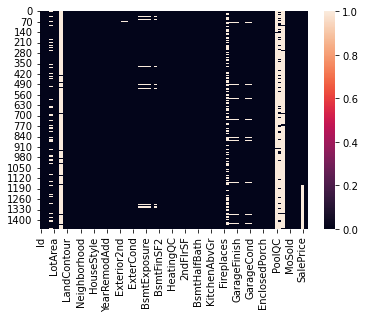

In [17]:
sns.heatmap(housing.isnull())

Here also we can see there are Null Values in our dataset.

## Information about Data (Memory Used and Data Types)

In [18]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

We can see here also that Null Values are present in our Dataset, It is showing total no of not null values are in our dataset.

## Checking if ? values present in dataset or not

In [19]:
(housing==' ?').sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [20]:
(housing==' ? ').sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [21]:
(housing=='?').sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [22]:
(housing_train=='? ').sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [23]:
(housing==' ?').sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

So, we can see there are no 0/? values in our Dataset

## Checking total number of unique value in each column of Dataset

In [24]:
housing.nunique()

Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       110
LotArea          1073
Street              2
Alley               2
LotShape            4
LandContour         4
Utilities           2
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         112
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        15
Exterior2nd        16
MasVnrType          4
MasVnrArea        327
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        637
BsmtFinType2        6
BsmtFinSF2        144
BsmtUnfSF         780
TotalBsmtSF       721
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          753
2ndFlrSF          417
LowQualFin

# Data Cleaning and preprocessing

## Checking all value of each columns

In [25]:
for i in housing.columns:
        print(housing[i].value_counts(),"\n\n", "-"*100, "\n\n")

127     1
525     1
1163    1
1291    1
731     1
575     1
774     1
940     1
36      1
1115    1
1082    1
715     1
1123    1
1077    1
1363    1
986     1
1332    1
1383    1
1315    1
791     1
694     1
1191    1
193     1
563     1
680     1
311     1
854     1
588     1
297     1
48      1
1188    1
316     1
1117    1
1019    1
991     1
666     1
545     1
815     1
1305    1
429     1
580     1
302     1
321     1
610     1
953     1
398     1
1236    1
1413    1
133     1
540     1
434     1
145     1
653     1
1140    1
1087    1
658     1
1033    1
341     1
1274    1
430     1
786     1
811     1
375     1
648     1
506     1
397     1
838     1
382     1
846     1
396     1
968     1
496     1
1392    1
1121    1
1079    1
955     1
254     1
207     1
138     1
169     1
657     1
111     1
473     1
1004    1
874     1
1042    1
905     1
439     1
1316    1
63      1
689     1
906     1
303     1
930     1
510     1
245     1
507     1
1036    1
587     1
961     1


### Since there are Null values in the dataset, so we need to treat them.

## Handling Null Values

In [26]:
#these columns consist mostly Null Values so it will not help in prediction
housing.drop(columns=['Alley', 'PoolQC', 'MiscFeature'],inplace=True)

In [27]:
#Column ID have unique value so we will drop this column
housing.drop(columns=['Id'],inplace=True)

SalePrice is our Target Column

### Filling continuous column with mean

In [28]:
housing["LotFrontage"].fillna(housing["LotFrontage"].mean(), inplace=True)

In [29]:
housing["MasVnrArea"].fillna(housing["MasVnrArea"].mean(), inplace=True)

In [30]:
housing["GarageYrBlt"].fillna(housing["GarageYrBlt"].mean(), inplace=True)

In [31]:
 categorical_feature= ['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical',
                       'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'Fence']

In [32]:
housing['Fence'].value_counts()

MnPrv    157
GdPrv     59
GdWo      54
MnWw      11
Name: Fence, dtype: int64

In [33]:
for feature in categorical_feature:
    if(housing[feature].isnull().sum()*100/len(housing))>0:
        housing[feature] = housing[feature].fillna(housing[feature].mode()[0])

In [34]:
housing.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         0
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath     

In [35]:
#checking again all values of dataset
for i in housing.columns:
        print(housing[i].value_counts(),"\n\n", "-"*100, "\n\n")

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64 

 ---------------------------------------------------------------------------------------------------- 


RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64 

 ---------------------------------------------------------------------------------------------------- 


70.049958     259
60.000000     143
70.000000      70
80.000000      69
50.000000      57
75.000000      53
65.000000      44
85.000000      40
78.000000      25
21.000000      23
90.000000      23
68.000000      19
64.000000      19
24.000000      19
73.000000      18
79.000000      17
55.000000      17
72.000000      17
63.000000      17
100.000000     16
74.000000      15
51.000000      15
66.000000      15
52.000000      14
59.000000      13
40.000000      12
57.000000    

In [36]:
#To print all columns
pd.set_option('display.max_columns',None)
#checking again Dataset
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,120,RL,70.049958,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,MnPrv,0,2,2007,WD,Normal,128000.0,train
1,20,RL,95.000000,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,MnPrv,0,10,2007,WD,Normal,268000.0,train
2,60,RL,92.000000,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,MnPrv,0,6,2007,WD,Normal,269790.0,train
3,20,RL,105.000000,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,MnPrv,0,1,2010,COD,Normal,190000.0,train
4,20,RL,70.049958,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,MnPrv,0,6,2009,WD,Normal,215000.0,train


In [37]:
housing.shape

(1460, 78)

## Descriptive Statistics

In [38]:
#To print all columns
pd.set_option('display.max_columns',None)
# Description of Dataset : works only on continuous column 
housing.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1168.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,181477.005993
std,42.300571,22.024023,9981.264932,1.382997,1.112799,30.202904,20.645407,180.569112,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,23.994583,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79105.586863
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,50.000000,70.049958,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.506164,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Observation:
* We can check that 38 columns contains Continuous data and 40 columns contains Categorical data.
* Here also we can see that in some columns min, 25%, 50% and 75% values are 0.

## Checking Description through heatmap also.

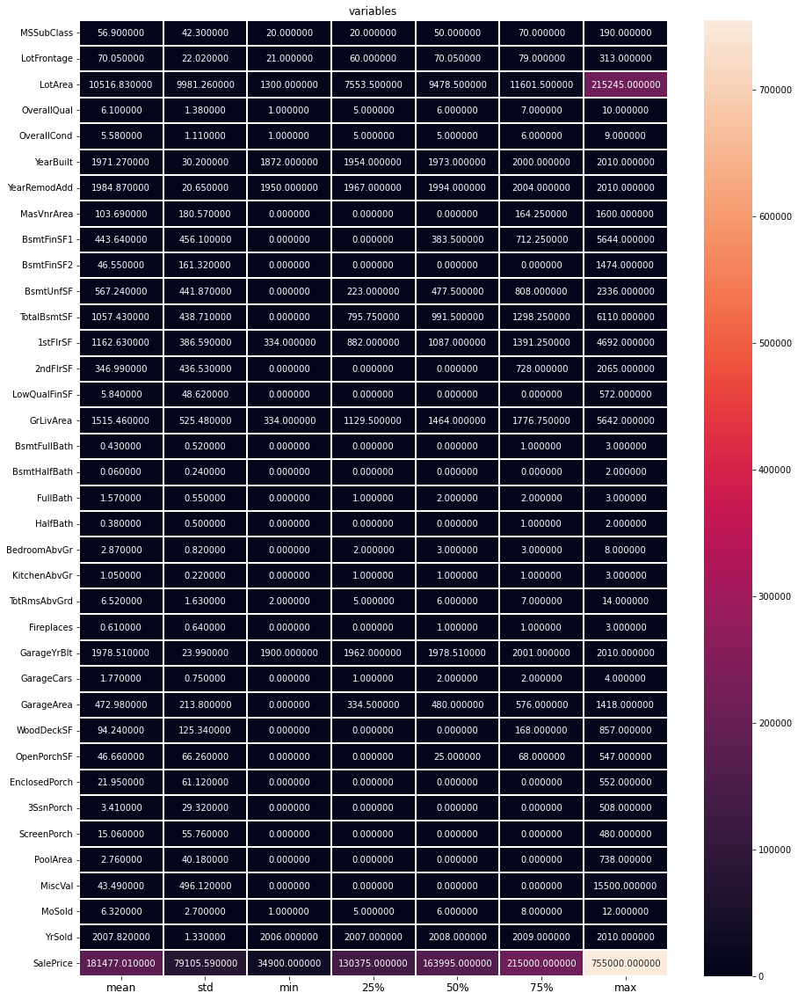

In [39]:
plt.figure(figsize=(15,20))
sns.heatmap(round(housing.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt='f')
plt.xticks(fontsize=18)
plt.xticks(fontsize=12)
plt.title('variables')
plt.show()

## Outcome of Describe of Datasets:
* We are determining Mean, Standard Deviation, Minimum and Maximum Values of each column. The summary of this dataset looks good as there are no negative/ invalid value present.
* Total No of Rows: 1460 Total No. of Columns: 78
* Describe Method works only on continuous column
* We observe that the dataset seems to be having more outliers as well as skewness in the data.

## Making DataFrame of Nominal Data

In [40]:
housing_categorical=housing[['MSZoning',  'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 
                             'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 
                             'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
                             'BsmtCond', 'BsmtExposure', 'BsmtFinType1',  'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir',
                             'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 
                             'GarageQual', 'GarageCond', 'PavedDrive', 'Fence', 'SaleType', 'SaleCondition', 'dataset']].copy()

## Making DataFrame of Continuous Data

In [41]:
housing_continuous=housing[['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 
                            'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 
                            'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 
                            'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 
                            'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 
                            'MoSold', 'YrSold', 'SalePrice']].copy()

# Data Visualization
## Univariate Analysis
## Using Countplot for categorical columns

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64


<AxesSubplot:xlabel='MSZoning', ylabel='count'>

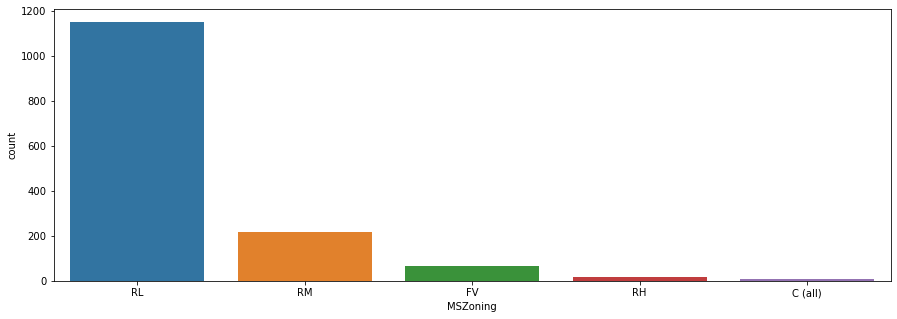

In [42]:
print(housing_categorical['MSZoning'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('MSZoning', data=housing_categorical)

'RL' MSZoning is most having Total No= 1151 and least MSZoning is C(all) having Total No= 10 out of 5 MSZoning.

Pave    1454
Grvl       6
Name: Street, dtype: int64


<AxesSubplot:xlabel='Street', ylabel='count'>

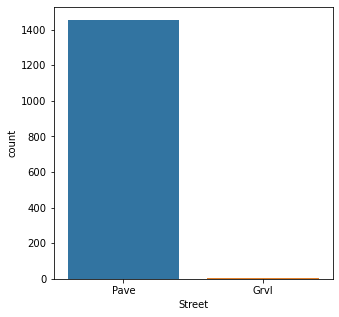

In [43]:
print(housing_categorical['Street'].value_counts())
plt.figure(figsize=(5,5))
sns.countplot('Street', data=housing_categorical)

'Pave' Street is most having Total No= 1454 and Grvl is least having Total No= 6.

Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64


<AxesSubplot:xlabel='LotShape', ylabel='count'>

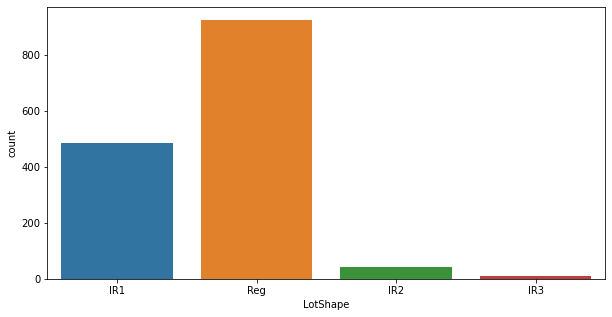

In [44]:
print(housing_categorical['LotShape'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('LotShape', data=housing_categorical)

'Reg' LotShape is most having Total No= 925 and least is IR3 having Total No= 10.

Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64


<AxesSubplot:xlabel='LandContour', ylabel='count'>

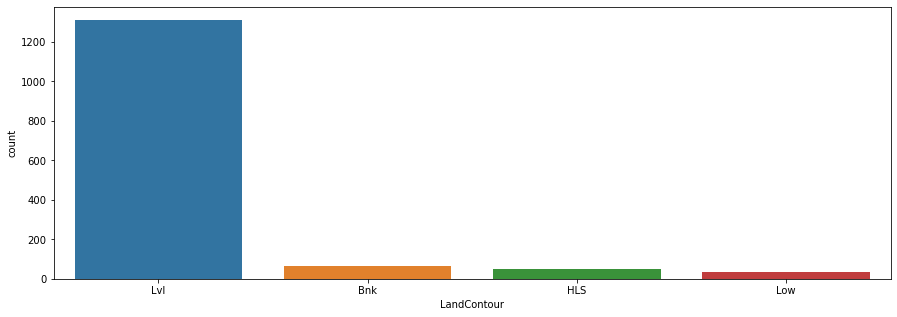

In [45]:
print(housing_categorical['LandContour'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('LandContour', data=housing_categorical)

'Lvl' LandContour is most having Total No= 1311 and least is Low having Total No= 36

AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64


<AxesSubplot:xlabel='Utilities', ylabel='count'>

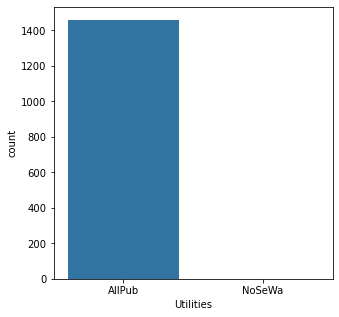

In [46]:
print(housing_categorical['Utilities'].value_counts())
plt.figure(figsize=(5,5))
sns.countplot('Utilities', data=housing_categorical)

'AllPub' Utilities is most having Total No= 1459 and NoSeWa is least having Total No= 1.

Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64


<AxesSubplot:xlabel='LotConfig', ylabel='count'>

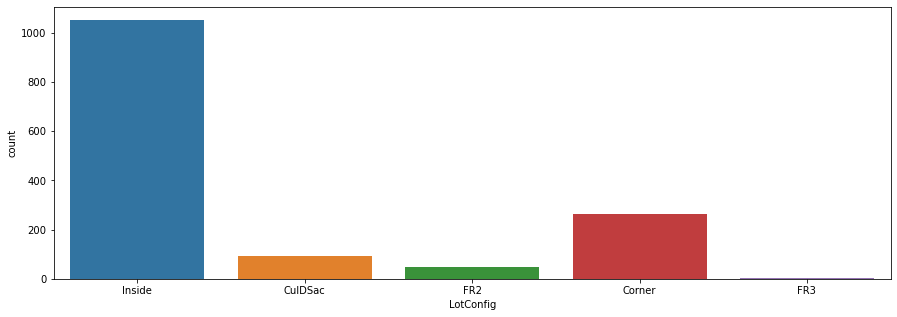

In [47]:
print(housing_categorical['LotConfig'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('LotConfig', data=housing_categorical)

'Inside' LotConfig is most having Total No= 1052 and FR3 is least having Total No= 4.

Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64


<AxesSubplot:xlabel='LandSlope', ylabel='count'>

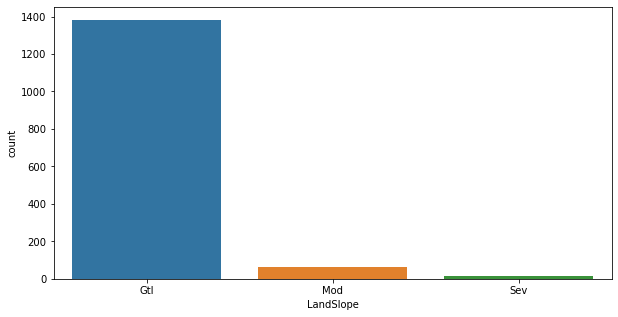

In [48]:
print(housing_categorical['LandSlope'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('LandSlope', data=housing_categorical)

'Gtl' LandSlope is most having Total No= 1382 and Sev is least having Total No= 13.

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64


<AxesSubplot:xlabel='Neighborhood', ylabel='count'>

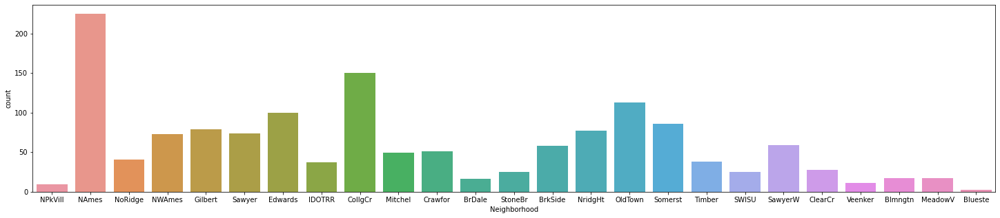

In [49]:
print(housing_categorical['Neighborhood'].value_counts())
plt.figure(figsize=(25,5))
sns.countplot('Neighborhood', data=housing_categorical)

'NAmes' Neighborhood is most having Total No= 225 and Blueste is least having Total No= 2.

Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64


<AxesSubplot:xlabel='Condition1', ylabel='count'>

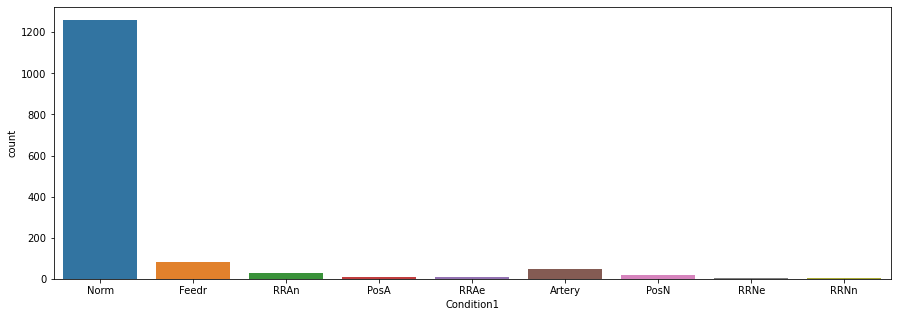

In [50]:
print(housing_categorical['Condition1'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Condition1', data=housing_categorical)

'Norm' Condition1 is the most having Total No= 1260 and RRNe is least having Total No= 2.

Norm      1445
Feedr        6
PosN         2
Artery       2
RRNn         2
RRAe         1
PosA         1
RRAn         1
Name: Condition2, dtype: int64


<AxesSubplot:xlabel='Condition2', ylabel='count'>

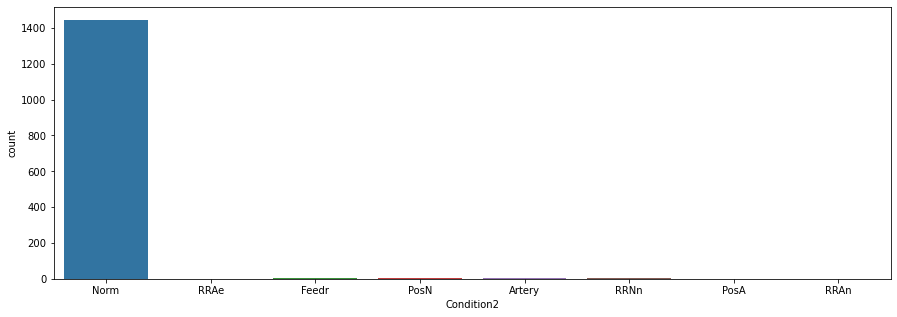

In [51]:
print(housing_categorical['Condition2'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Condition2', data=housing_categorical)

'Norm' Condition2 is the most having Total No= 1445 and RRAe, PosA & RRNe is least having Total No= 1.

1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64


<AxesSubplot:xlabel='BldgType', ylabel='count'>

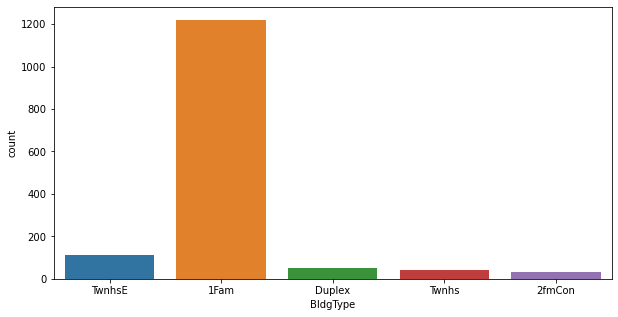

In [52]:
print(housing_categorical['BldgType'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('BldgType', data=housing_categorical)

'1Fam' BldgType is most having Total No= 1220 and 2fmCon is least having Total No= 31

1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64


<AxesSubplot:xlabel='HouseStyle', ylabel='count'>

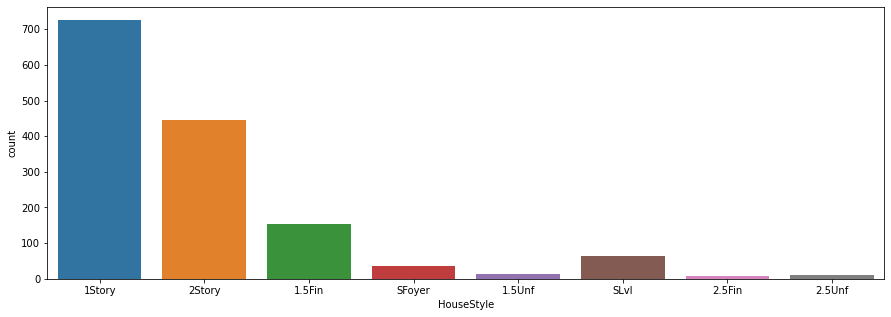

In [53]:
print(housing_categorical['HouseStyle'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('HouseStyle', data=housing_categorical)

'1Story' HouseStyle is most having Total No= 726 and 2.5Fin is least having Total No= 8

Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64


<AxesSubplot:xlabel='RoofStyle', ylabel='count'>

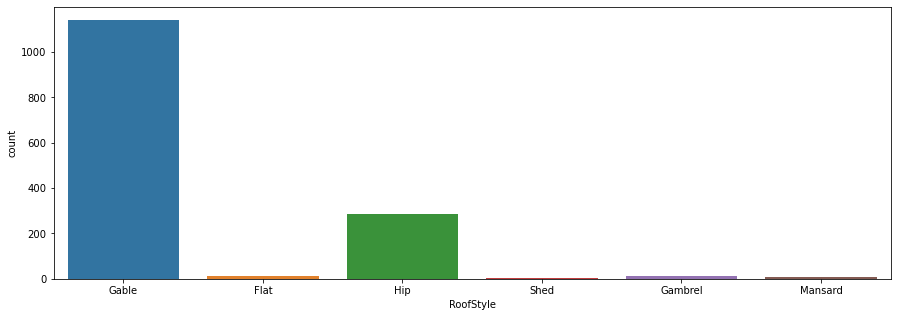

In [54]:
print(housing_categorical['RoofStyle'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('RoofStyle', data=housing_categorical)

Gable RoofStyle is most having Total No= 1141 and Shed is least having Total No= 2

CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
Roll          1
ClyTile       1
Metal         1
Membran       1
Name: RoofMatl, dtype: int64


<AxesSubplot:xlabel='RoofMatl', ylabel='count'>

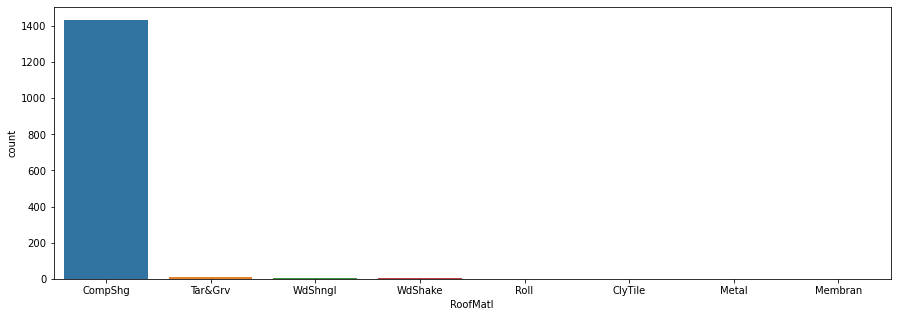

In [55]:
print(housing_categorical['RoofMatl'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('RoofMatl', data=housing_categorical)

'CompShg' RoofMatl is most having Total No= 1434 and 'Roll', 'ClyTile', 'Metal' & 'Membran' is least having Total No= 1

VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
Stone        2
BrkComm      2
AsphShn      1
ImStucc      1
CBlock       1
Name: Exterior1st, dtype: int64


<AxesSubplot:xlabel='Exterior1st', ylabel='count'>

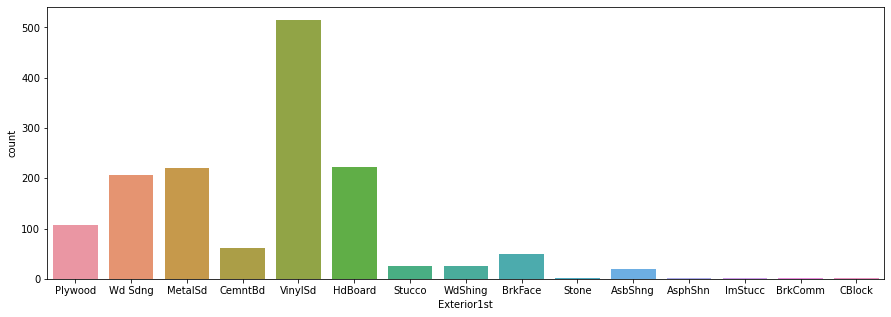

In [56]:
print(housing_categorical['Exterior1st'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Exterior1st', data=housing_categorical)

'VinylSd' Exterior1st is most having Total No= 515 and 'AsphShn', 'ImStucc' & 'CBlock' is least having Total No= 1

VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CmentBd     60
Wd Shng     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        5
AsphShn      3
Other        1
CBlock       1
Name: Exterior2nd, dtype: int64


<AxesSubplot:xlabel='Exterior2nd', ylabel='count'>

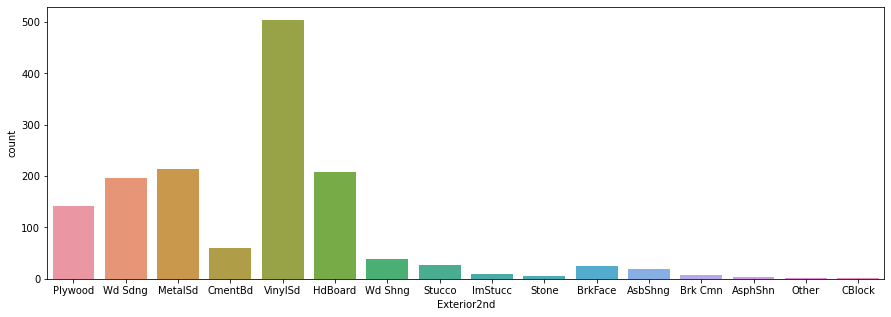

In [57]:
print(housing_categorical['Exterior2nd'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Exterior2nd', data=housing_categorical)

'VinylSd' Exterior2nd is most having Total No= 504 and 'Other' & 'CBlock' is least having Total No= 1

None       872
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64


<AxesSubplot:xlabel='MasVnrType', ylabel='count'>

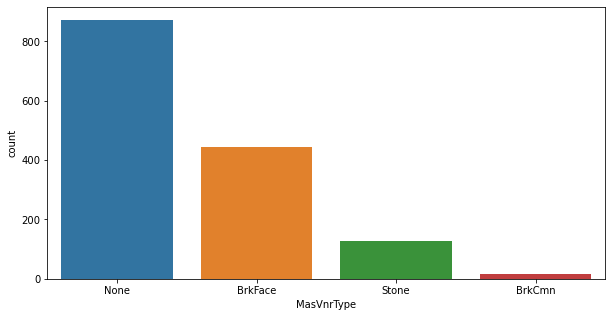

In [58]:
print(housing_categorical['MasVnrType'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('MasVnrType', data=housing_categorical)

'None' MasVnrType is most having Total No= 872 and 'BrkCmn' is least having Total No= 15

TA    906
Gd    488
Ex     52
Fa     14
Name: ExterQual, dtype: int64


<AxesSubplot:xlabel='ExterQual', ylabel='count'>

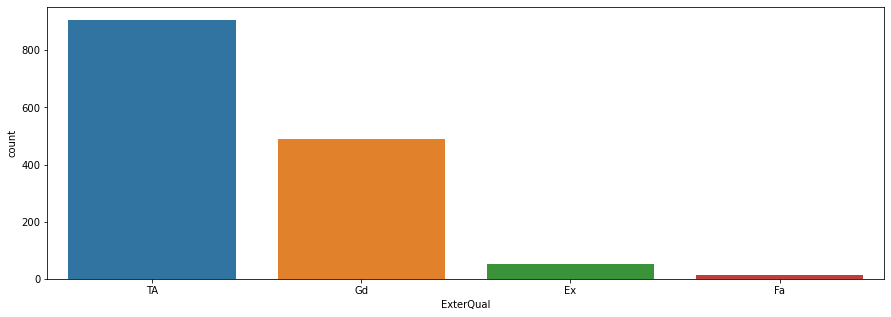

In [59]:
print(housing_categorical['ExterQual'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('ExterQual', data=housing_categorical)

'TA' ExterQual is most having Total No= 906 and 'Fa' is least having Total No= 14.

TA    1282
Gd     146
Fa      28
Ex       3
Po       1
Name: ExterCond, dtype: int64


<AxesSubplot:xlabel='ExterCond', ylabel='count'>

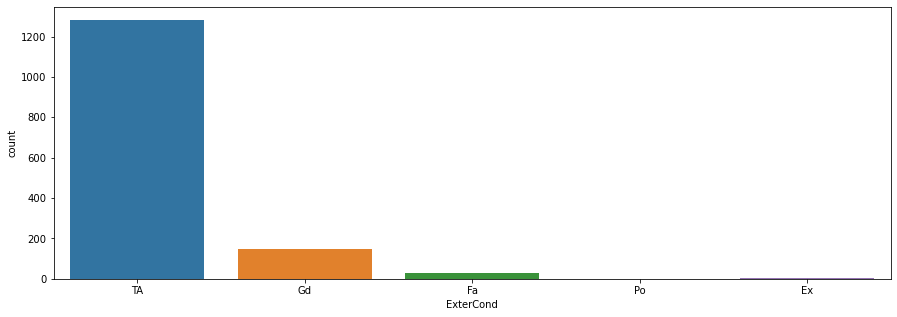

In [60]:
print(housing_categorical['ExterCond'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('ExterCond', data=housing_categorical)

'TA' ExterCond is most having Total No= 1282 and 'Po' is least having Total No= 1

PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64


<AxesSubplot:xlabel='Foundation', ylabel='count'>

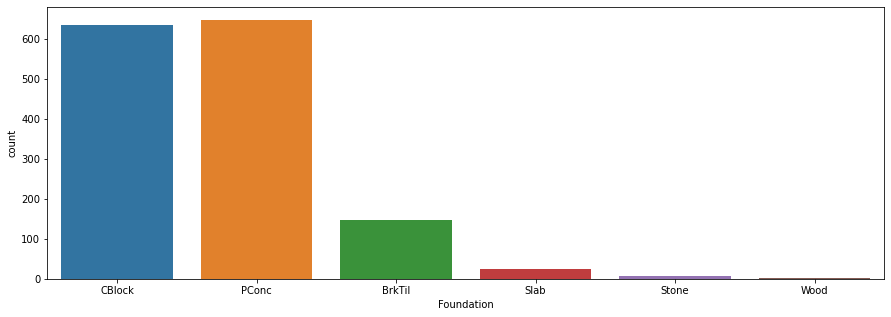

In [61]:
print(housing_categorical['Foundation'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Foundation', data=housing_categorical)

'PConc' Foundation is most having Total No= 647 and 'Wood' is least having Total No= 3

TA    686
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64


<AxesSubplot:xlabel='BsmtQual', ylabel='count'>

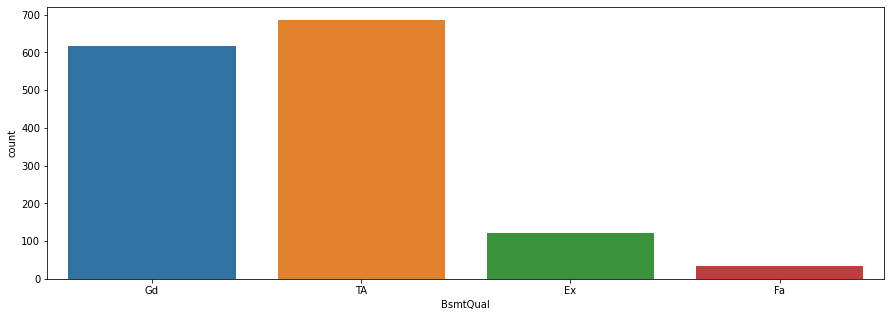

In [62]:
print(housing_categorical['BsmtQual'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('BsmtQual', data=housing_categorical)

'TA' BsmtQual is most having Total No= 686 and 'Fa' is least having Total No= 35

TA    1348
Gd      65
Fa      45
Po       2
Name: BsmtCond, dtype: int64


<AxesSubplot:xlabel='BsmtCond', ylabel='count'>

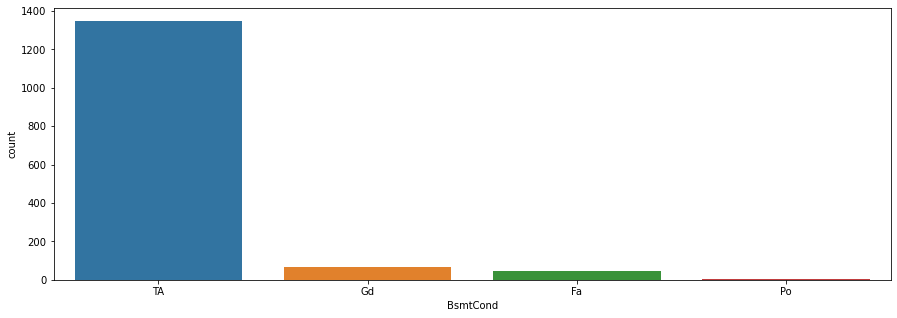

In [63]:
print(housing_categorical['BsmtCond'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('BsmtCond', data=housing_categorical)

'TA' BsmtCond is most having Total No= 1348 and 'Po' is least having Total No= 2

No    991
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64


<AxesSubplot:xlabel='BsmtExposure', ylabel='count'>

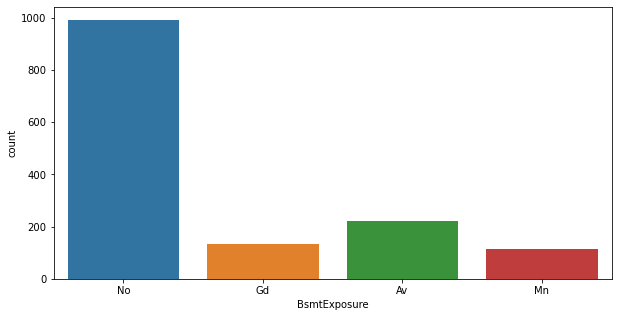

In [64]:
print(housing_categorical['BsmtExposure'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('BsmtExposure', data=housing_categorical)

'No' BsmtExposure is most having Total No= 991 and 'Mn' is least having Total No= 114

Unf    467
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64


<AxesSubplot:xlabel='BsmtFinType1', ylabel='count'>

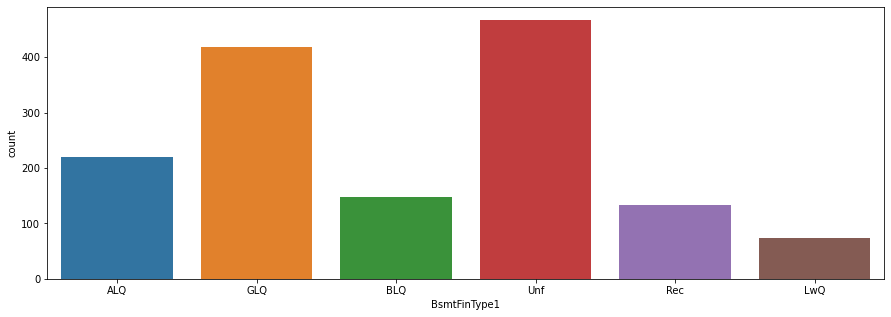

In [65]:
print(housing_categorical['BsmtFinType1'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('BsmtFinType1', data=housing_categorical)

'Unf' BsmtFinType1 is most having Total No= 467 and 'LwQ' is least having Total No= 74

Unf    1294
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64


<AxesSubplot:xlabel='BsmtFinType2', ylabel='count'>

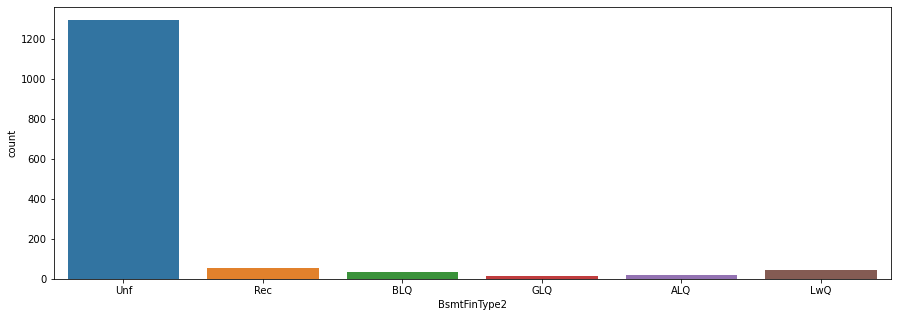

In [66]:
print(housing_categorical['BsmtFinType2'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('BsmtFinType2', data=housing_categorical)

'Unf' BsmtFinType2 is most having Total No= 1294 and 'GLQ' is least having Total No= 14

GasA     1428
GasW       18
Grav        7
Wall        4
OthW        2
Floor       1
Name: Heating, dtype: int64


<AxesSubplot:xlabel='Heating', ylabel='count'>

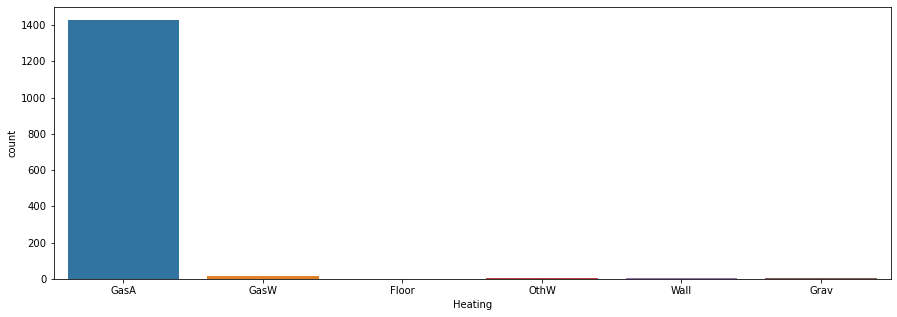

In [67]:
print(housing_categorical['Heating'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Heating', data=housing_categorical)

'GasA' Heating is most having Total No= 1434 and 'Floor' is least having Total No= 1

Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: HeatingQC, dtype: int64


<AxesSubplot:xlabel='HeatingQC', ylabel='count'>

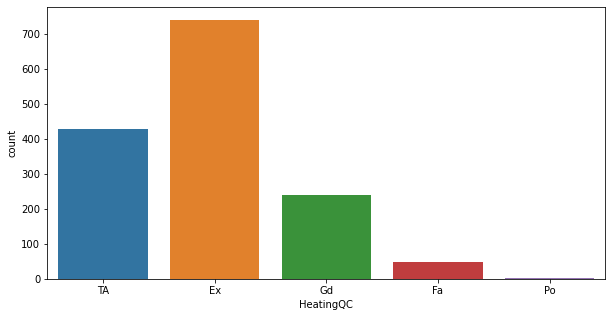

In [68]:
print(housing_categorical['HeatingQC'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('HeatingQC', data=housing_categorical)

'Ex' HeatingQC is most having Total No= 741 and 'Po' is least having Total No= 1

Y    1365
N      95
Name: CentralAir, dtype: int64


<AxesSubplot:xlabel='CentralAir', ylabel='count'>

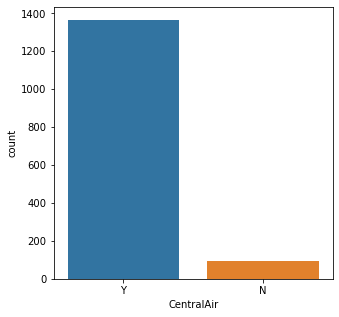

In [69]:
print(housing_categorical['CentralAir'].value_counts())
plt.figure(figsize=(5,5))
sns.countplot('CentralAir', data=housing_categorical)

'Y' CentralAir is most having Total No= 1365 and 'N' is least having Total No= 95

SBrkr    1335
FuseA      94
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64


<AxesSubplot:xlabel='Electrical', ylabel='count'>

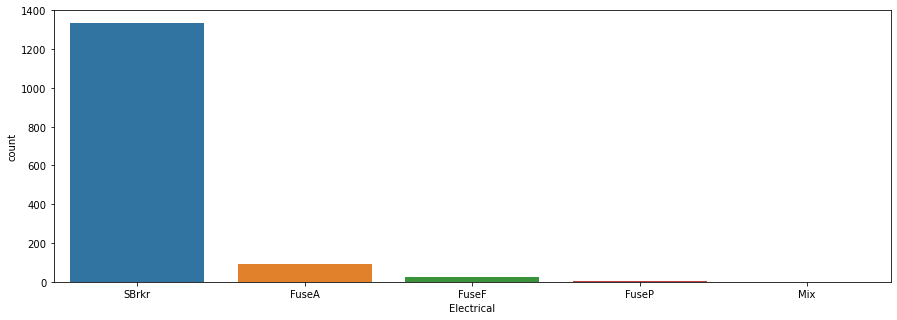

In [70]:
print(housing_categorical['Electrical'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Electrical', data=housing_categorical)

'SBrkr' Electrical is most having Total No= 1335 and 'Mix' is least having Total No= 1

TA    735
Gd    586
Ex    100
Fa     39
Name: KitchenQual, dtype: int64


<AxesSubplot:xlabel='KitchenQual', ylabel='count'>

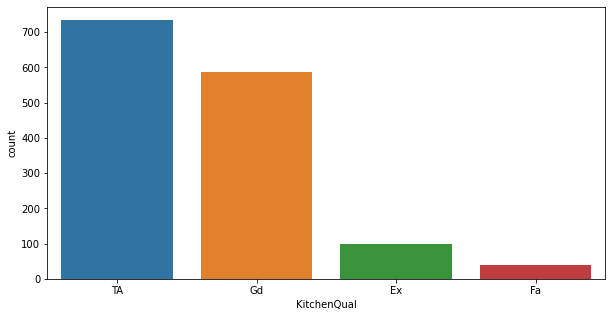

In [71]:
print(housing_categorical['KitchenQual'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('KitchenQual', data=housing_categorical)

'TA' KitchenQual is most having Total No= 735 and 'Fa' is least having Total No= 39

Typ     1360
Min2      34
Min1      31
Mod       15
Maj1      14
Maj2       5
Sev        1
Name: Functional, dtype: int64


<AxesSubplot:xlabel='Functional', ylabel='count'>

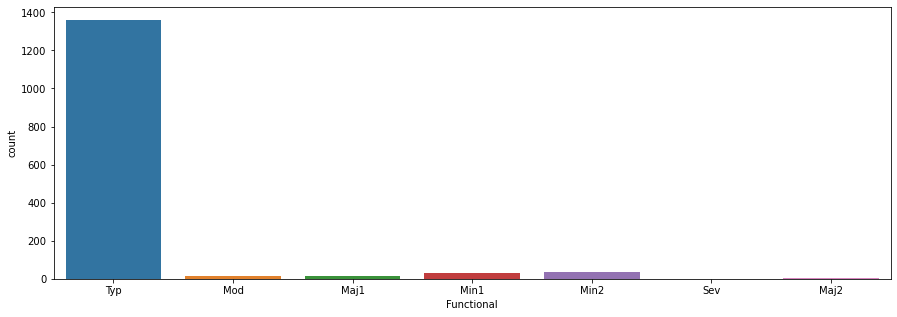

In [72]:
print(housing_categorical['Functional'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Functional', data=housing_categorical)

'Typ' Functional is most having Total No= 1360 and 'Sev' is least having Total No= 1

Gd    1070
TA     313
Fa      33
Ex      24
Po      20
Name: FireplaceQu, dtype: int64


<AxesSubplot:xlabel='FireplaceQu', ylabel='count'>

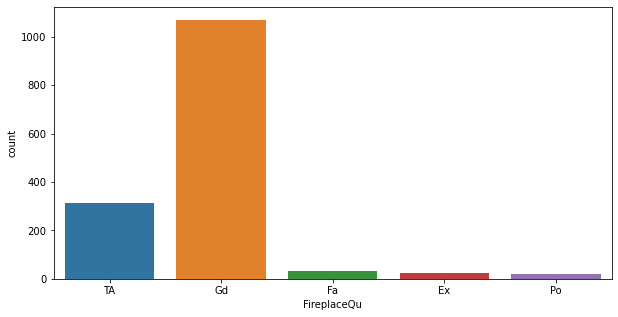

In [73]:
print(housing_categorical['FireplaceQu'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('FireplaceQu', data=housing_categorical)

'Gd' FireplaceQu is most having Total No= 1070 and 'Po' is least having Total No= 20

Attchd     951
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64


<AxesSubplot:xlabel='GarageType', ylabel='count'>

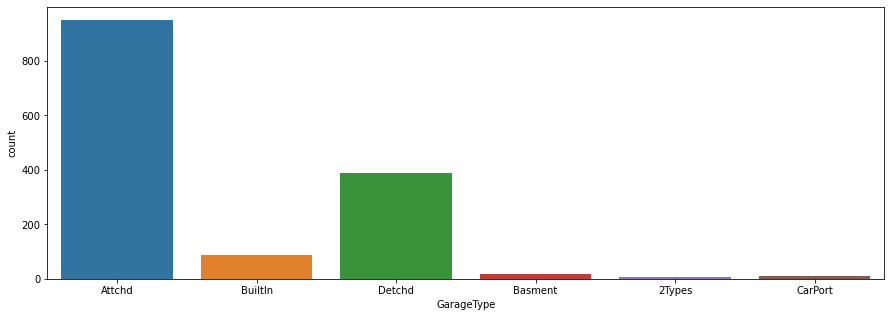

In [74]:
print(housing_categorical['GarageType'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('GarageType', data=housing_categorical)

'Attchd' GarageType is most having Total No= 951 and '2Types' is least having Total No= 6

Unf    686
RFn    422
Fin    352
Name: GarageFinish, dtype: int64


<AxesSubplot:xlabel='GarageFinish', ylabel='count'>

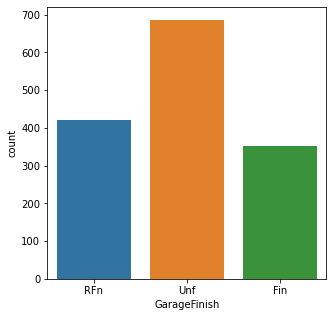

In [75]:
print(housing_categorical['GarageFinish'].value_counts())
plt.figure(figsize=(5,5))
sns.countplot('GarageFinish', data=housing_categorical)

'Unf' GarageFinish is most having Total No= 686 and 'Fin' is least having Total No= 352

TA    1392
Fa      48
Gd      14
Ex       3
Po       3
Name: GarageQual, dtype: int64


<AxesSubplot:xlabel='GarageQual', ylabel='count'>

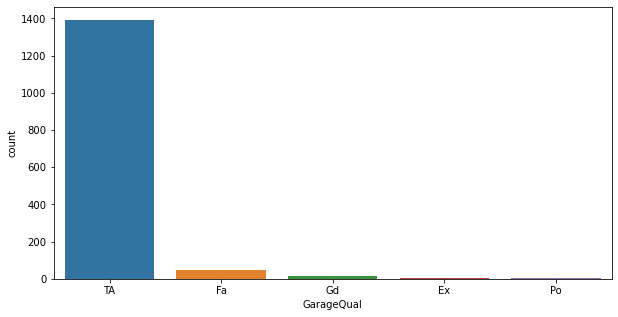

In [76]:
print(housing_categorical['GarageQual'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('GarageQual', data=housing_categorical)

'TA' GarageQual is most having Total No= 1392 and 'Po' is least having Total No= 3

TA    1407
Fa      35
Gd       9
Po       7
Ex       2
Name: GarageCond, dtype: int64


<AxesSubplot:xlabel='GarageCond', ylabel='count'>

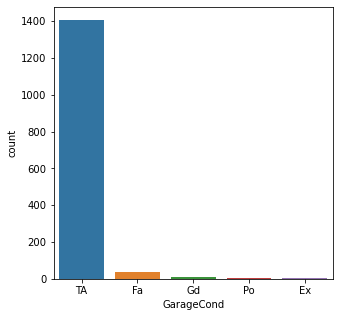

In [77]:
print(housing_categorical['GarageCond'].value_counts())
plt.figure(figsize=(5,5))
sns.countplot('GarageCond', data=housing_categorical)

TA GarageCond is most having Total No= 1407 and 'Ex' is least having Total No= 2.

Y    1340
N      90
P      30
Name: PavedDrive, dtype: int64


<AxesSubplot:xlabel='PavedDrive', ylabel='count'>

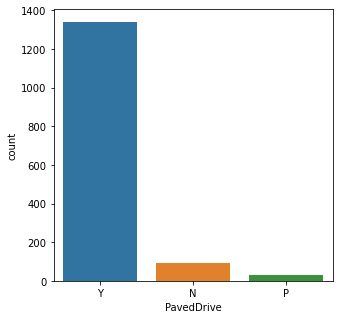

In [78]:
print(housing_categorical['PavedDrive'].value_counts())
plt.figure(figsize=(5,5))
sns.countplot('PavedDrive', data=housing_categorical)

Y PavedDrive is most having Total No= 1340 and 'Po' is least having Total No= 30.

MnPrv    1336
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64


<AxesSubplot:xlabel='Fence', ylabel='count'>

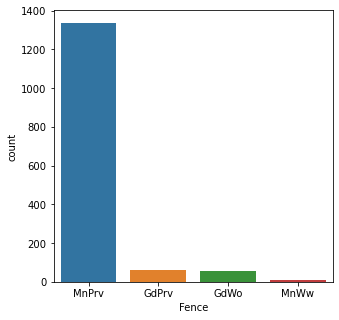

In [79]:
print(housing_categorical['Fence'].value_counts())
plt.figure(figsize=(5,5))
sns.countplot('Fence', data=housing_categorical)

'MnPrv' Fence is most having Total No= 1336 and 'Po' is least having Total No= 11.

WD       1267
New       122
COD        43
ConLD       9
ConLI       5
ConLw       5
CWD         4
Oth         3
Con         2
Name: SaleType, dtype: int64


<AxesSubplot:xlabel='SaleType', ylabel='count'>

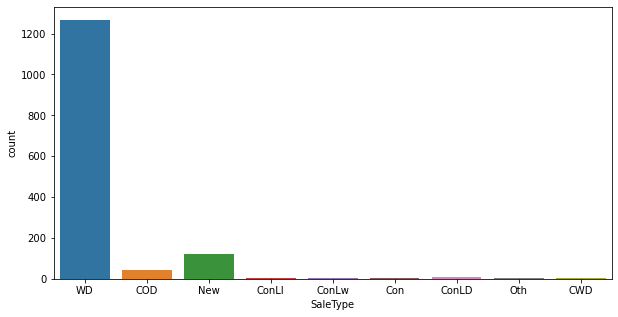

In [80]:
print(housing_categorical['SaleType'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('SaleType', data=housing_categorical)

'WD' SaleType is highest having Total No= 1267 and 'Con' is least having Total No= 2.

Normal     1198
Partial     125
Abnorml     101
Family       20
Alloca       12
AdjLand       4
Name: SaleCondition, dtype: int64


<AxesSubplot:xlabel='SaleCondition', ylabel='count'>

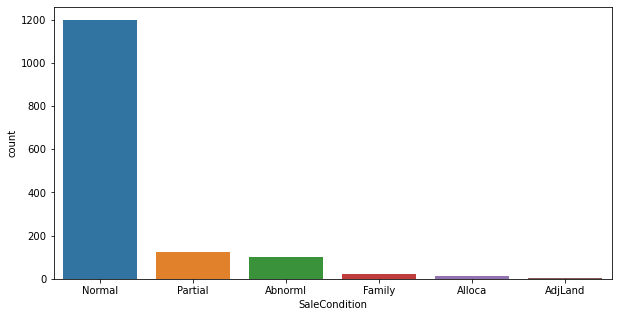

In [81]:
print(housing_categorical['SaleCondition'].value_counts())
plt.figure(figsize=(10,5))
sns.countplot('SaleCondition', data=housing_categorical)

'Normal' SaleCondition is most having Total No= 1198 and 'AdjLand' is least having Total No= 4.

## Using Histplot for Continuous Columns

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64


<AxesSubplot:xlabel='MSSubClass', ylabel='Count'>

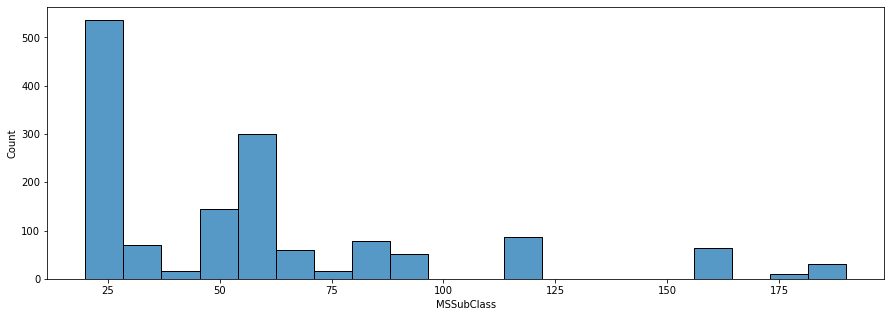

In [82]:
print(housing_continuous['MSSubClass'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='MSSubClass', data=housing_continuous)

Mostly MSSubClass of houses is "20" having Total No= 536 and least is "40" having Total No= 4.

70.049958     259
60.000000     143
70.000000      70
80.000000      69
50.000000      57
75.000000      53
65.000000      44
85.000000      40
78.000000      25
21.000000      23
90.000000      23
68.000000      19
64.000000      19
24.000000      19
73.000000      18
79.000000      17
55.000000      17
72.000000      17
63.000000      17
100.000000     16
74.000000      15
51.000000      15
66.000000      15
52.000000      14
59.000000      13
40.000000      12
57.000000      12
43.000000      12
82.000000      12
71.000000      12
67.000000      12
76.000000      11
69.000000      11
86.000000      10
53.000000      10
92.000000      10
88.000000      10
34.000000      10
44.000000       9
35.000000       9
62.000000       9
77.000000       9
84.000000       9
96.000000       8
93.000000       8
61.000000       8
98.000000       8
95.000000       7
58.000000       7
120.000000      7
107.000000      7
110.000000      6
36.000000       6
89.000000       6
41.000000       6
94.000000 

<AxesSubplot:xlabel='LotFrontage', ylabel='Count'>

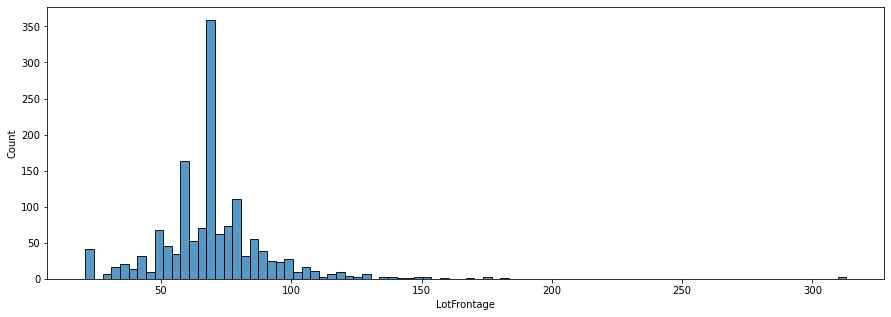

In [83]:
print(housing_continuous['LotFrontage'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='LotFrontage', data=housing_continuous)

Mostly LotFrontage of houses is "70.049958" having Total No= 259.

7200      25
9600      24
6000      17
9000      14
8400      14
10800     14
1680      10
7500       9
8125       8
9100       8
6240       8
6120       8
3182       7
7800       6
8450       6
5000       5
5400       5
4435       5
9750       5
4500       5
10140      5
10400      5
10000      5
10625      4
8500       4
8520       4
7000       4
9375       4
11250      4
8800       4
7018       4
6600       4
8640       4
11700      4
8544       4
9900       4
13125      4
8750       4
8000       3
9084       3
2117       3
11500      3
7750       3
10200      3
6762       3
8777       3
13891      3
11600      3
2280       3
12090      3
10500      3
8712       3
9120       3
10440      3
8012       3
3675       3
7875       3
4426       3
2522       3
14115      3
9920       3
9200       3
7892       2
9350       2
8100       2
11900      2
9819       2
21750      2
14000      2
12160      2
10120      2
12342      2
6292       2
10084      2
8773       2
9937       2
8846       2

<AxesSubplot:xlabel='LotArea', ylabel='Count'>

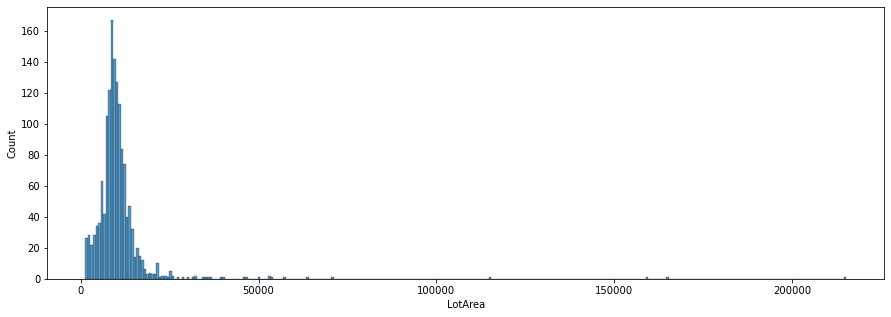

In [84]:
print(housing_continuous['LotArea'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='LotArea', data=housing_continuous)

Mostly LotArea of houses is "7200" having Total No= 25.

5     397
6     374
7     319
8     168
4     116
9      43
3      20
10     18
2       3
1       2
Name: OverallQual, dtype: int64


<AxesSubplot:xlabel='OverallQual', ylabel='Count'>

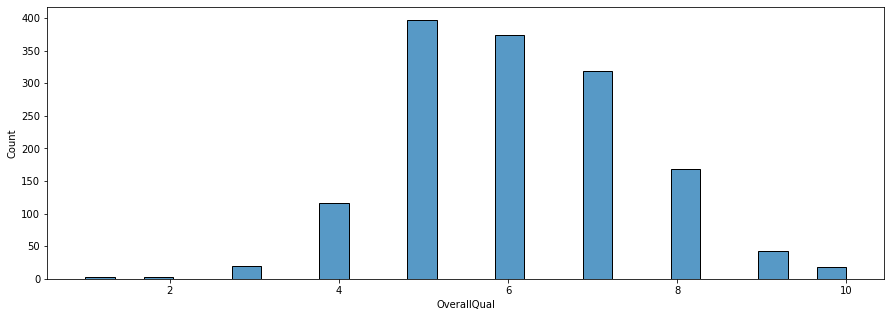

In [85]:
print(housing_continuous['OverallQual'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='OverallQual', data=housing_continuous)

Mostly LotArea of houses is "5" having Total No= 397 and least is "1" having Total No= 2

5    821
6    252
7    205
8     72
4     57
3     25
9     22
2      5
1      1
Name: OverallCond, dtype: int64


<AxesSubplot:xlabel='OverallCond', ylabel='Count'>

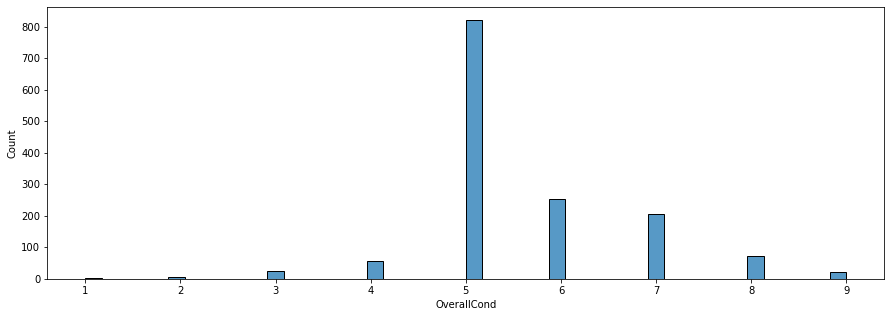

In [86]:
print(housing_continuous['OverallCond'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='OverallCond', data=housing_continuous)

Mostly Overall Condition of house is "5" having Total No= 821 and least is "1" having Total No= 1

2006    67
2005    64
2004    54
2007    49
2003    45
1976    33
1977    32
1920    30
1959    26
1999    25
1998    25
1954    24
1970    24
2000    24
1958    24
1965    24
1972    23
2008    23
2002    23
1968    22
1971    22
1957    20
2001    20
1950    20
1962    19
1994    19
1940    18
1995    18
1966    18
2009    18
1960    17
1910    17
1993    17
1967    16
1963    16
1925    16
1955    16
1978    16
1964    15
1996    15
1941    15
1956    14
1961    14
1948    14
1969    14
1997    14
1992    13
1949    12
1990    12
1953    12
1988    11
1973    11
1974    10
1980    10
1900    10
1915    10
1979     9
1930     9
1926     9
1984     9
1936     9
1939     8
1916     8
1922     8
1975     8
1946     7
1924     7
1923     7
1914     7
1918     7
1928     7
1935     6
1945     6
1951     6
1931     6
1982     6
1921     6
1952     5
1991     5
1981     5
1947     5
1986     5
1985     5
1937     5
1880     4
1938     4
1932     4
1983     4
1929     4
1912     3
1934     3

<AxesSubplot:xlabel='YearBuilt', ylabel='Count'>

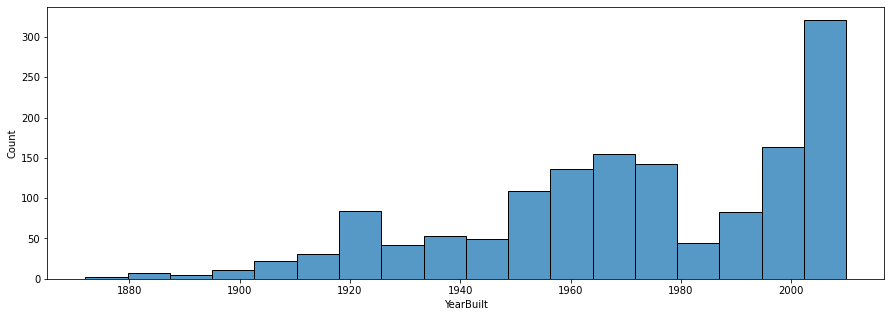

In [87]:
print(housing_continuous['YearBuilt'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='YearBuilt', data=housing_continuous)

Houses Built in Year "2006" is most having Total No= 67.

1950    178
2006     97
2007     76
2005     73
2004     62
2000     55
2003     51
2002     48
2008     40
1998     36
1996     36
1995     31
1976     30
1999     30
1970     26
1997     25
1977     25
2009     23
1994     22
2001     21
1972     20
1993     19
1965     19
1971     18
1959     18
1968     17
1992     17
1978     16
1958     15
1990     15
1966     15
1954     14
1969     14
1962     14
1991     14
1963     13
1967     12
1960     12
1980     12
1964     11
1973     11
1989     11
1956     10
1987     10
1979     10
1953     10
1975     10
1957      9
1955      9
1985      9
1988      9
1961      8
1981      8
1982      7
1984      7
1974      7
2010      6
1986      5
1983      5
1952      5
1951      4
Name: YearRemodAdd, dtype: int64


<AxesSubplot:xlabel='YearRemodAdd', ylabel='Count'>

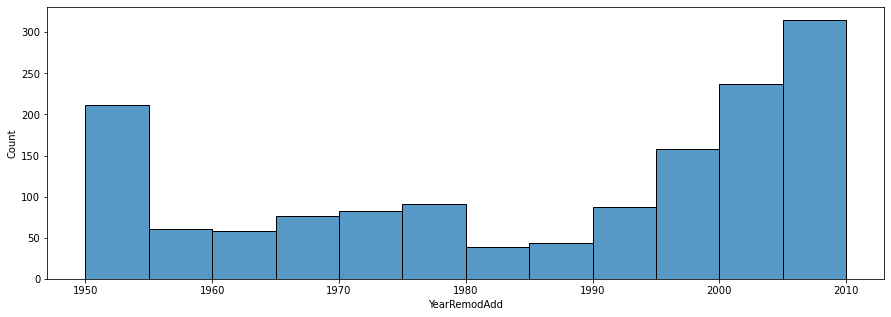

In [88]:
print(housing_continuous['YearRemodAdd'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='YearRemodAdd', data=housing_continuous)

Mostly YearRemodAdd of houses is "1950" having Total No= 178 and least is "1951" having Total No= 4

0.000000       861
72.000000        8
180.000000       8
108.000000       8
103.685262       8
16.000000        7
120.000000       7
200.000000       6
80.000000        6
340.000000       6
106.000000       6
320.000000       5
170.000000       5
360.000000       5
84.000000        5
132.000000       5
178.000000       4
196.000000       4
210.000000       4
270.000000       4
252.000000       4
183.000000       4
40.000000        4
76.000000        4
246.000000       4
100.000000       4
456.000000       4
336.000000       4
160.000000       4
168.000000       4
216.000000       4
268.000000       4
220.000000       4
300.000000       4
288.000000       4
186.000000       3
136.000000       3
272.000000       3
312.000000       3
116.000000       3
256.000000       3
44.000000        3
240.000000       3
70.000000        3
74.000000        3
99.000000        3
226.000000       3
420.000000       3
104.000000       3
128.000000       3
208.000000       3
90.000000        3
166.000000  

<AxesSubplot:xlabel='MasVnrArea', ylabel='Count'>

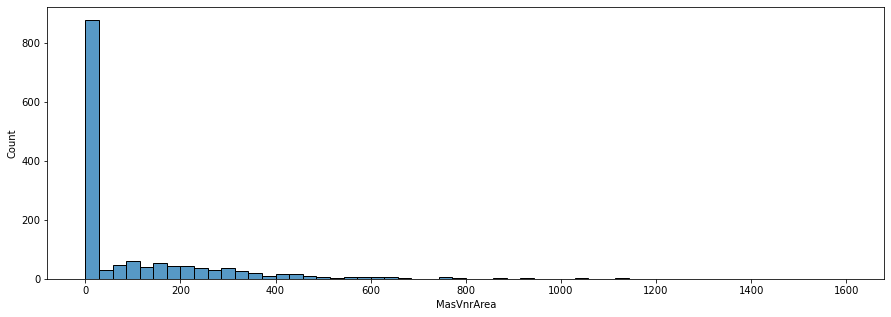

In [89]:
print(housing_continuous['MasVnrArea'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='MasVnrArea', data=housing_continuous)

Mostly MasVnrArea of houses is "0.000000" having Total No= 861.

0       467
24       12
16        9
686       5
662       5
20        5
616       5
936       5
428       4
1200      4
495       4
547       4
655       4
588       4
312       4
560       4
553       4
641       4
504       4
360       4
600       4
400       4
442       4
697       4
300       4
384       4
904       3
250       3
450       3
180       3
767       3
732       3
733       3
196       3
297       3
633       3
1218      3
672       3
340       3
288       3
626       3
685       3
120       3
624       3
570       3
690       3
625       3
210       3
403       3
565       3
1056      3
28        3
1036      3
812       3
528       3
500       3
789       3
659       3
643       3
660       3
1201      3
786       3
1300      3
816       3
828       3
247       3
700       3
378       3
648       3
425       3
569       3
680       3
695       3
182       3
507       3
168       3
490       3
456       3
1274      3
280       3
595       3
336       3
674       3
338 

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='Count'>

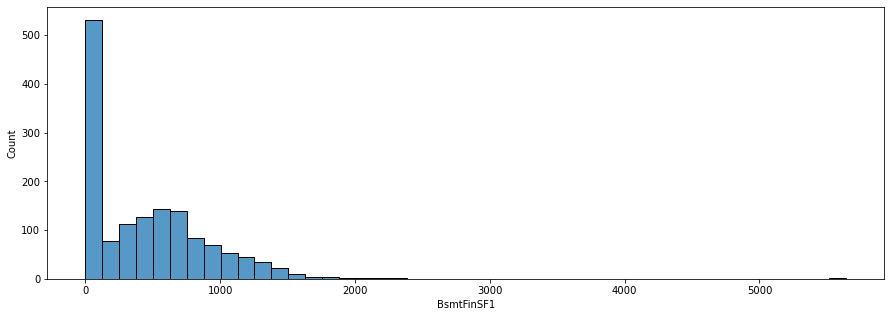

In [90]:
print(housing_continuous['BsmtFinSF1'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='BsmtFinSF1', data=housing_continuous)

Mostly BsmtFinSF1 of houses is "0" having Total No= 467.

0       1293
180        5
374        3
290        2
117        2
182        2
294        2
96         2
712        2
287        2
64         2
551        2
480        2
147        2
391        2
93         2
279        2
469        2
41         2
539        2
468        2
264        1
1057       1
377        1
630        1
208        1
276        1
580        1
173        1
500        1
627        1
311        1
1063       1
125        1
612        1
219        1
375        1
344        1
1061       1
81         1
441        1
144        1
620        1
906        1
972        1
139        1
557        1
345        1
354        1
352        1
119        1
1085       1
668        1
105        1
544        1
165        1
713        1
465        1
600        1
506        1
820        1
273        1
492        1
420        1
169        1
215        1
174        1
499        1
546        1
400        1
841        1
175        1
184        1
163        1
32         1
334        1
768        1

<AxesSubplot:xlabel='BsmtFinSF2', ylabel='Count'>

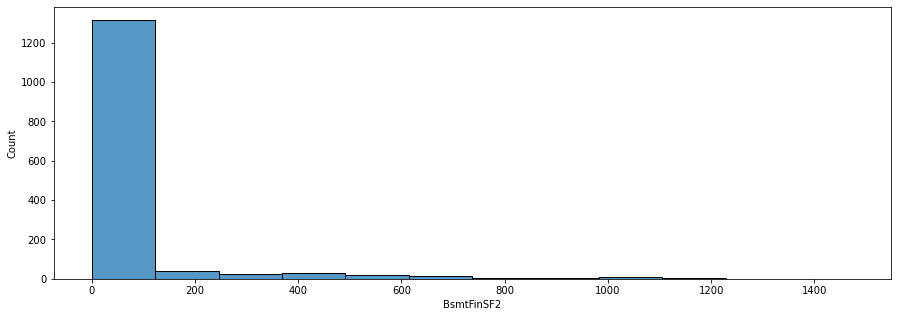

In [91]:
print(housing_continuous['BsmtFinSF2'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='BsmtFinSF2', data=housing_continuous)

Mostly BsmtFinSF2 of houses is "0" having Total No= 1293.

0       118
728       9
384       8
600       7
300       7
572       7
270       6
625       6
672       6
440       6
280       6
80        5
319       5
326       5
264       5
216       5
698       5
108       5
490       5
390       5
162       5
816       5
410       5
847       4
92        4
912       4
336       4
747       4
312       4
660       4
276       4
684       4
186       4
168       4
125       4
611       4
100       4
884       4
324       4
163       4
544       4
768       4
340       4
88        4
350       4
638       4
36        4
396       4
536       4
556       4
115       4
192       4
360       4
840       4
420       4
284       4
780       4
392       4
210       3
540       3
594       3
710       3
808       3
864       3
252       3
700       3
506       3
628       3
546       3
702       3
402       3
173       3
460       3
484       3
342       3
75        3
114       3
180       3
133       3
952       3
135       3
630       3
408       3
612 

<AxesSubplot:xlabel='BsmtUnfSF', ylabel='Count'>

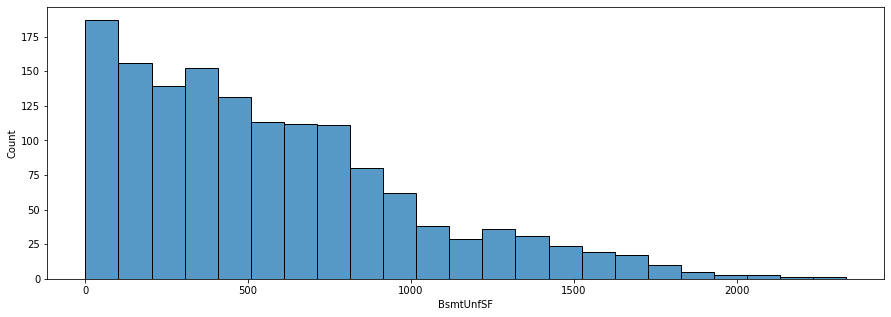

In [92]:
print(housing_continuous['BsmtUnfSF'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='BsmtUnfSF', data=housing_continuous)

Mostly BsmtUnfSF of houses is "0" having Total No= 118.

0       37
864     35
672     17
912     15
1040    14
816     13
768     12
728     12
780     11
894     11
848     11
832     10
952      9
756      9
630      9
936      8
1056     8
720      7
384      7
600      7
483      7
840      7
1008     7
1362     6
858      6
884      6
876      6
1392     6
796      6
793      5
896      5
684      5
1092     5
1728     5
992      5
990      5
928      5
686      5
970      5
1144     5
1440     5
960      5
980      4
804      4
1078     4
880      4
588      4
660      4
1494     4
616      4
747      4
1188     4
1208     4
855      4
689      4
910      4
847      4
764      4
1050     4
1057     4
1026     4
1064     4
1029     4
546      4
784      4
735      4
698      4
1080     4
1314     4
924      4
729      3
1128     3
1686     3
1010     3
901      3
1626     3
1063     3
978      3
1152     3
1073     3
1466     3
1470     3
1053     3
440      3
1145     3
1088     3
1268     3
845      3
1573     3
1200     3
1004     3

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='Count'>

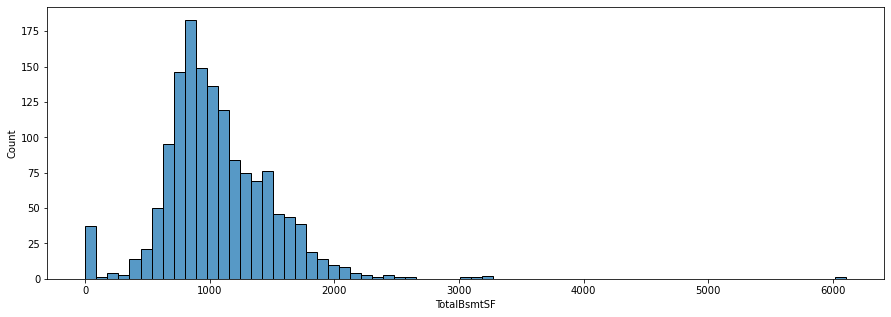

In [93]:
print(housing_continuous['TotalBsmtSF'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='TotalBsmtSF', data=housing_continuous)

Mostly TotalBsmtSF of houses is "0" having Total No= 37.

864     25
1040    16
912     14
894     12
848     12
672     11
630      9
816      9
483      7
960      7
936      7
832      7
840      6
720      6
1728     6
1056     6
990      6
882      6
764      6
728      6
858      5
616      5
520      5
948      5
774      5
798      5
1236     5
1494     5
1072     5
698      5
958      5
796      5
1120     5
1392     5
988      5
1088     5
780      5
804      5
1422     5
1080     5
1314     5
1026     5
768      5
1200     5
980      5
1144     5
810      4
866      4
952      4
860      4
1337     4
1053     4
902      4
1442     4
1440     4
884      4
756      4
892      4
1048     4
1128     4
1050     4
1057     4
1164     4
1092     4
900      4
1086     4
1004     4
928      4
970      4
1188     4
1328     4
847      4
1306     4
1022     4
1136     4
855      4
1268     3
1077     3
944      3
1212     3
742      3
1478     3
1060     3
1052     3
1148     3
1258     3
1276     3
904      3
910      3
1504     3
1252     3

<AxesSubplot:xlabel='1stFlrSF', ylabel='Count'>

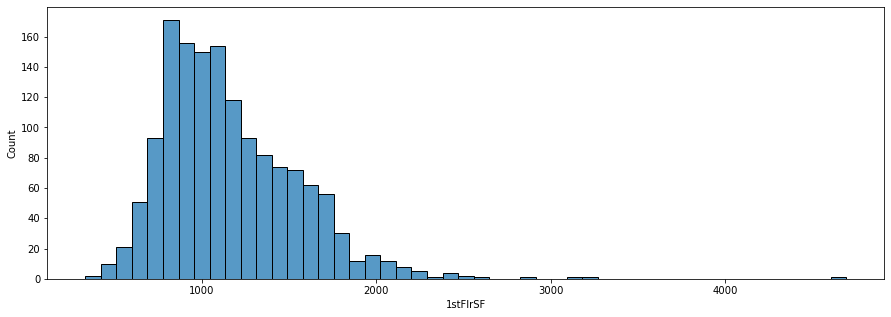

In [94]:
print(housing_continuous['1stFlrSF'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='1stFlrSF', data=housing_continuous)

Mostly 1stFlrSF of houses is "864" having Total No= 25

0       829
728      10
504       9
546       8
672       8
720       7
600       7
896       6
780       5
689       5
756       5
862       5
840       5
551       4
739       4
878       4
702       4
804       4
741       4
795       3
670       3
677       3
858       3
846       3
596       3
729       3
915       3
888       3
1254      3
660       3
880       3
886       3
866       3
832       3
871       3
704       3
668       3
807       3
742       3
793       3
684       3
1215      2
887       2
744       2
844       2
860       2
1040      2
252       2
620       2
1070      2
432       2
785       2
806       2
833       2
1101      2
783       2
584       2
978       2
764       2
601       2
850       2
530       2
703       2
709       2
941       2
406       2
640       2
564       2
612       2
574       2
1140      2
755       2
688       2
550       2
698       2
240       2
467       2
902       2
765       2
808       2
650       2
648       2
1032      2
576 

<AxesSubplot:xlabel='2ndFlrSF', ylabel='Count'>

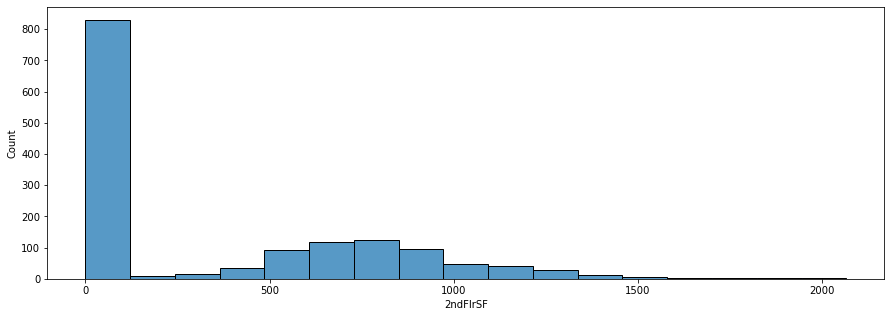

In [95]:
print(housing_continuous['2ndFlrSF'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='2ndFlrSF', data=housing_continuous)

Mostly 2ndFlrSF of houses is "0" having Total No= 829

0      1434
80        3
360       2
515       1
479       1
397       1
392       1
420       1
473       1
371       1
232       1
513       1
481       1
384       1
528       1
120       1
514       1
572       1
144       1
234       1
390       1
156       1
53        1
205       1
Name: LowQualFinSF, dtype: int64


<AxesSubplot:xlabel='LowQualFinSF', ylabel='Count'>

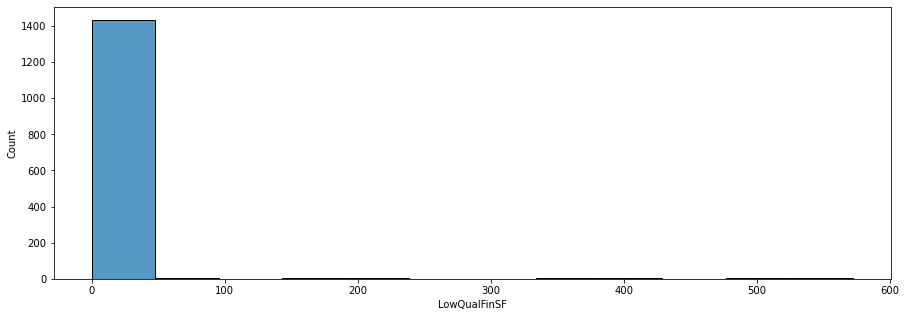

In [96]:
print(housing_continuous['LowQualFinSF'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='LowQualFinSF', data=housing_continuous)

Mostly LowQualFinSF of houses is "0" having Total No= 1434

864     22
1040    14
894     11
1456    10
848     10
1200     9
912      9
816      8
1092     8
987      7
1728     7
1344     7
1768     6
1494     6
1224     6
1484     6
1056     6
630      6
1710     5
1218     5
1656     5
1314     5
1302     5
960      5
988      5
990      5
1144     5
1392     5
1252     5
1479     4
1208     4
1258     4
1694     4
1716     4
1362     4
1414     4
858      4
1734     4
1652     4
1337     4
1646     4
1442     4
1800     4
882      4
1709     4
1416     4
1382     4
1664     4
1440     4
1250     4
1573     4
1680     4
1668     4
1502     4
1632     4
1792     4
1620     3
1128     3
1430     3
1489     3
1928     3
952      3
1472     3
1111     3
1616     3
1118     3
1352     3
1072     3
1152     3
1478     3
1717     3
924      3
1482     3
904      3
720      3
1588     3
1500     3
1501     3
1212     3
1363     3
1126     3
1661     3
1504     3
980      3
1626     3
1601     3
1604     3
1535     3
1236     3
968      3
999      3

<AxesSubplot:xlabel='GrLivArea', ylabel='Count'>

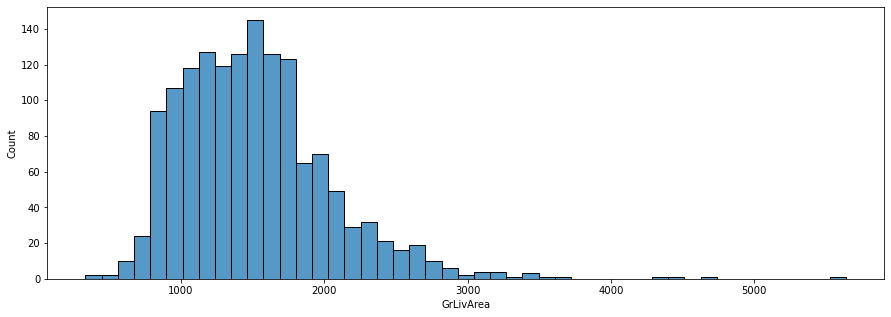

In [97]:
print(housing_continuous['GrLivArea'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='GrLivArea', data=housing_continuous)

Mostly GrLivArea of houses is "864" having Total No= 22

0    856
1    588
2     15
3      1
Name: BsmtFullBath, dtype: int64


<AxesSubplot:xlabel='BsmtFullBath', ylabel='Count'>

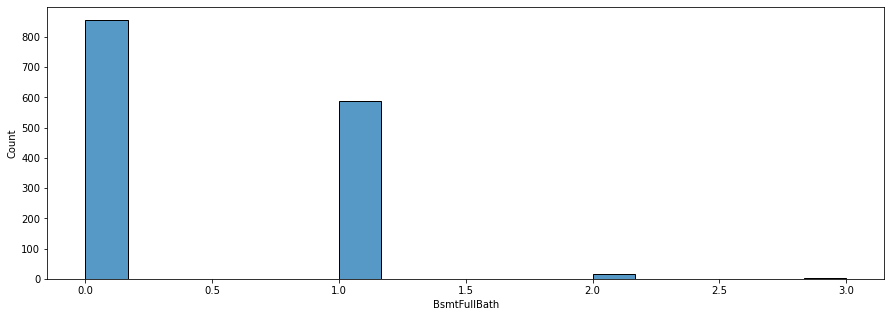

In [98]:
print(housing_continuous['BsmtFullBath'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='BsmtFullBath', data=housing_continuous)

Mostly BsmtFullBath of houses is "0" having Total No= 856 and least is "3" having Total No= 1

0    1378
1      80
2       2
Name: BsmtHalfBath, dtype: int64


<AxesSubplot:xlabel='BsmtHalfBath', ylabel='Count'>

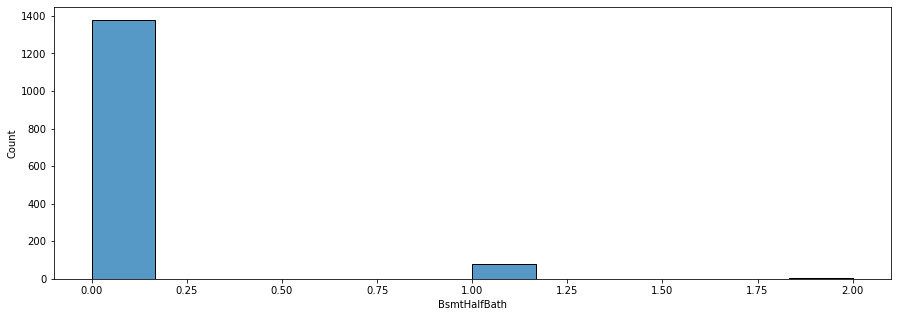

In [99]:
print(housing_continuous['BsmtHalfBath'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='BsmtHalfBath', data=housing_continuous)

Mostly BsmtFullBath of houses is "0" having Total No= 1378 and least is "2" having Total No= 2

2    768
1    650
3     33
0      9
Name: FullBath, dtype: int64


<AxesSubplot:xlabel='FullBath', ylabel='Count'>

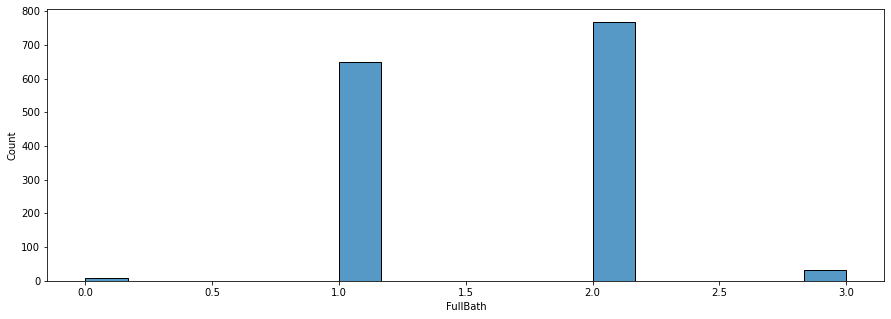

In [100]:
print(housing_continuous['FullBath'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='FullBath', data=housing_continuous)

Mostly FullBath of houses is "2" having Total No= 768 and least is "0" having Total No= 9

0    913
1    535
2     12
Name: HalfBath, dtype: int64


<AxesSubplot:xlabel='HalfBath', ylabel='Count'>

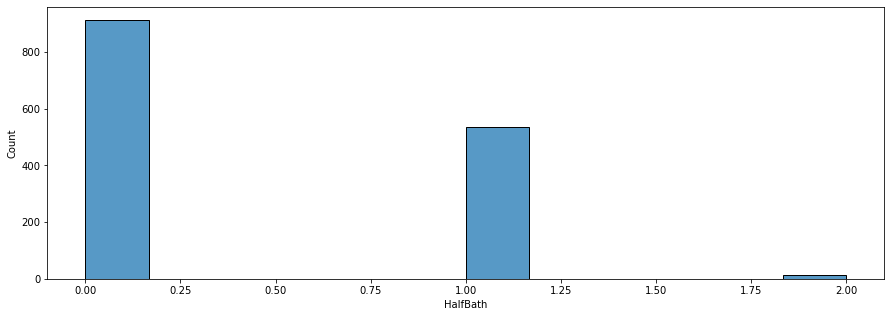

In [101]:
print(housing_continuous['HalfBath'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='HalfBath', data=housing_continuous)

Mostly HalfBath of houses is "0" having Total No= 913 and least is "2" having Total No= 12.

3    804
2    358
4    213
1     50
5     21
6      7
0      6
8      1
Name: BedroomAbvGr, dtype: int64


<AxesSubplot:xlabel='BedroomAbvGr', ylabel='Count'>

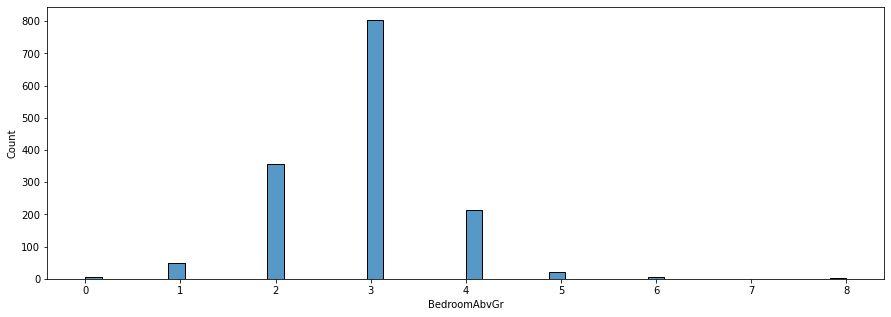

In [102]:
print(housing_continuous['BedroomAbvGr'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='BedroomAbvGr', data=housing_continuous)

Mostly BedroomAbvGr of houses is "3" having Total No= 804 and least is "8" having Total No= 1.

1    1392
2      65
3       2
0       1
Name: KitchenAbvGr, dtype: int64


<AxesSubplot:xlabel='KitchenAbvGr', ylabel='Count'>

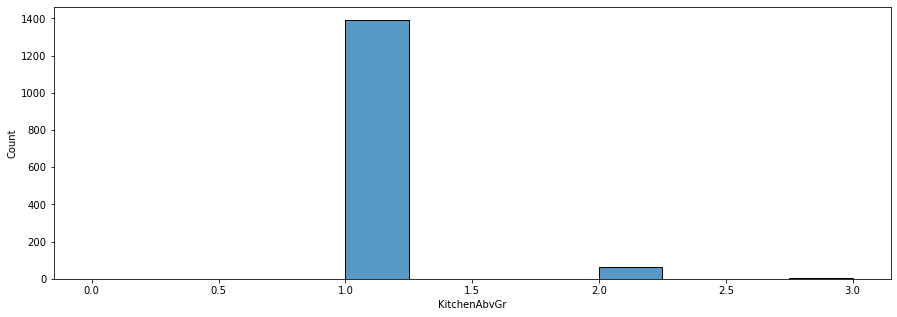

In [103]:
print(housing_continuous['KitchenAbvGr'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='KitchenAbvGr', data=housing_continuous)

Mostly KitchenAbvGr of houses is "1" having Total No= 1392 and least is "0" having Total No= 1

0    690
1    650
2    115
3      5
Name: Fireplaces, dtype: int64


<AxesSubplot:xlabel='Fireplaces', ylabel='Count'>

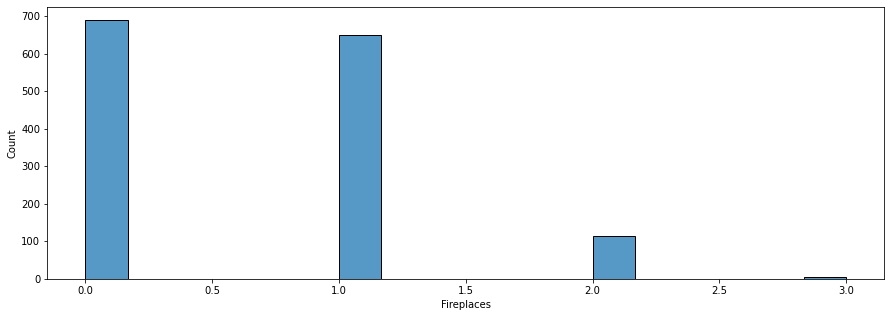

In [104]:
print(housing_continuous['Fireplaces'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='Fireplaces', data=housing_continuous)

Mostly Fireplaces of houses is "0" having Total No= 690 and least is "3" having Total No= 5

1978.506164    81
2005.000000    65
2006.000000    59
2004.000000    53
2003.000000    50
2007.000000    49
1977.000000    35
1998.000000    31
1999.000000    30
1976.000000    29
2008.000000    29
2000.000000    27
1968.000000    26
2002.000000    26
1950.000000    24
1993.000000    22
1966.000000    21
1958.000000    21
1962.000000    21
2009.000000    21
1965.000000    21
2001.000000    20
1957.000000    20
1996.000000    20
1970.000000    20
1954.000000    19
1960.000000    19
1997.000000    19
1978.000000    19
1964.000000    18
1995.000000    18
1974.000000    18
1994.000000    18
1959.000000    17
1956.000000    16
1990.000000    16
1963.000000    16
1980.000000    15
1967.000000    15
1969.000000    15
1979.000000    15
1972.000000    14
1920.000000    14
1940.000000    14
1973.000000    14
1988.000000    14
1961.000000    13
1992.000000    13
1971.000000    13
1955.000000    13
1953.000000    12
1987.000000    11
1948.000000    11
1989.000000    10
1981.000000    10
1985.00000

<AxesSubplot:xlabel='GarageYrBlt', ylabel='Count'>

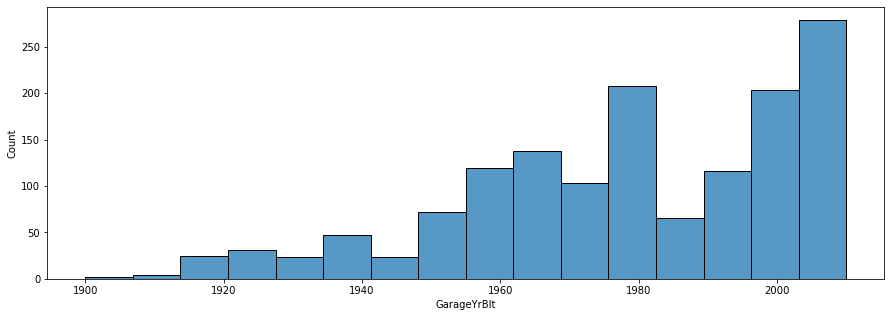

In [105]:
print(housing_continuous['GarageYrBlt'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='GarageYrBlt', data=housing_continuous)

Mostly GarageYrBlt of houses is "1978.506164" having Total No= 81

2    824
1    369
3    181
0     81
4      5
Name: GarageCars, dtype: int64


<AxesSubplot:xlabel='GarageCars', ylabel='Count'>

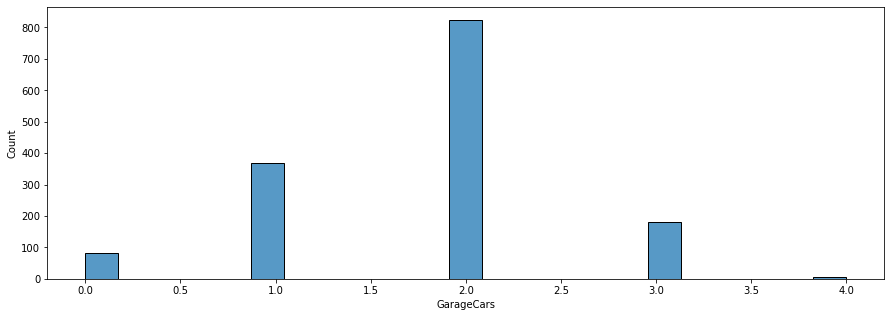

In [106]:
print(housing_continuous['GarageCars'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='GarageCars', data=housing_continuous)

Mostly GarageCars of houses is "2" having Total No= 824 and least is "4" having Total No= 5

0       81
440     49
576     47
240     38
484     34
528     33
288     27
400     25
480     24
264     24
308     20
420     19
280     16
672     15
336     12
216     12
352     12
504     12
564     11
360     11
462     10
300     10
572     10
540     10
286      9
539      9
180      9
312      9
660      9
384      9
520      8
588      8
550      8
432      8
460      7
648      7
474      7
506      7
624      7
490      6
525      6
546      6
500      6
840      6
390      6
461      6
478      6
380      6
492      6
472      6
396      6
431      5
676      5
529      5
434      5
530      5
270      5
338      5
450      5
527      5
297      5
544      5
451      5
299      5
720      5
252      5
560      5
402      4
495      4
442      4
552      4
532      4
502      4
200      4
430      4
577      4
516      4
294      4
470      4
463      4
834      4
600      4
397      3
210      3
884      3
457      3
438      3
880      3
486      3
870      3
836      3

<AxesSubplot:xlabel='GarageArea', ylabel='Count'>

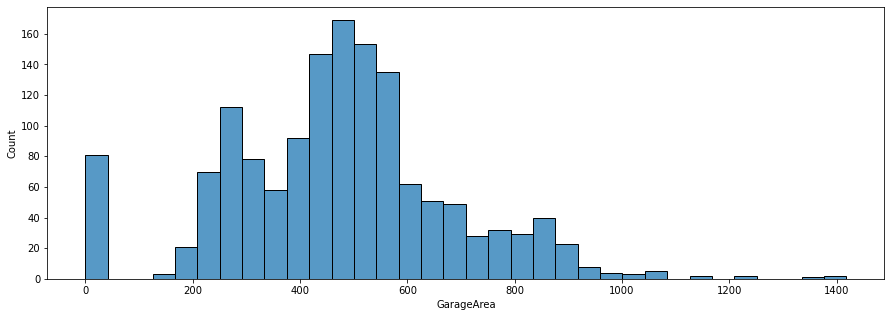

In [107]:
print(housing_continuous['GarageArea'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='GarageArea', data=housing_continuous)

Mostly GarageArea of houses is "0" having Total No= 81.

0      761
192     38
100     36
144     33
120     31
168     28
140     15
224     14
240     10
208     10
216      9
180      8
160      8
143      6
250      6
156      6
264      6
96       6
132      6
48       5
196      5
210      5
171      5
288      5
105      5
147      4
125      4
104      4
74       4
182      4
64       4
220      4
158      4
36       4
203      3
112      3
165      3
149      3
239      3
40       3
268      3
198      3
172      3
88       3
72       3
178      3
335      3
164      3
188      3
113      3
270      3
150      3
201      3
142      3
108      3
280      3
80       3
320      2
256      2
60       2
324      2
194      2
38       2
169      2
123      2
262      2
382      2
212      2
296      2
136      2
292      2
328      2
431      2
300      2
200      2
26       2
12       2
135      2
209      2
290      2
115      2
24       2
49       2
127      2
289      2
349      2
154      2
219      2
314      2
486      2
148      2

<AxesSubplot:xlabel='WoodDeckSF', ylabel='Count'>

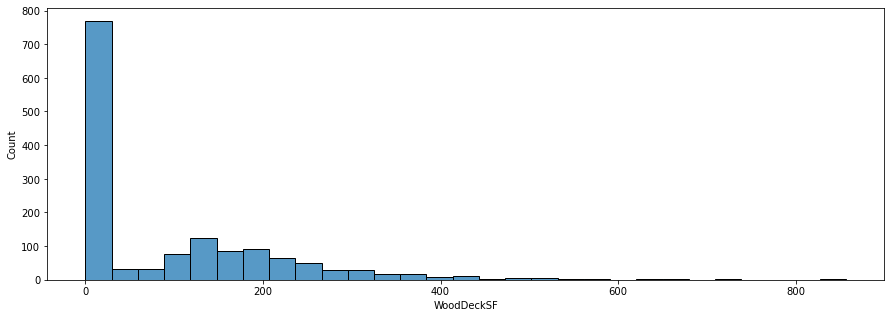

In [108]:
print(housing_continuous['WoodDeckSF'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='WoodDeckSF', data=housing_continuous)

Mostly WoodDeckSF of houses is "0" having Total No= 761

0      656
36      29
48      22
20      21
45      19
40      19
30      16
24      16
60      15
39      14
28      14
44      13
50      13
54      13
72      12
35      11
63      11
32      11
98      11
120     10
96      10
42      10
75      10
64       9
66       9
38       8
56       8
16       8
84       8
78       8
70       8
68       8
130      7
25       7
33       7
114      7
102      7
27       7
144      7
80       7
100      6
55       6
116      6
51       6
26       6
140      6
22       6
46       6
76       5
21       5
65       5
110      5
150      5
90       5
108      5
29       5
62       5
112      5
59       5
74       5
88       5
104      5
128      5
18       5
34       4
105      4
154      4
57       4
82       4
49       4
113      4
52       4
168      4
166      3
53       3
158      3
47       3
184      3
122      3
124      3
111      3
73       3
61       3
69       3
132      3
81       3
87       3
234      3
136      3
192      3
12       3

<AxesSubplot:xlabel='OpenPorchSF', ylabel='Count'>

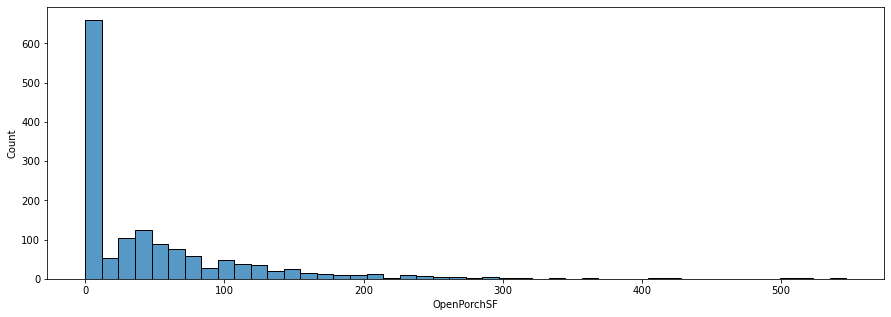

In [109]:
print(housing_continuous['OpenPorchSF'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='OpenPorchSF', data=housing_continuous)

Mostly OpenPorchSF of houses is "0" having Total No= 656

0      1252
112      15
96        6
120       5
144       5
216       5
192       5
116       4
252       4
156       4
176       3
228       3
102       3
40        3
128       3
126       3
150       3
184       3
164       3
205       2
168       2
34        2
160       2
180       2
264       2
224       2
240       2
185       2
236       2
158       2
77        2
190       2
36        2
154       2
84        2
115       2
80        2
108       2
234       2
137       2
39        2
202       2
114       2
32        2
244       2
100       2
221       1
169       1
52        1
330       1
198       1
210       1
20        1
94        1
248       1
60        1
254       1
226       1
220       1
54        1
318       1
50        1
174       1
91        1
218       1
172       1
552       1
386       1
87        1
170       1
37        1
48        1
140       1
90        1
123       1
214       1
143       1
19        1
30        1
268       1
162       1
134       1
67        1
259 

<AxesSubplot:xlabel='EnclosedPorch', ylabel='Count'>

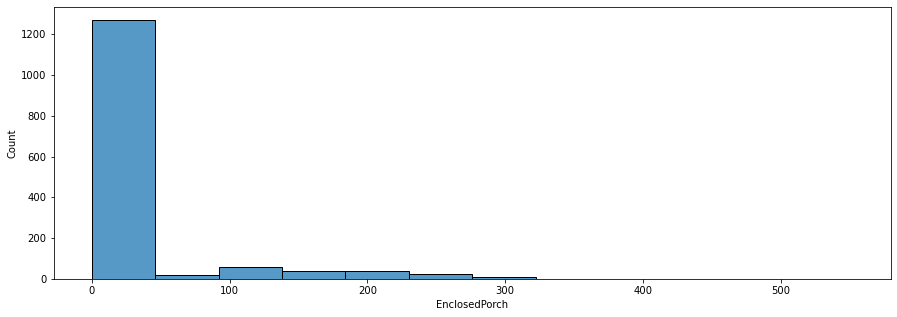

In [110]:
print(housing_continuous['EnclosedPorch'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='EnclosedPorch', data=housing_continuous)

Mostly EnclosedPorch of houses is "0" having Total No= 1252.

0      1436
168       3
180       2
144       2
216       2
182       1
320       1
508       1
153       1
23        1
304       1
130       1
238       1
245       1
290       1
162       1
96        1
140       1
196       1
407       1
Name: 3SsnPorch, dtype: int64


<AxesSubplot:xlabel='3SsnPorch', ylabel='Count'>

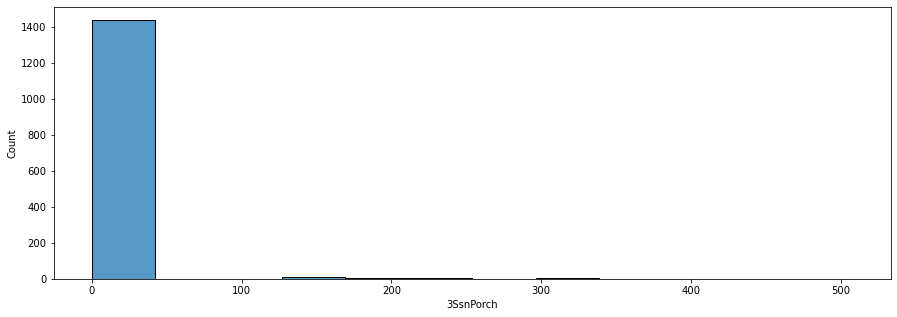

In [111]:
print(housing_continuous['3SsnPorch'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='3SsnPorch', data=housing_continuous)

Mostly 3SsnPorch of houses is "0" having Total No= 1436.

0      1344
192       6
224       5
120       5
180       4
189       4
126       3
147       3
90        3
168       3
144       3
160       3
170       2
100       2
198       2
184       2
288       2
200       2
259       2
142       2
216       2
176       2
40        1
260       1
154       1
322       1
291       1
287       1
190       1
197       1
163       1
410       1
385       1
143       1
130       1
396       1
263       1
119       1
152       1
233       1
220       1
276       1
312       1
210       1
374       1
252       1
175       1
145       1
273       1
155       1
182       1
116       1
140       1
178       1
128       1
185       1
480       1
153       1
266       1
222       1
271       1
99        1
161       1
60        1
122       1
53        1
80        1
225       1
265       1
95        1
63        1
156       1
165       1
440       1
204       1
234       1
Name: ScreenPorch, dtype: int64


<AxesSubplot:xlabel='ScreenPorch', ylabel='Count'>

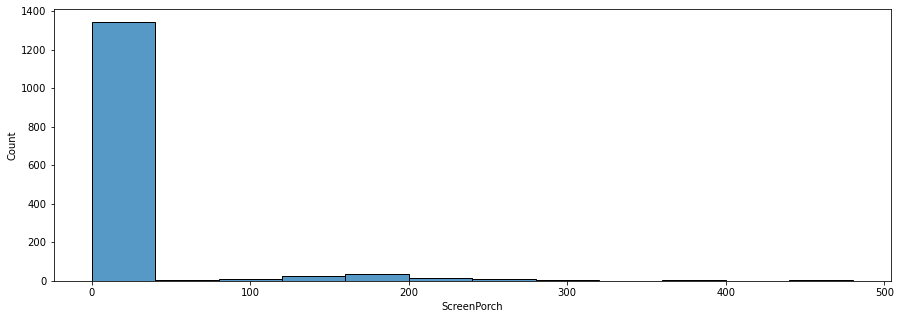

In [112]:
print(housing_continuous['ScreenPorch'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='ScreenPorch', data=housing_continuous)

Mostly ScreenPorch of houses is "0" having Total No= 1344.

0      1453
555       1
576       1
738       1
519       1
480       1
648       1
512       1
Name: PoolArea, dtype: int64


<AxesSubplot:xlabel='PoolArea', ylabel='Count'>

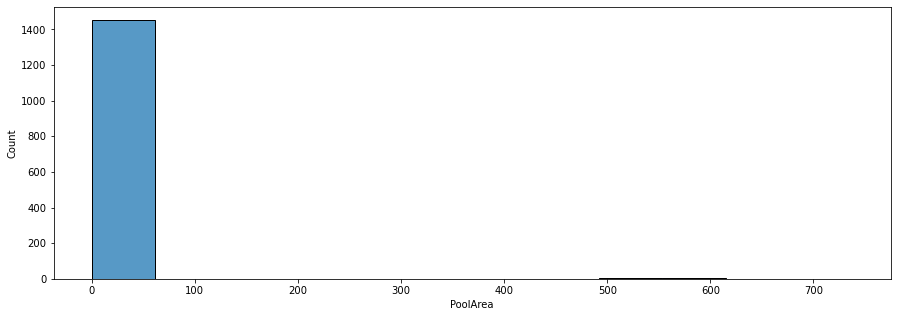

In [113]:
print(housing_continuous['PoolArea'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='PoolArea', data=housing_continuous)

Mostly PoolArea of houses is "0" having Total No= 1453

0        1408
400        11
500         8
700         5
450         4
2000        4
600         4
1200        2
480         2
1300        1
1400        1
1150        1
620         1
15500       1
8300        1
800         1
54          1
350         1
560         1
2500        1
3500        1
Name: MiscVal, dtype: int64


<AxesSubplot:xlabel='MiscVal', ylabel='Count'>

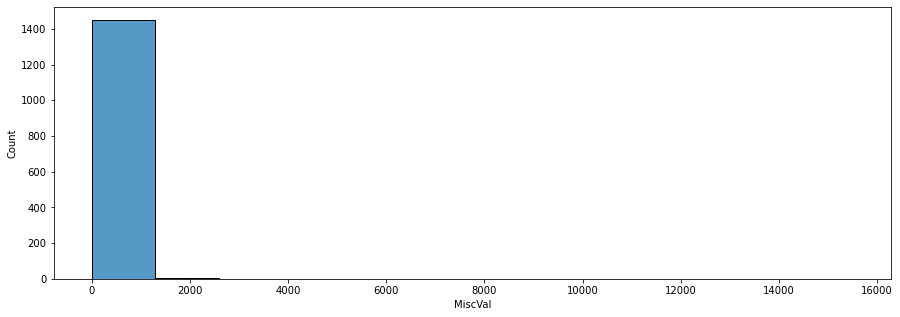

In [114]:
print(housing_continuous['MiscVal'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='MiscVal', data=housing_continuous)

Mostly MiscVal of houses is "0" having Total No= 1408

6     253
7     234
5     204
4     141
8     122
3     106
10     89
11     79
9      63
12     59
1      58
2      52
Name: MoSold, dtype: int64


<AxesSubplot:xlabel='MoSold', ylabel='Count'>

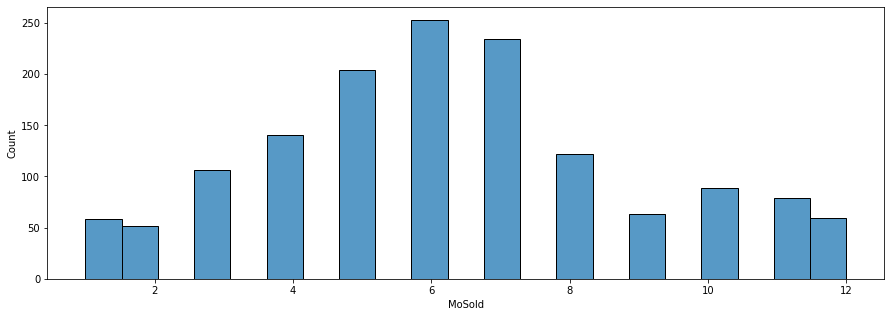

In [115]:
print(housing_continuous['MoSold'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='MoSold', data=housing_continuous)

Mostly MoSold of houses is "6" having Total No= 253 and least is "2" having Total No= 52

2009    338
2007    329
2006    314
2008    304
2010    175
Name: YrSold, dtype: int64


<AxesSubplot:xlabel='YrSold', ylabel='Count'>

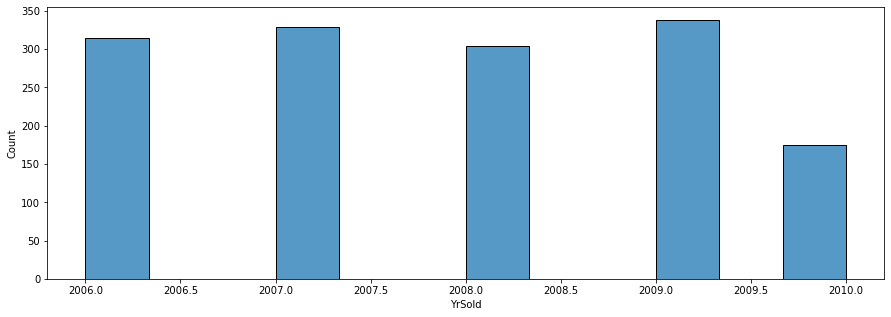

In [116]:
print(housing_continuous['YrSold'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='YrSold', data=housing_continuous)

Mostly YrSold of houses is "2009" having Total No= 338 and least is "2010" having Total No= 175

140000.0    18
135000.0    16
155000.0    12
139000.0    11
160000.0    11
145000.0    10
190000.0     9
130000.0     9
110000.0     9
125000.0     8
215000.0     8
129000.0     8
127000.0     8
115000.0     8
147000.0     8
185000.0     8
200000.0     7
128000.0     7
141000.0     7
175000.0     7
180000.0     7
176000.0     7
144000.0     7
230000.0     7
235000.0     7
100000.0     7
165000.0     7
173000.0     6
108000.0     6
170000.0     6
174000.0     6
205000.0     6
132500.0     6
148000.0     6
225000.0     5
158000.0     5
187500.0     5
137000.0     5
260000.0     5
239000.0     5
157000.0     5
250000.0     5
181000.0     5
240000.0     5
120000.0     5
124000.0     5
136500.0     5
152000.0     5
290000.0     5
143000.0     5
151000.0     5
178000.0     5
133000.0     5
172500.0     5
119000.0     4
184000.0     4
168000.0     4
191000.0     4
214000.0     4
163000.0     4
325000.0     4
137500.0     4
150000.0     4
127500.0     4
192000.0     4
171000.0     4
275000.0  

<AxesSubplot:xlabel='SalePrice', ylabel='Count'>

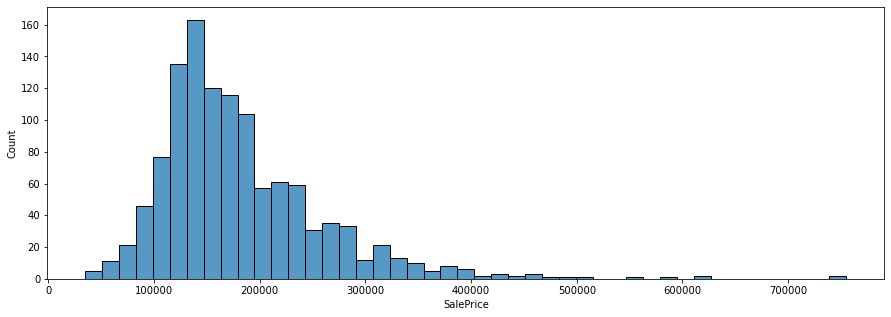

In [117]:
print(housing_continuous['SalePrice'].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x='SalePrice', data=housing_continuous)

Mostly SalePrice of houses is "140000.0" having Total No= 18

## Bivariate Analysis
### Using Barplot for comparision of Features Column with Target Column

<AxesSubplot:xlabel='MSZoning', ylabel='SalePrice'>

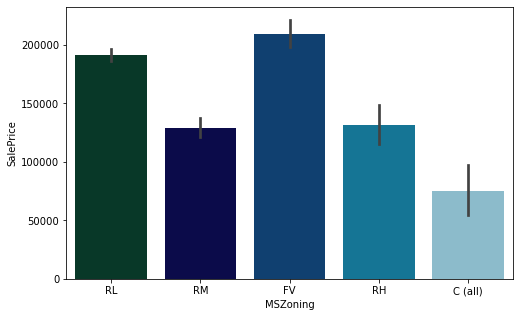

In [118]:
plt.figure(figsize=(8,5))
sns.barplot(x='MSZoning',y='SalePrice',data=housing,palette='ocean')

Houses having "FV" MSZoning is having highest SalePrice and C(all) is having least SalePrice

<AxesSubplot:xlabel='Street', ylabel='SalePrice'>

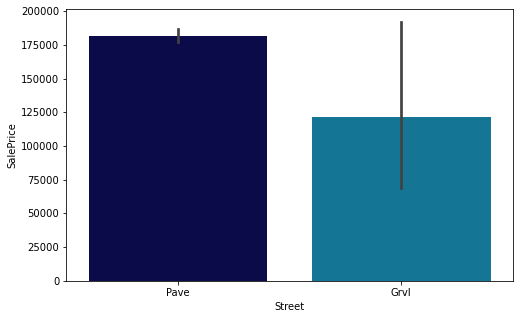

In [119]:
plt.figure(figsize=(8,5))
sns.barplot(x='Street',y='SalePrice',data=housing,palette='ocean')

Houses having "Pave" Street is having highest SalePrice and "Grvl" is having least SalePrice

<AxesSubplot:xlabel='LotShape', ylabel='SalePrice'>

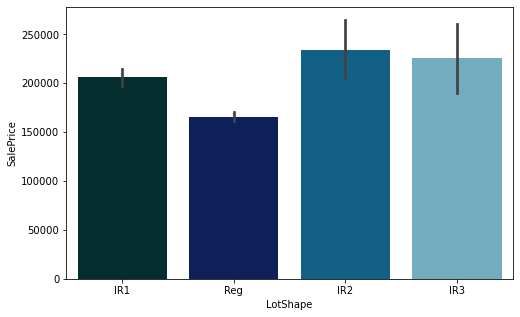

In [120]:
plt.figure(figsize=(8,5))
sns.barplot(x='LotShape',y='SalePrice',data=housing,palette='ocean')

Houses having "IR2" LotShape is having highest SalePrice and "Reg" is having least SalePrice

<AxesSubplot:xlabel='LandContour', ylabel='SalePrice'>

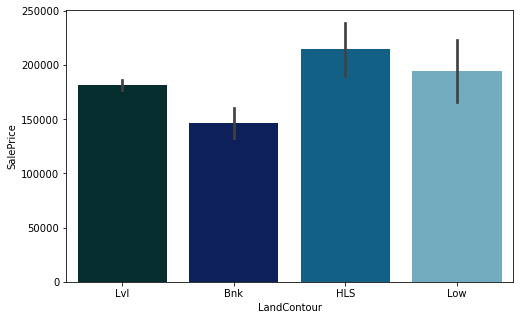

In [121]:
plt.figure(figsize=(8,5))
sns.barplot(x='LandContour',y='SalePrice',data=housing,palette='ocean')

Houses having "HLS" LandContour is having highest SalePrice and "Bnk" is having least SalePrice

<AxesSubplot:xlabel='Utilities', ylabel='SalePrice'>

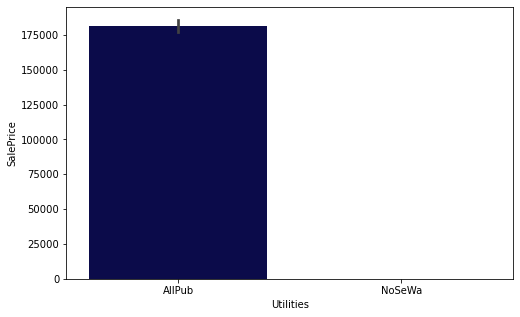

In [122]:
plt.figure(figsize=(8,5))
sns.barplot(x='Utilities',y='SalePrice',data=housing,palette='ocean')

Houses having "AllPub" Utilities is having highest SalePrice and "NoSeWa" is having least SalePrice

<AxesSubplot:xlabel='LotConfig', ylabel='SalePrice'>

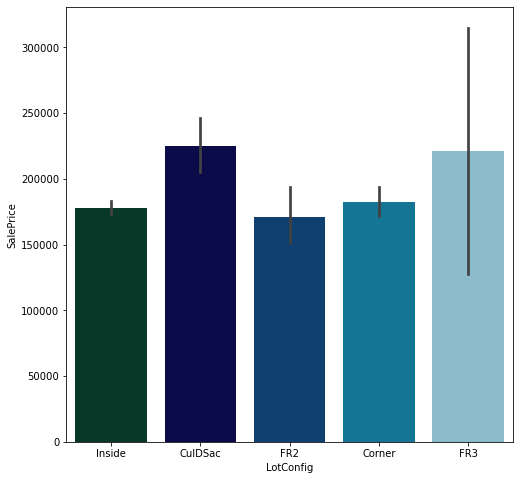

In [123]:
plt.figure(figsize=(8,8))
sns.barplot(x='LotConfig',y='SalePrice',data=housing,palette='ocean')

Houses having "CulDSac" LotConfig is having highest SalePrice and "FR2" is having least SalePrice

<AxesSubplot:xlabel='LandSlope', ylabel='SalePrice'>

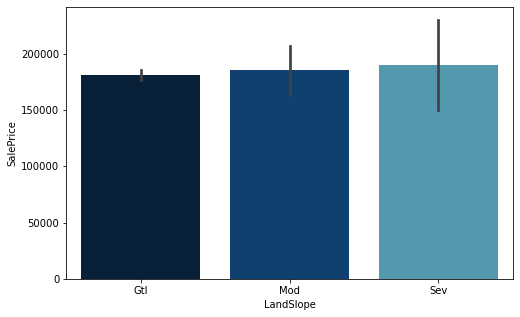

In [124]:
plt.figure(figsize=(8,5))
sns.barplot(x='LandSlope',y='SalePrice',data=housing,palette='ocean')

Houses having "Sev" LandSlope is having highest SalePrice and "Gtl" is having least SalePrice

<AxesSubplot:xlabel='Neighborhood', ylabel='SalePrice'>

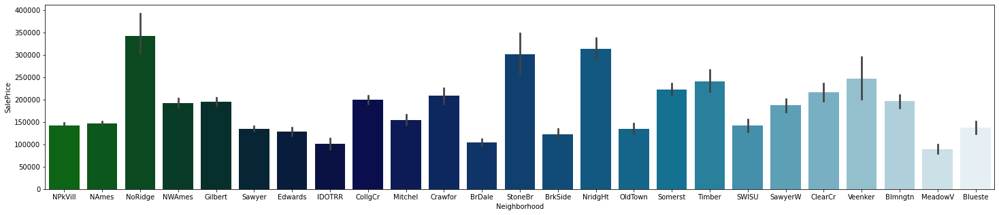

In [125]:
plt.figure(figsize=(25,5))
sns.barplot(x='Neighborhood',y='SalePrice',data=housing,palette='ocean')

Houses having "15" Neighborhood is having highest SalePrice and "10" is having least SalePrice

<AxesSubplot:xlabel='Condition1', ylabel='SalePrice'>

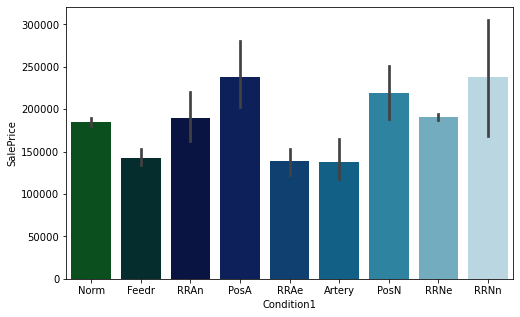

In [126]:
plt.figure(figsize=(8,5))
sns.barplot(x='Condition1',y='SalePrice',data=housing,palette='ocean')

Houses having "RRNn" Condition1 is having highest SalePrice and "RRAe & Artery" is having least SalePrice

<AxesSubplot:xlabel='Condition2', ylabel='SalePrice'>

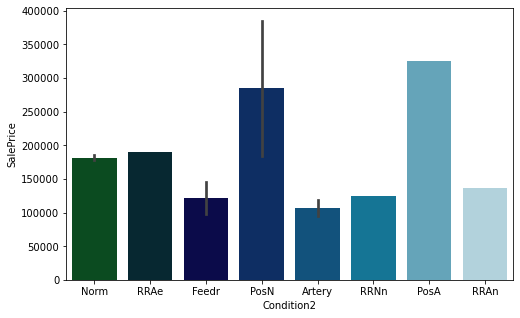

In [127]:
plt.figure(figsize=(8,5))
sns.barplot(x='Condition2',y='SalePrice',data=housing,palette='ocean')

Houses having "PosA" Condition2 is having highest SalePrice and "Artery" is having least SalePrice

<AxesSubplot:xlabel='BldgType', ylabel='SalePrice'>

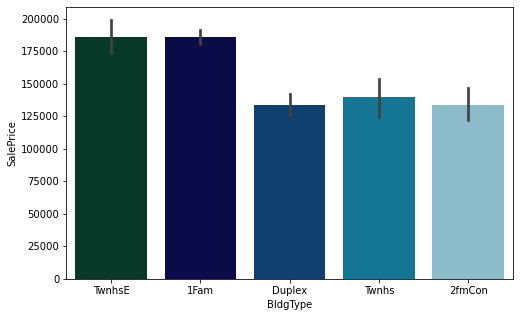

In [128]:
plt.figure(figsize=(8,5))
sns.barplot(x='BldgType',y='SalePrice',data=housing,palette='ocean')

Houses having "TwnhsE" BldgType is having highest SalePrice and "Duplex" is having least SalePrice

<AxesSubplot:xlabel='HouseStyle', ylabel='SalePrice'>

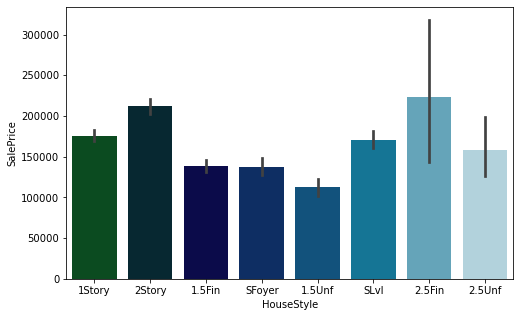

In [129]:
plt.figure(figsize=(8,5))
sns.barplot(x='HouseStyle',y='SalePrice',data=housing,palette='ocean')

Houses having "2.5 Fin" HouseStyle is having highest SalePrice and "1.5 Unf" is having least SalePrice

<AxesSubplot:xlabel='RoofStyle', ylabel='SalePrice'>

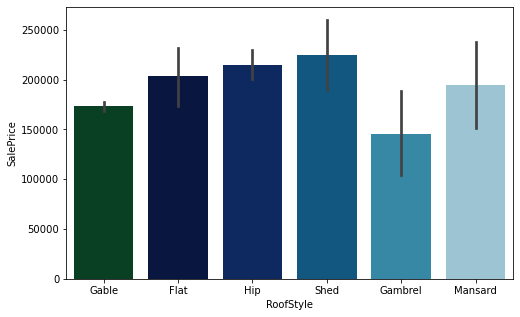

In [130]:
plt.figure(figsize=(8,5))
sns.barplot(x='RoofStyle',y='SalePrice',data=housing,palette='ocean')

Houses having "Shed" RoofStyle is having highest SalePrice and "Gambrel" is having least SalePrice

<AxesSubplot:xlabel='RoofMatl', ylabel='SalePrice'>

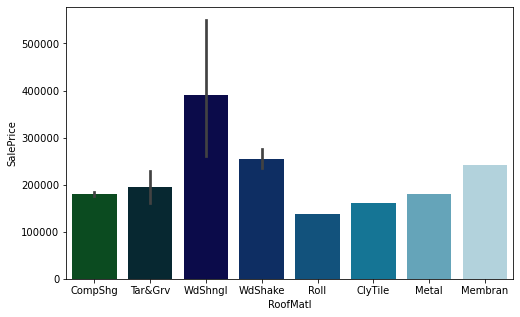

In [131]:
plt.figure(figsize=(8,5))
sns.barplot(x='RoofMatl',y='SalePrice',data=housing,palette='ocean')

Houses having "WdShake" RoofMatl is having highest SalePrice and "Roll" is having least SalePrice

<AxesSubplot:xlabel='Exterior1st', ylabel='SalePrice'>

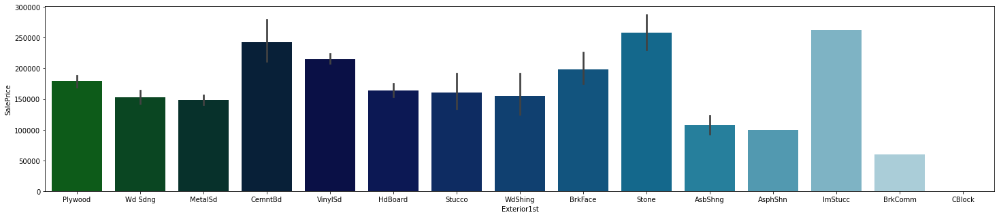

In [132]:
plt.figure(figsize=(25,5))
sns.barplot(x='Exterior1st',y='SalePrice',data=housing,palette='ocean')

Houses having "7" Exterior1st is having highest SalePrice and "4" is having least SalePrice

<AxesSubplot:xlabel='Exterior2nd', ylabel='SalePrice'>

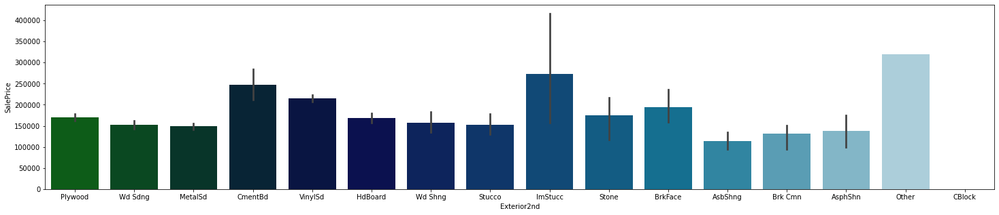

In [133]:
plt.figure(figsize=(25,5))
sns.barplot(x='Exterior2nd',y='SalePrice',data=housing,palette='ocean')

Houses having "15" Exterior2nd is having highest SalePrice and "4" is having least SalePrice

<AxesSubplot:xlabel='MasVnrType', ylabel='SalePrice'>

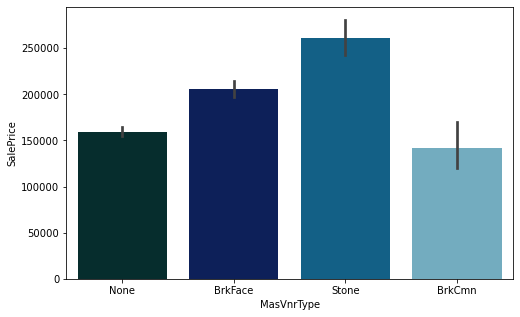

In [134]:
plt.figure(figsize=(8,5))
sns.barplot(x='MasVnrType',y='SalePrice',data=housing,palette='ocean')

Houses having "Stone" MasVnrType is having highest SalePrice and "BrkCmn" is having least SalePrice

<AxesSubplot:xlabel='ExterQual', ylabel='SalePrice'>

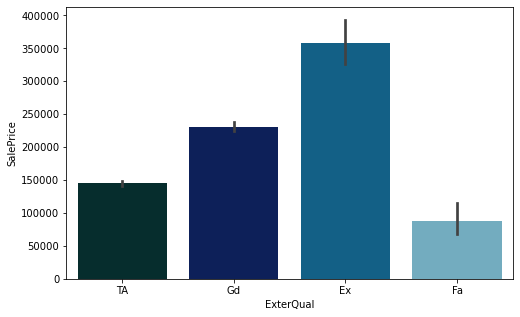

In [135]:
plt.figure(figsize=(8,5))
sns.barplot(x='ExterQual',y='SalePrice',data=housing,palette='ocean')

Houses having "Ex" ExterQual is having highest SalePrice and "Fa" is having least SalePrice

<AxesSubplot:xlabel='ExterCond', ylabel='SalePrice'>

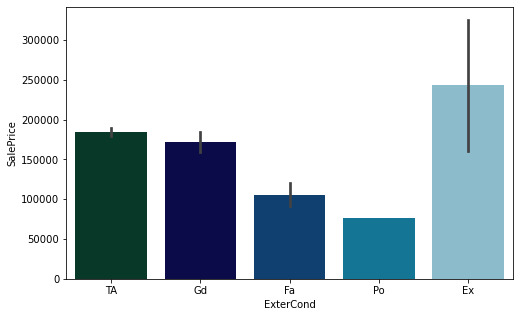

In [136]:
plt.figure(figsize=(8,5))
sns.barplot(x='ExterCond',y='SalePrice',data=housing,palette='ocean')

Houses having "Ex" ExterCond is having highest SalePrice and "Po" is having least SalePrice

<AxesSubplot:xlabel='Foundation', ylabel='SalePrice'>

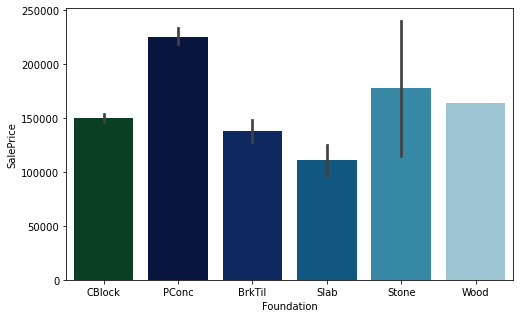

In [137]:
plt.figure(figsize=(8,5))
sns.barplot(x='Foundation',y='SalePrice',data=housing,palette='ocean')

Houses having "PConc" Foundation is having highest SalePrice and "Stab" is having least SalePrice

<AxesSubplot:xlabel='BsmtQual', ylabel='SalePrice'>

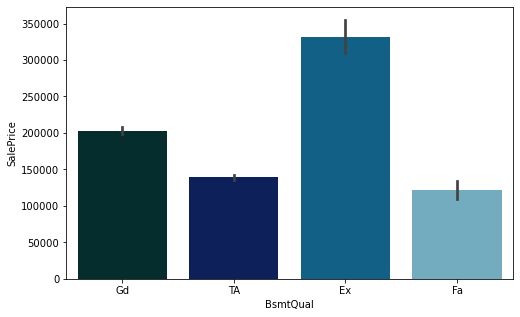

In [138]:
plt.figure(figsize=(8,5))
sns.barplot(x='BsmtQual',y='SalePrice',data=housing,palette='ocean')

Houses having "Ex" BsmtQual is having highest SalePrice and "Fa" is having least SalePrice

<AxesSubplot:xlabel='BsmtCond', ylabel='SalePrice'>

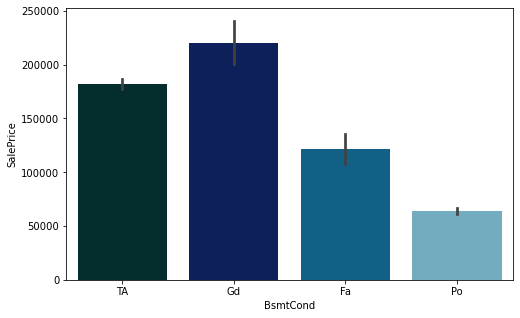

In [139]:
plt.figure(figsize=(8,5))
sns.barplot(x='BsmtCond',y='SalePrice',data=housing,palette='ocean')

Houses having "Gs" BsmtCond is having highest SalePrice and "Po" is having least SalePrice

<AxesSubplot:xlabel='BsmtExposure', ylabel='SalePrice'>

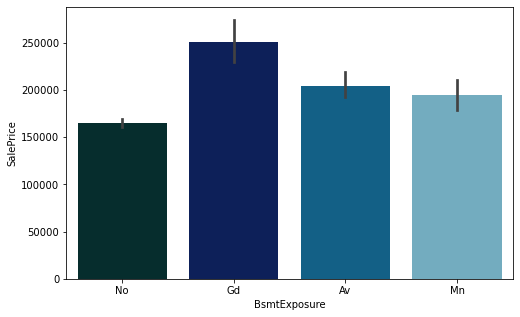

In [140]:
plt.figure(figsize=(8,5))
sns.barplot(x='BsmtExposure',y='SalePrice',data=housing,palette='ocean')

Houses having "Gd" BsmtExposure is having highest SalePrice and "No" is having least SalePrice

<AxesSubplot:xlabel='BsmtFinType1', ylabel='SalePrice'>

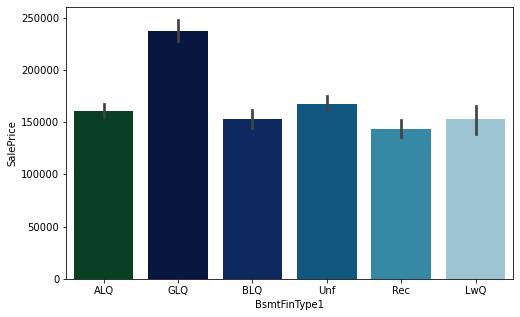

In [141]:
plt.figure(figsize=(8,5))
sns.barplot(x='BsmtFinType1',y='SalePrice',data=housing,palette='ocean')

Houses having "GLQ" BsmtFinType1 is having highest SalePrice and "Rec" is having least SalePriceBsmtFinType1

<AxesSubplot:xlabel='BsmtFinType2', ylabel='SalePrice'>

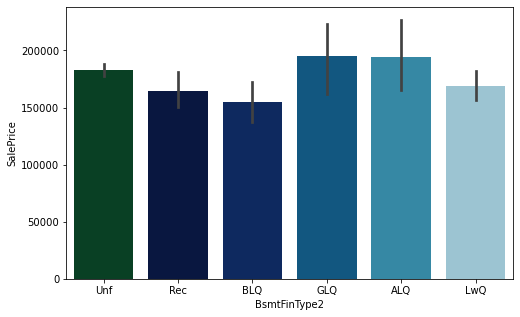

In [142]:
plt.figure(figsize=(8,5))
sns.barplot(x='BsmtFinType2',y='SalePrice',data=housing,palette='ocean')

Houses having "GLQ & ALQ" BsmtFinType2 is having highest SalePrice and "BLQ" is having least SalePrice

<AxesSubplot:xlabel='Heating', ylabel='SalePrice'>

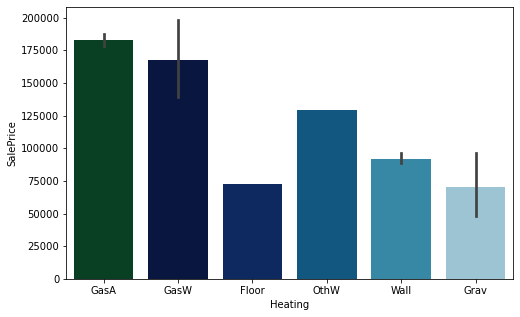

In [143]:
plt.figure(figsize=(8,5))
sns.barplot(x='Heating',y='SalePrice',data=housing,palette='ocean')

Houses having "GasA" Heating is having highest SalePrice and "Floor" is having least SalePrice

<AxesSubplot:xlabel='HeatingQC', ylabel='SalePrice'>

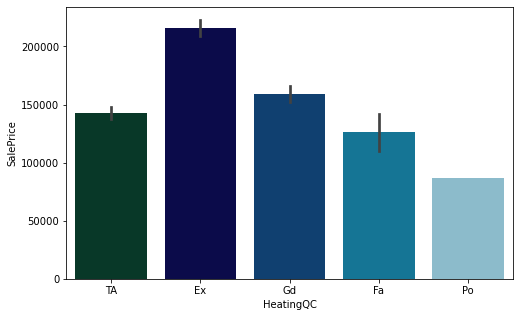

In [144]:
plt.figure(figsize=(8,5))
sns.barplot(x='HeatingQC',y='SalePrice',data=housing,palette='ocean')

Houses having "Ex" HeatingQC is having highest SalePrice and "Po" is having least SalePrice

<AxesSubplot:xlabel='CentralAir', ylabel='SalePrice'>

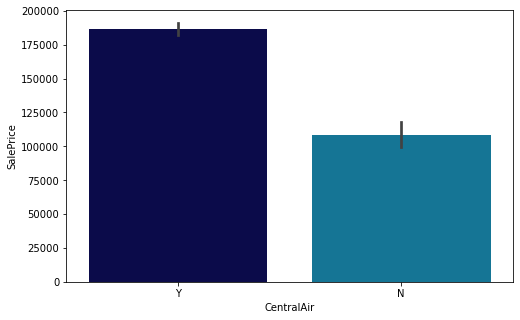

In [145]:
plt.figure(figsize=(8,5))
sns.barplot(x='CentralAir',y='SalePrice',data=housing,palette='ocean')

Houses having "Y" CentralAir is having highest SalePrice and "N" is having least SalePrice

<AxesSubplot:xlabel='Electrical', ylabel='SalePrice'>

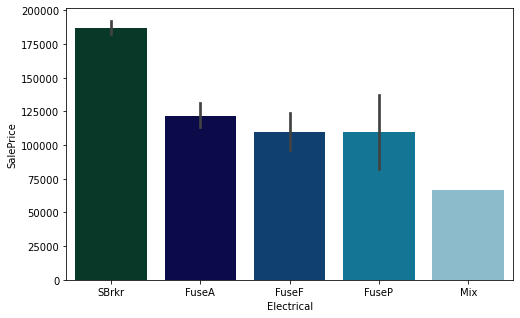

In [146]:
plt.figure(figsize=(8,5))
sns.barplot(x='Electrical',y='SalePrice',data=housing,palette='ocean')

Houses having "SBrkr" Electrical is having highest SalePrice and "Mix" is having least SalePrice

<AxesSubplot:xlabel='KitchenQual', ylabel='SalePrice'>

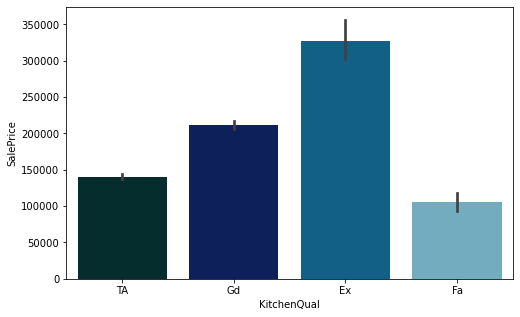

In [147]:
plt.figure(figsize=(8,5))
sns.barplot(x='KitchenQual',y='SalePrice',data=housing,palette='ocean')

Houses having "Ex" KitchenQual is having highest SalePrice and "Fa" is having least SalePrice

<AxesSubplot:xlabel='Functional', ylabel='SalePrice'>

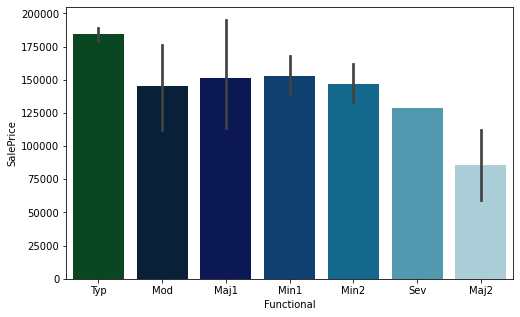

In [148]:
plt.figure(figsize=(8,5))
sns.barplot(x='Functional',y='SalePrice',data=housing,palette='ocean')

Houses having "Typ" Functional is having highest SalePrice and "Maj2" is having least SalePrice

<AxesSubplot:xlabel='FireplaceQu', ylabel='SalePrice'>

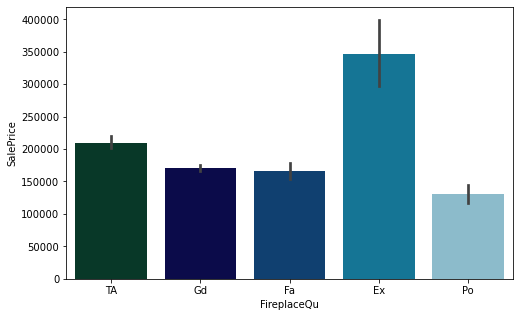

In [149]:
plt.figure(figsize=(8,5))
sns.barplot(x='FireplaceQu',y='SalePrice',data=housing,palette='ocean')

Houses having "Ex" FireplaceQu is having highest SalePrice and "Po" is having least SalePrice

<AxesSubplot:xlabel='GarageType', ylabel='SalePrice'>

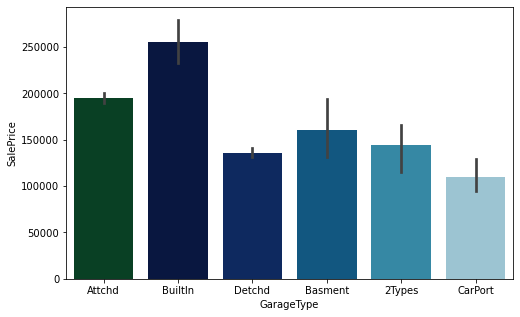

In [150]:
plt.figure(figsize=(8,5))
sns.barplot(x='GarageType',y='SalePrice',data=housing,palette='ocean')

Houses having "BuiltIn" GarageType is having highest SalePrice and "CarPort" is having least SalePrice

<AxesSubplot:xlabel='GarageFinish', ylabel='SalePrice'>

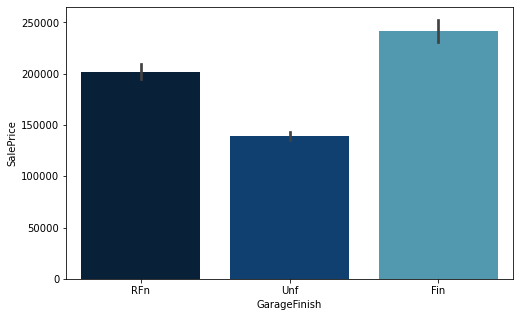

In [151]:
plt.figure(figsize=(8,5))
sns.barplot(x='GarageFinish',y='SalePrice',data=housing,palette='ocean')

Houses having "Fin" GarageFinish is having highest SalePrice and "Unf" is having least SalePrice

<AxesSubplot:xlabel='GarageQual', ylabel='SalePrice'>

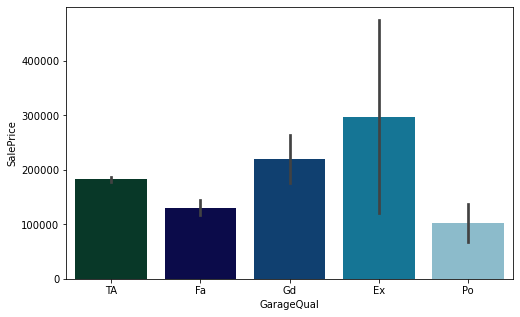

In [152]:
plt.figure(figsize=(8,5))
sns.barplot(x='GarageQual',y='SalePrice',data=housing,palette='ocean')   

Houses having "Ex" GarageQual is having highest SalePrice and "Po" is having least SalePrice

<AxesSubplot:xlabel='GarageCond', ylabel='SalePrice'>

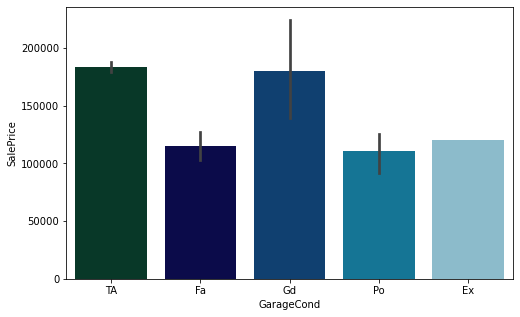

In [153]:
plt.figure(figsize=(8,5))
sns.barplot(x='GarageCond',y='SalePrice',data=housing,palette='ocean')

Houses having "Gd" GarageCond is having highest SalePrice and "Fa" is having least SalePrice

<AxesSubplot:xlabel='PavedDrive', ylabel='SalePrice'>

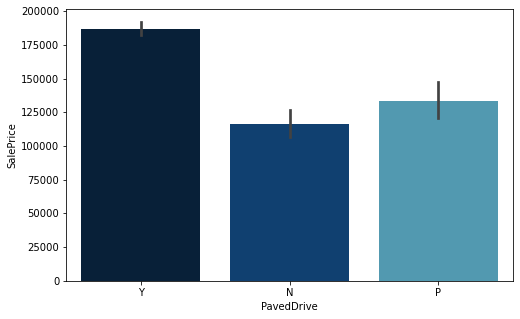

In [154]:
plt.figure(figsize=(8,5))
sns.barplot(x='PavedDrive',y='SalePrice',data=housing,palette='ocean')

Houses having "Y" PavedDrive is having highest SalePrice and "N" is having least SalePrice

<AxesSubplot:xlabel='Fence', ylabel='SalePrice'>

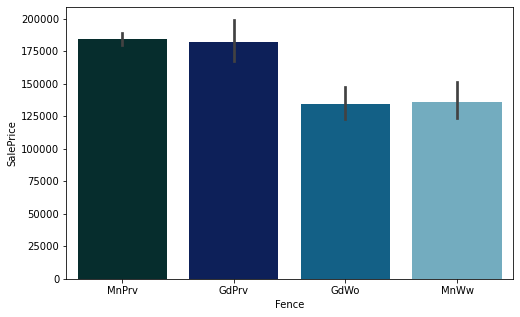

In [155]:
plt.figure(figsize=(8,5))
sns.barplot(x='Fence',y='SalePrice',data=housing,palette='ocean')

Houses having "MnPrv & GdPrv" Fence is having highest SalePrice and "GdWo & MnWw" is having least SalePrice

<AxesSubplot:xlabel='SaleType', ylabel='SalePrice'>

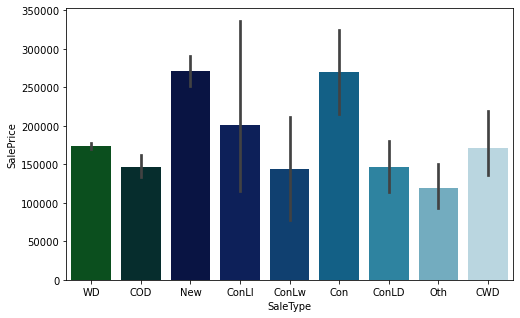

In [156]:
plt.figure(figsize=(8,5))
sns.barplot(x='SaleType',y='SalePrice',data=housing,palette='ocean')

Houses having "Con & New" SaleType is having highest SalePrice and "Oth" is having least SalePrice

<AxesSubplot:xlabel='SaleCondition', ylabel='SalePrice'>

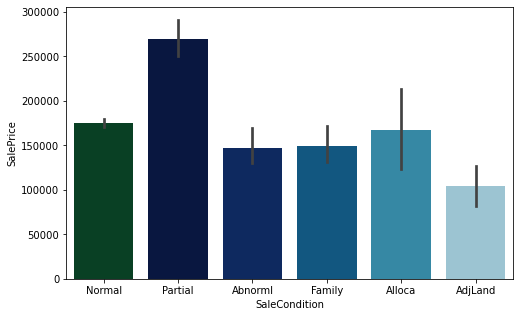

In [157]:
plt.figure(figsize=(8,5))
sns.barplot(x='SaleCondition',y='SalePrice',data=housing,palette='ocean')

Houses having "Partial" SaleCondition is having highest SalePrice and "AdjLand" is having least SalePrice

<AxesSubplot:xlabel='MSSubClass', ylabel='SalePrice'>

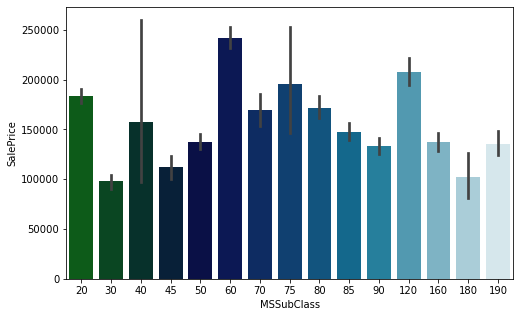

In [158]:
plt.figure(figsize=(8,5))
sns.barplot(x='MSSubClass',y='SalePrice',data=housing,palette='ocean')

Houses having "60" MSSubClass is having highest SalePrice and "30" is having least SalePrice

<AxesSubplot:xlabel='LotFrontage', ylabel='SalePrice'>

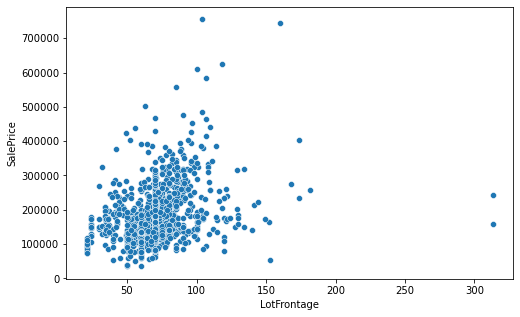

In [159]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='LotFrontage',y='SalePrice',data=housing,palette='ocean')

Houses having "less sqft" LotFrontage is having highest SalePrice and "more sqft" is having least SalePrice

<AxesSubplot:xlabel='LotArea', ylabel='SalePrice'>

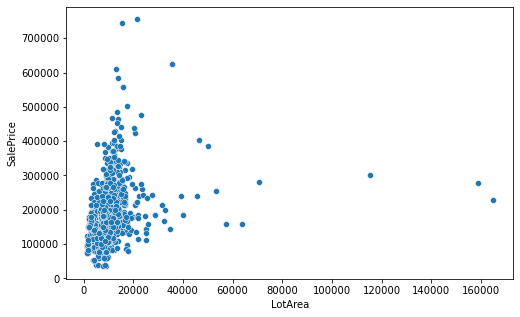

In [160]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='LotArea',y='SalePrice',data=housing,palette='ocean')

Houses having "less" LotArea is having highest SalePrice and "more" is having least SalePrice

<AxesSubplot:xlabel='OverallQual', ylabel='SalePrice'>

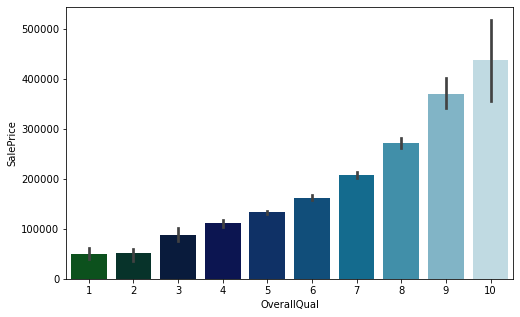

In [161]:
plt.figure(figsize=(8,5))
sns.barplot(x='OverallQual',y='SalePrice',data=housing,palette='ocean')

Houses having "10" rating in Overall Quality is having highest SalePrice and "1" is having least SalePrice

<AxesSubplot:xlabel='OverallCond', ylabel='SalePrice'>

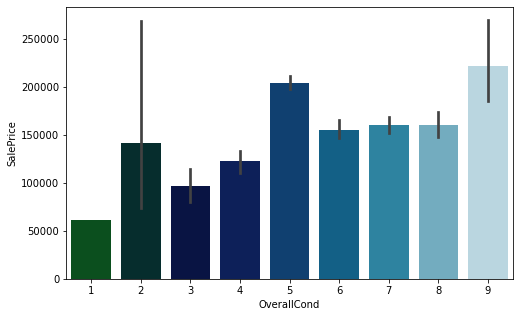

In [162]:
plt.figure(figsize=(8,5))
sns.barplot(x='OverallCond',y='SalePrice',data=housing,palette='ocean')

Houses having "9" rating in Overall Condition is having highest SalePrice and "1" is having least SalePrice

<AxesSubplot:xlabel='YearBuilt', ylabel='SalePrice'>

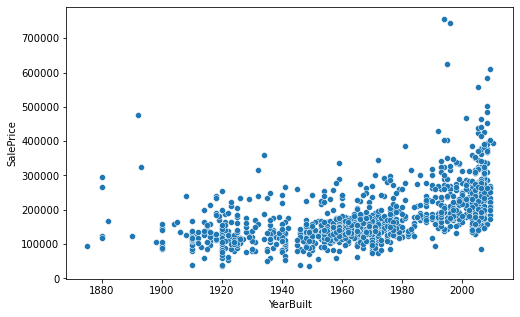

In [163]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='YearBuilt',y='SalePrice',data=housing,palette='ocean')

"New" built Houses are having highest SalePrice and "old" is having least SalePrice. SalePrice increases with how latest houses are built.

<AxesSubplot:xlabel='YearRemodAdd', ylabel='SalePrice'>

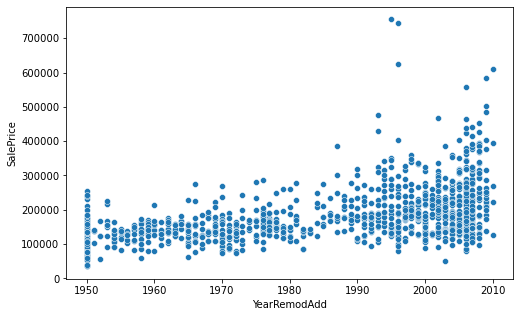

In [164]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='YearRemodAdd',y='SalePrice',data=housing,palette='ocean')

Houses having "new" YearRemodAdd is having highest SalePrice and "old" is having least SalePrice.

<AxesSubplot:xlabel='MasVnrArea', ylabel='SalePrice'>

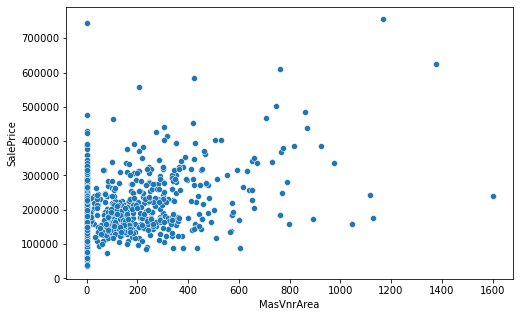

In [165]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='MasVnrArea',y='SalePrice',data=housing,palette='ocean') 

Houses having "more" MasVnrArea is having highest SalePrice and "less" is having least SalePrice. SalePrice increases with increase in MasVnrArea

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='SalePrice'>

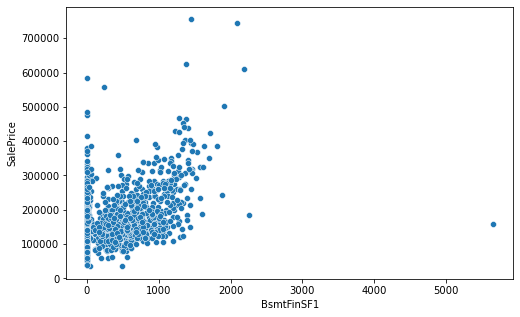

In [167]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='BsmtFinSF1',y='SalePrice',data=housing,palette='ocean')

Houses having BsmtFinSF1 in between 1000 to 2200 sqft is having highest SalePrice and "above 5000 sqft" is having least SalePrice. From 0to 2200 Saleprices increases as area sqft increas.

<AxesSubplot:xlabel='BsmtFinSF2', ylabel='SalePrice'>

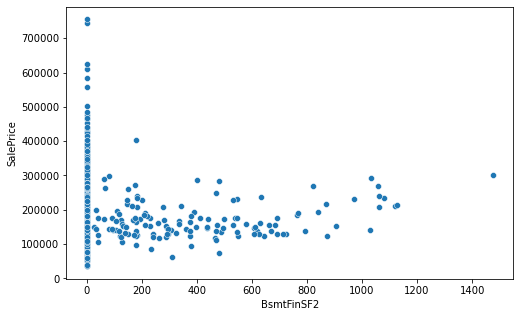

In [168]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='BsmtFinSF2',y='SalePrice',data=housing,palette='ocean')

Houses having "less area" BsmtFinSF2 is having highest SalePrice and "more area" is having least SalePrice.

<AxesSubplot:xlabel='BsmtUnfSF', ylabel='SalePrice'>

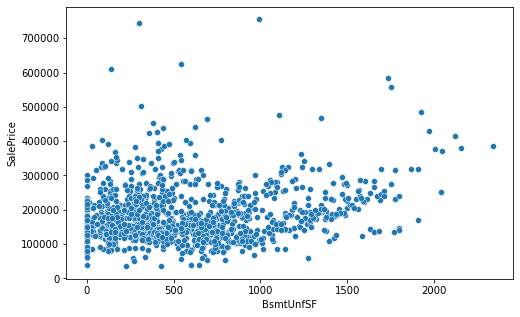

In [169]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='BsmtUnfSF',y='SalePrice',data=housing,palette='ocean')

We can see that as BsmtUnfSF Area increases it's SalePrice also increases

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='SalePrice'>

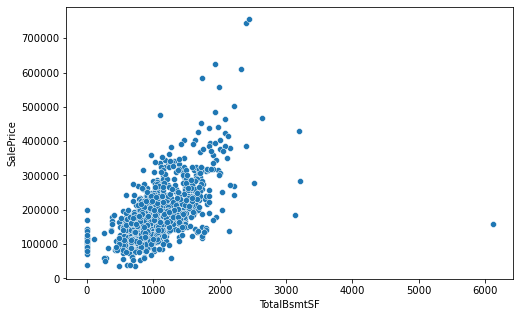

In [170]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='TotalBsmtSF',y='SalePrice',data=housing,palette='ocean')

We can see that as TotalBsmtSF Area increases it's SalePrice also increases and also "above 6000 sqft" is having least SalePrice

<AxesSubplot:xlabel='1stFlrSF', ylabel='SalePrice'>

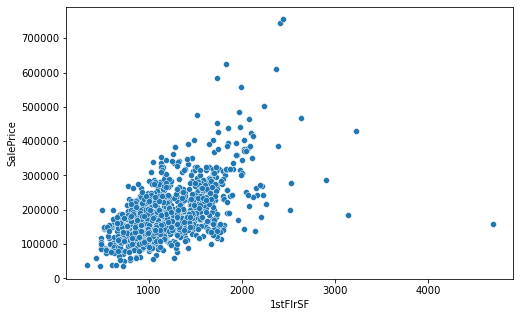

In [171]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='1stFlrSF',y='SalePrice',data=housing,palette='ocean')

we can see that as 1stFlrSF Area increases it's SalePrice also increases and also "above 4000" is having least SalePrice

<AxesSubplot:xlabel='2ndFlrSF', ylabel='SalePrice'>

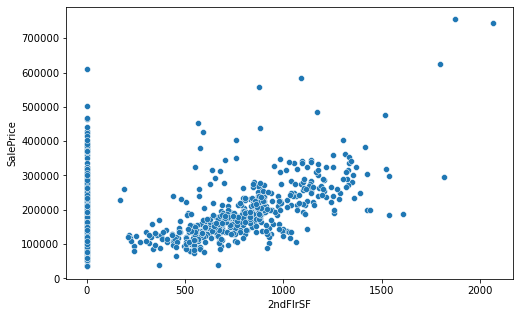

In [172]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='2ndFlrSF',y='SalePrice',data=housing,palette='ocean')

Houses having "less" 2ndFlrSF is having highest SalePrice and "more" is having least SalePrice

<AxesSubplot:xlabel='LowQualFinSF', ylabel='SalePrice'>

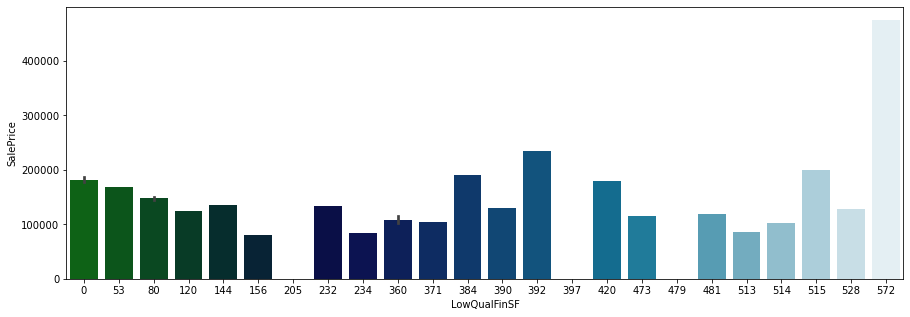

In [173]:
plt.figure(figsize=(15,5))
sns.barplot(x='LowQualFinSF',y='SalePrice',data=housing,palette='ocean')

Houses having "high" LowQualFinSF is having highest SalePrice and "156" is having least SalePrice

<AxesSubplot:xlabel='GrLivArea', ylabel='SalePrice'>

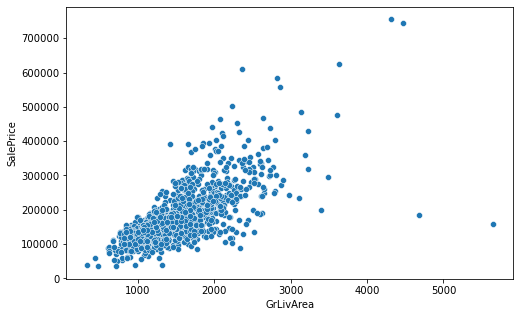

In [174]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='GrLivArea',y='SalePrice',data=housing,palette='ocean')

Houses having Living Area at Ground in "more sqft" is having highest SalePrice and "less sqft " is having least SalePrice. We can also see that in between 4500 to 5000 sqft Living area is having less SalePrice.

<AxesSubplot:xlabel='BsmtFullBath', ylabel='SalePrice'>

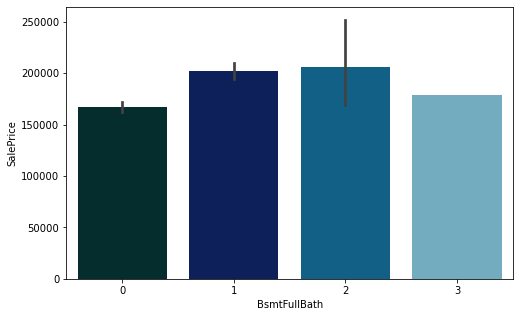

In [175]:
plt.figure(figsize=(8,5))
sns.barplot(x='BsmtFullBath',y='SalePrice',data=housing,palette='ocean')

Houses having "2" Full Bathroom at Basement is having highest SalePrice and "0" is having least SalePrice

<AxesSubplot:xlabel='BsmtHalfBath', ylabel='SalePrice'>

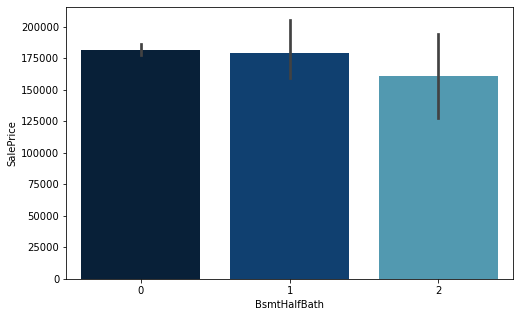

In [176]:
plt.figure(figsize=(8,5))
sns.barplot(x='BsmtHalfBath',y='SalePrice',data=housing,palette='ocean')

Houses having "0 & 1" Half Bathroom at Basement is having highest SalePrice and "2" is having least SalePrice

<AxesSubplot:xlabel='FullBath', ylabel='SalePrice'>

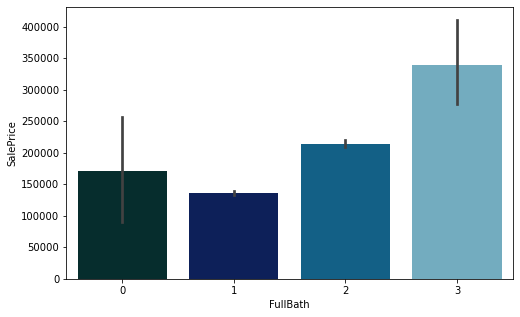

In [177]:
plt.figure(figsize=(8,5))
sns.barplot(x='FullBath',y='SalePrice',data=housing,palette='ocean')

Houses having "3" Full Bathroom is having highest SalePrice and "1" is having least SalePrice

<AxesSubplot:xlabel='HalfBath', ylabel='SalePrice'>

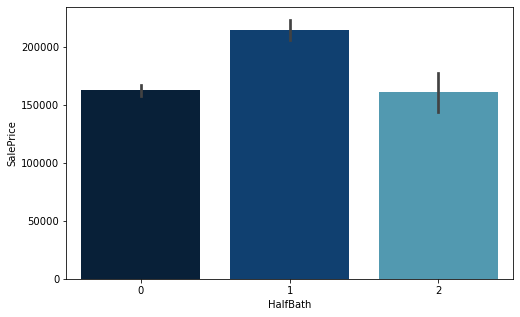

In [178]:
plt.figure(figsize=(8,5))
sns.barplot(x='HalfBath',y='SalePrice',data=housing,palette='ocean')

Houses having "1" Half Bathroom is having highest SalePrice and "0 & 2" is having least SalePrice

<AxesSubplot:xlabel='BedroomAbvGr', ylabel='SalePrice'>

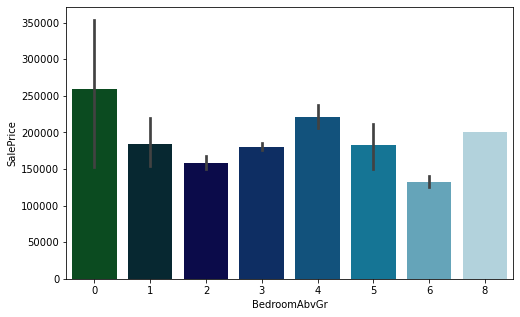

In [179]:
plt.figure(figsize=(8,5))
sns.barplot(x='BedroomAbvGr',y='SalePrice',data=housing,palette='ocean')

Houses having "0" Bedroom Above Ground is having highest SalePrice and "6" is having least SalePrice

<AxesSubplot:xlabel='KitchenAbvGr', ylabel='SalePrice'>

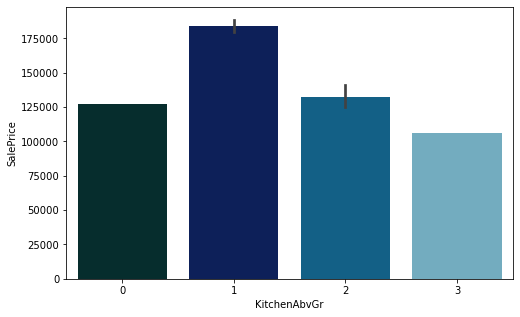

In [180]:
plt.figure(figsize=(8,5))
sns.barplot(x='KitchenAbvGr',y='SalePrice',data=housing,palette='ocean')

Houses having "1" Kitchen Above Ground is having highest SalePrice and "3" is having least SalePrice

<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='SalePrice'>

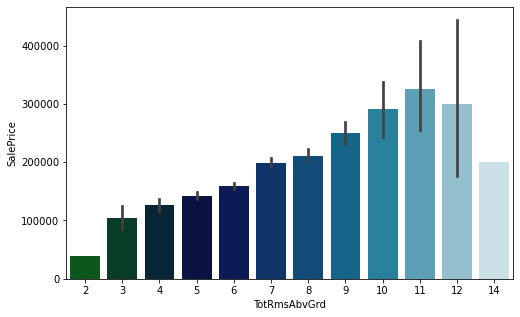

In [181]:
plt.figure(figsize=(8,5))
sns.barplot(x='TotRmsAbvGrd',y='SalePrice',data=housing,palette='ocean')

Houses having "11" Total Rooms Above Ground is having highest SalePrice and "2" Total Rooms Above Ground is having least SalePrice

<AxesSubplot:xlabel='Fireplaces', ylabel='SalePrice'>

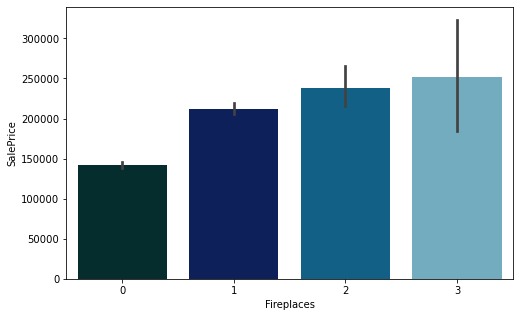

In [182]:
plt.figure(figsize=(8,5))
sns.barplot(x='Fireplaces',y='SalePrice',data=housing,palette='ocean')

Houses having "3" Fire places is having highest SalePrice and "0" is having least SalePrice. We can see as Fire places Increases, SalePrice also Increases.

<AxesSubplot:xlabel='GarageYrBlt', ylabel='SalePrice'>

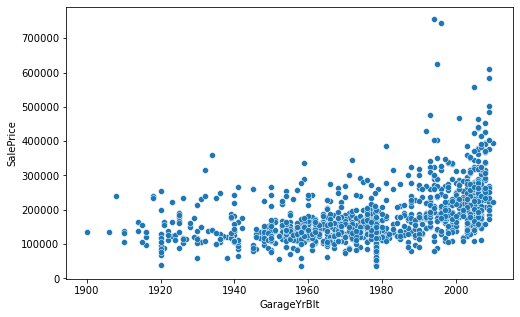

In [183]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='GarageYrBlt',y='SalePrice',data=housing,palette='ocean')

Garage built for Houses in year 2000 is having highest SalePrice and Garage built for Houses in year 1900 is having least SalePrice. We can see having new built Garage of houses is having high Saleprice for those houses and Houses having old Garage is having less Saleprice.

<AxesSubplot:xlabel='GarageCars', ylabel='SalePrice'>

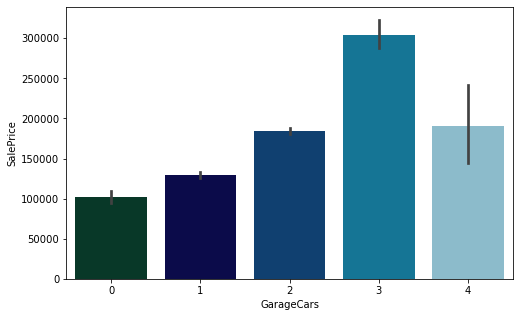

In [184]:
plt.figure(figsize=(8,5))
sns.barplot(x='GarageCars',y='SalePrice',data=housing,palette='ocean')

Houses having Garage for "3" Cars is having highest SalePrice and Garage for "0" Cars is having least SalePrice

<AxesSubplot:xlabel='GarageArea', ylabel='SalePrice'>

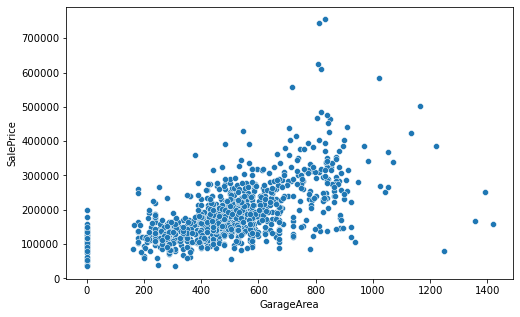

In [185]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='GarageArea',y='SalePrice',data=housing,palette='ocean')

Houses having GarageArea in between 800 to 900 sqft is having highest SalePrice and in between 1200 to 1300 sqft is having least SalePrice

<AxesSubplot:xlabel='WoodDeckSF', ylabel='SalePrice'>

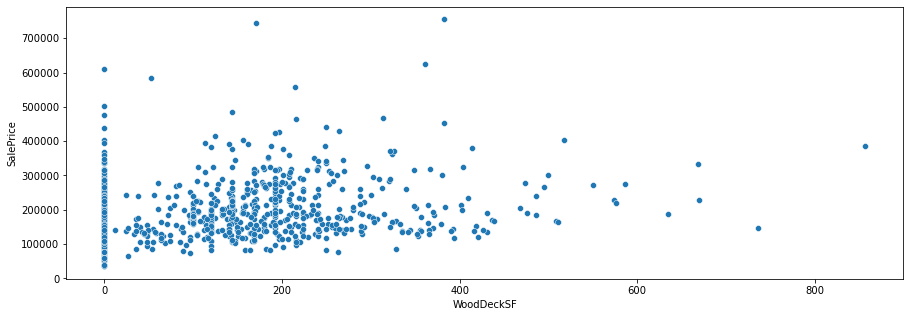

In [186]:
plt.figure(figsize=(15,5))
sns.scatterplot(x='WoodDeckSF',y='SalePrice',data=housing,palette='ocean')

Houses having "less" WoodDeckSF is having highest SalePrice and "more" WoodDeckSF is having least SalePrice. We can see as WoodDeckSF increases it's SalePrice decreases

<AxesSubplot:xlabel='OpenPorchSF', ylabel='SalePrice'>

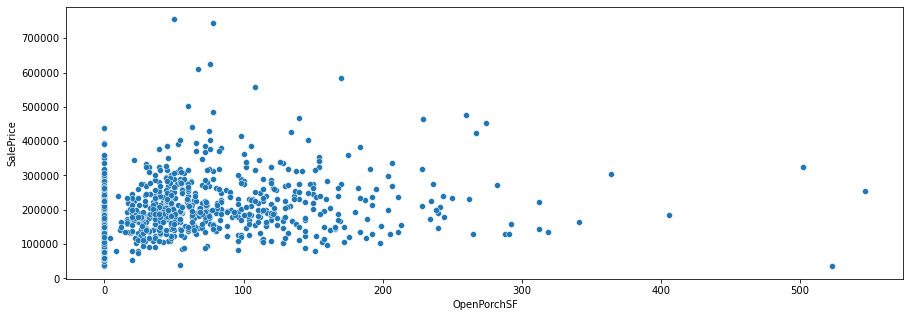

In [187]:
plt.figure(figsize=(15,5))
sns.scatterplot(x='OpenPorchSF',y='SalePrice',data=housing,palette='ocean')

Houses having "less" Semi-Furnished Open Porch is having highest SalePrice and "more" Semi-Furnished Open Porch is having less SalePrice. We can see as Semi-Furnished Open Porch increases it's SalePrice decreases

<AxesSubplot:xlabel='EnclosedPorch', ylabel='SalePrice'>

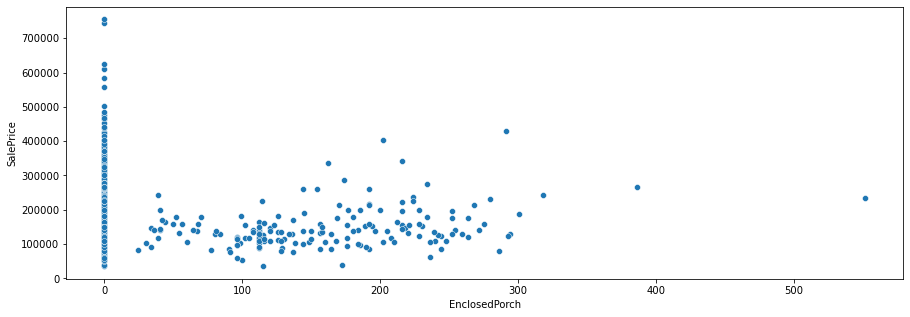

In [188]:
plt.figure(figsize=(15,5))
sns.scatterplot(x='EnclosedPorch',y='SalePrice',data=housing,palette='ocean')

Houses having "less" Porch enclosed is having highest SalePrice and as enclosed Porch increases it's SalePrice decreases

<AxesSubplot:xlabel='3SsnPorch', ylabel='SalePrice'>

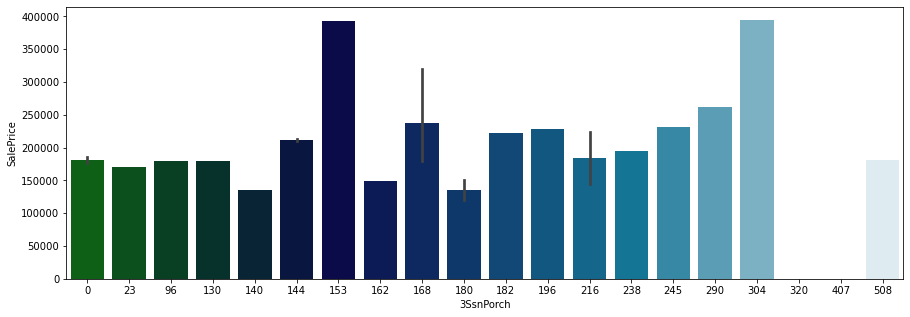

In [189]:
plt.figure(figsize=(15,5))
sns.barplot(x='3SsnPorch',y='SalePrice',data=housing,palette='ocean')

Houses having "304" Three Season Porch is having highest SalePrice and "140" is having least SalePrice and "320 & 407" is having 0 SalePrice

<AxesSubplot:xlabel='ScreenPorch', ylabel='SalePrice'>

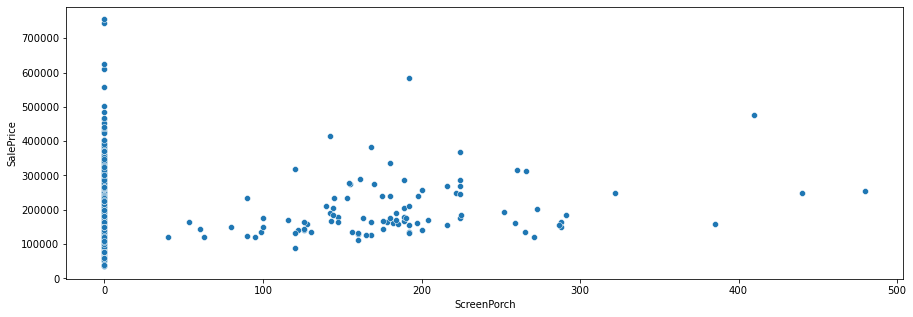

In [190]:
plt.figure(figsize=(15,5))
sns.scatterplot(x='ScreenPorch',y='SalePrice',data=housing,palette='ocean')

Houses having "less" Porch Screen is having highest SalePrice and as Porch Screen increased it's SalePrice got decreased

<AxesSubplot:xlabel='PoolArea', ylabel='SalePrice'>

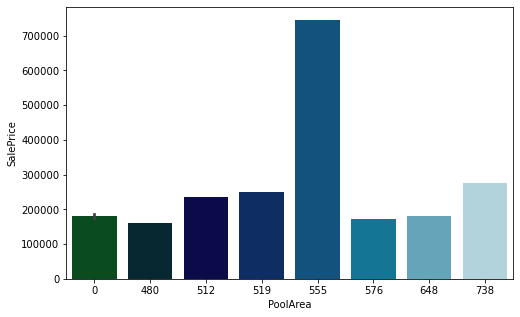

In [191]:
plt.figure(figsize=(8,5))
sns.barplot(x='PoolArea',y='SalePrice',data=housing,palette='ocean')

Houses having "555 sq ft" PoolArea is having highest SalePrice and "480sq ft" is having least SalePrice

<AxesSubplot:xlabel='MiscVal', ylabel='SalePrice'>

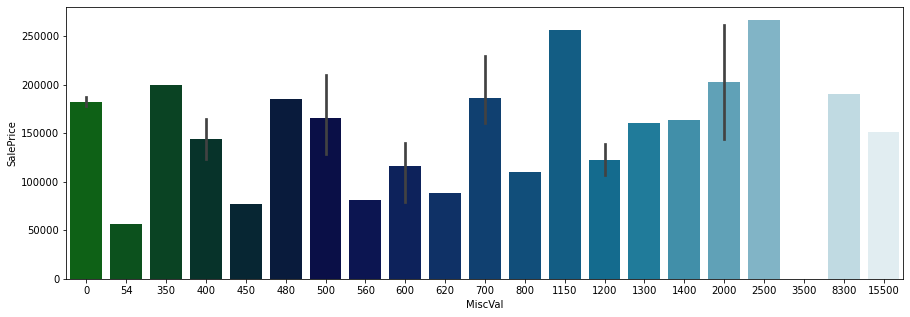

In [192]:
plt.figure(figsize=(15,5))
sns.barplot(x='MiscVal',y='SalePrice',data=housing,palette='ocean')

Misc Value "2500" of Houses is having highest SalePrice and "54" is having least SalePrice

<AxesSubplot:xlabel='MoSold', ylabel='SalePrice'>

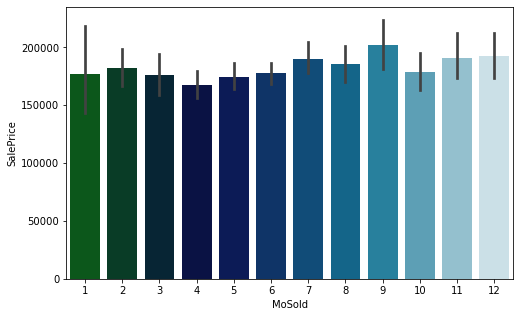

In [193]:
plt.figure(figsize=(8,5))
sns.barplot(x='MoSold',y='SalePrice',data=housing,palette='ocean')

Houses Sold in month "9th" that is September is having highest SalePrice and sold in month "4th" that is April is having least SalePrice

<AxesSubplot:xlabel='YrSold', ylabel='SalePrice'>

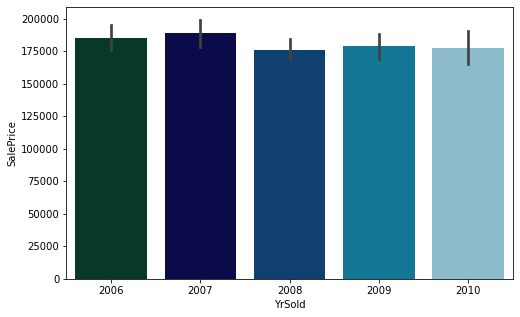

In [194]:
plt.figure(figsize=(8,5))
sns.barplot(x='YrSold',y='SalePrice',data=housing,palette='ocean')

Houses sold in year "2007" is having highest SalePrice and sold in year "2008" is having least SalePrice.

# Multivariate Analysis
## Using Pairplot

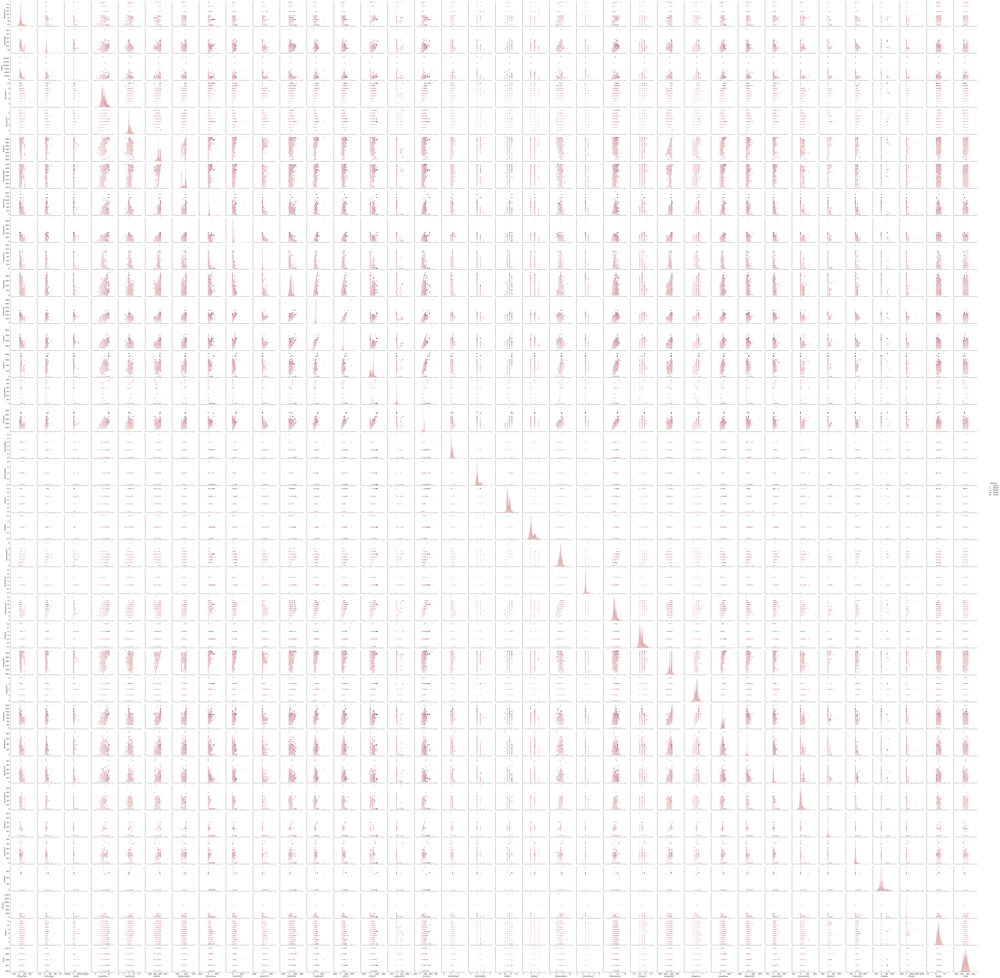

In [195]:
sns.pairplot(housing,hue="SalePrice")

We can observe relationship between all the continuous column and the target column by this pairplot in pairs which are plotted on basis of target column.

## Label Encoding

In [196]:
from sklearn.preprocessing import LabelEncoder

In [197]:
housing.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

In [198]:
enc = LabelEncoder()
#housing= housing.drop(['dataset'])
for i in housing.columns.drop(['dataset']):
    if housing[i].dtypes=="object":
        housing[i]=enc.fit_transform(housing[i].values.reshape(-1,1))

In [199]:
housing.dtypes

MSSubClass         int64
MSZoning           int32
LotFrontage      float64
LotArea            int64
Street             int32
LotShape           int32
LandContour        int32
Utilities          int32
LotConfig          int32
LandSlope          int32
Neighborhood       int32
Condition1         int32
Condition2         int32
BldgType           int32
HouseStyle         int32
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle          int32
RoofMatl           int32
Exterior1st        int32
Exterior2nd        int32
MasVnrType         int32
MasVnrArea       float64
ExterQual          int32
ExterCond          int32
Foundation         int32
BsmtQual           int32
BsmtCond           int32
BsmtExposure       int32
BsmtFinType1       int32
BsmtFinSF1         int64
BsmtFinType2       int32
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating            int32
HeatingQC          int32
CentralAir         int32


In [200]:
housing.shape

(1460, 78)

### Checking dataset after transformation

In [201]:
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,120,3,70.049958,4928,1,0,3,0,4,0,13,2,2,4,2,6,5,1976,1976,1,1,9,10,2,0.0,3,4,1,2,3,3,0,120,5,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,4,1,1977.0,1,2,440,4,4,2,0,205,0,0,0,0,2,0,2,2007,8,4,128000.0,train
1,20,3,95.000000,15865,1,0,3,0,4,1,12,2,2,0,2,8,6,1970,1970,0,5,13,14,2,0.0,2,2,2,3,1,1,0,351,4,823,1043,2217,1,0,1,4,2217,0,0,2217,1,0,2,0,4,1,2,8,6,1,4,1,1970.0,2,2,621,4,4,2,81,207,0,0,224,0,2,0,10,2007,8,4,268000.0,train
2,60,3,92.000000,9920,1,0,3,0,1,0,15,2,2,0,5,7,5,1996,1997,1,1,8,8,2,0.0,2,4,2,2,3,0,2,862,5,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,4,1,1997.0,2,2,455,4,4,2,180,130,0,0,0,0,2,0,6,2007,8,4,269790.0,train
3,20,3,105.000000,11751,1,0,3,0,4,0,14,2,2,0,2,6,6,1977,1977,3,1,9,10,1,480.0,3,4,1,2,3,3,1,705,5,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,4,1,1977.0,1,2,546,4,4,2,0,122,0,0,0,0,2,0,1,2010,0,4,190000.0,train
4,20,3,70.049958,16635,1,0,3,0,2,0,14,2,2,0,2,6,7,1977,2000,1,1,5,5,3,126.0,2,4,1,2,3,3,0,1246,5,0,356,1602,1,2,1,4,1602,0,0,1602,0,1,2,0,3,1,2,8,6,1,4,1,1977.0,0,2,529,4,4,2,240,0,0,0,0,0,2,0,6,2009,8,4,215000.0,train


## Checking Correlation

In [202]:
housing.corr()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
MSSubClass,1.000000,0.035900,-3.570559e-01,-0.139781,-0.024969,0.119289,-0.002940,-2.284384e-02,0.075910,-0.025672,-0.005985,-0.024762,-0.042395,0.746063,0.397161,0.032628,-0.059316,0.027850,0.040581,-0.117817,-0.031336,-0.089159,-0.137229,-0.029850,0.022895,-0.017161,-0.003254,0.058126,-0.041065,-0.013652,-0.064221,0.016599,-0.069836,0.041195,-0.065649,-0.140759,-0.238518,0.048009,0.020760,-0.101774,0.051945,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.010129,0.040380,0.003711,-0.045569,0.033443,0.090719,0.080187,0.012301,-0.040110,-0.098672,0.007630,0.002927,-0.059925,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,0.026310,-0.007683,-0.013585,-0.021407,0.012464,-0.024940,-0.060775
MSZoning,0.035900,1.000000,-1.063635e-01,-0.034452,0.087654,0.061887,-0.017854,-1.192034e-03,-0.009895,-0.022055,-0.249679,-0.027874,0.044606,0.005690,-0.105315,-0.160099,0.186951,-0.308908,-0.174728,-0.000301,0.005133,-0.008558,0.006963,-0.028279,-0.066766,0.200536,-0.096041,-0.235174,0.128245,-0.010528,0.037209,0.024688,-0.049128,-0.031718,0.028086,-0.046749,-0.087834,0.056866,0.134279,-0.049523,-0.070818,-0.055614,-0.051481,0.011520,-0.082615,-0.018526,0.007193,-0.198290,-0.133876,-0.016471,0.049434,0.128976,-0.043200,-0.095722,-0.011349,-0.009943,0.116007,-0.264654,0.167501,-0.157042,-0.189250,-0.150802,-0.083272,-0.100366,-0.009477,-0.154704,0.115509,0.000362,0.019089,-0.003128,-0.027981,0.009293,-0.031496,-0.020628,0.097437,0.009494,-0.133221
LotFrontage,-0.357056,-0.106363,1.000000e+00,0.306795,-0.037323,-0.144931,-0.075647,-8.360070e-17,-0.181253,0.067608,0.084545,-0.008483,0.003214,-0.408564,0.031907,0.234196,-0.052820,0.117598,0.082746,0.153467,0.082026,0.074448,0.098756,-0.020220,0.179283,-0.183293,0.047951,0.098809,-0.168367,0.051534,-0.124127,-0.025233,0.215828,-0.026775,0.043340,0.122156,0.363358,-0.020815,-0.079975,0.068666,0.060213,0.414266,0.072483,0.036849,0.368392,0.091481,-0.006419,0.180424,0.048258,0.237023,-0.005805,-0.189082,0.320146,0.030250,0.235755,0.059456,-0.217793,0.064324,-0.212056,0.269729,0.323663,0.051108,0.043163,0.089073,0.077106,0.137454,0.009790,0.062335,0.037684,0.180868,-0.035853,0.001168,0.010158,0.006768,-0.030846,0.058464,0.323850
LotArea,-0.139781,-0.034452,3.067946e-01,1.000000,-0.197131,-0.165315,-0.149083,1.012318e-02,-0.121161,0.436868,0.044569,0.023846,0.022164,-0.205721,-0.033190,0.105806,-0.005636,0.014228,0.013788,0.077054,0.149837,0.004256,-0.003930,-0.008122,0.103960,-0.057275,0.015160,-0.011081,-0.065150,0.012366,-0.141043,-0.061880,0.214103,-0.068954,0.111170,-0.002618,0.260833,0.028158,0.004212,0.049755,0.043856,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,-0.057018,0.190015,-0.022317,0.271364,0.069154,-0.116799,-0.024812,-0.116326,0.154871,0.180403,0.017551,0.028106,0.015134,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.005196,0.038068,0.001205,-0.014261,0.012292,0.034169,0.249499
Street,-0.024969,0.087654,-3.732277e-02,-0.197131,1.000000,-0.010224,0.115995,1.681767e-03,0.013960,-0.179360,-0.011561,-0.071657,0.002039,-0.018243,0.023704,0.058823,0.042848,0.021137,0

This gives the correlation between the dependent and independent variables.

In [203]:
pd.set_option('display.max_rows',None)
housing.corr()["SalePrice"].sort_values()

BsmtQual        -0.626850
ExterQual       -0.624820
KitchenQual     -0.592468
GarageFinish    -0.537121
HeatingQC       -0.406604
GarageType      -0.299470
BsmtExposure    -0.268559
LotShape        -0.248171
MSZoning        -0.133221
KitchenAbvGr    -0.132108
EnclosedPorch   -0.115004
Heating         -0.100021
BsmtFinType1    -0.092109
BldgType        -0.066028
OverallCond     -0.065642
MSSubClass      -0.060775
LotConfig       -0.060452
SaleType        -0.050851
YrSold          -0.045508
LowQualFinSF    -0.032381
MiscVal         -0.013071
BsmtHalfBath    -0.011109
BsmtFinSF2      -0.010151
MasVnrType       0.007732
LandSlope        0.015485
BsmtFinType2     0.032285
LandContour      0.032836
Condition2       0.033956
Fence            0.040678
Street           0.044753
BsmtCond         0.048125
3SsnPorch        0.060119
MoSold           0.072764
GarageQual       0.080795
FireplaceQu      0.082705
Exterior2nd      0.099028
ScreenPorch      0.100284
PoolArea         0.103280
Condition1  

### We can see:
* Column "OverallQual" is highly positively correlated with Target Column "SalePrice" and
* Column "BsmtQual" is highly negatively correlated with Target Column "SalePrice"
* Column "Utilities" have no Correlation with Target Column "SalePrice", So we will drop this column

## Checking correlation with heatmap

<AxesSubplot:>

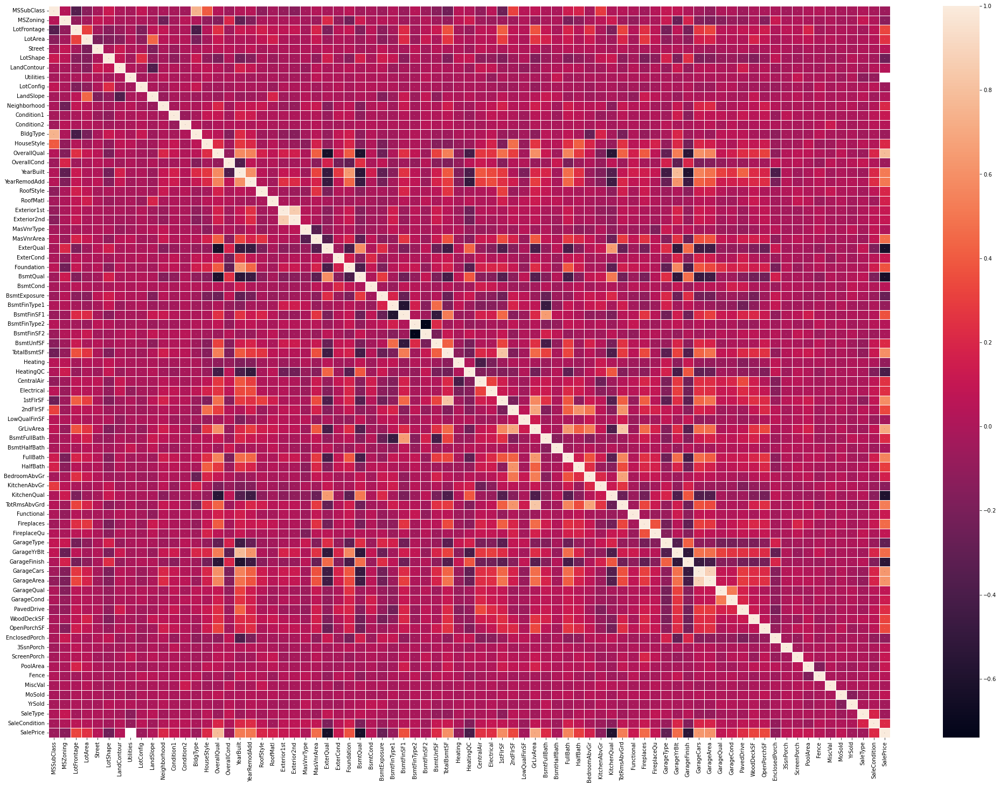

In [204]:
plt.figure(figsize=(35,25))
sns.heatmap(housing.corr(),annot=True, linewidth=0.5, linecolor='white', fmt='.2f',annot_kws= {"size": 0})

## Checking correlation with barplot

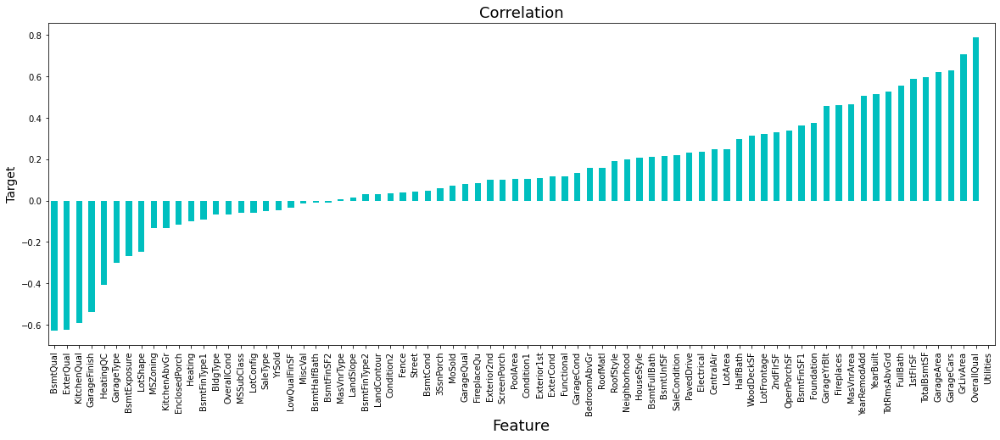

In [205]:
plt.figure(figsize=(20,7))
housing.corr()['SalePrice'].sort_values(ascending=True).drop(['SalePrice']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=18)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

## Observation
* We can also see target column have no correlation with "Utilities" and "dataset" column.
* Column "OverallQual" is highly positively correlated with Target Column "SalePrice" and having strong correlation
* Column "BsmtQual" is highly negatively correlated with Target Column "SalePrice" and having weak correlation

In [206]:
#Column Utilities have no correlation with target variable, so we will drop this column
housing.drop(columns=['Utilities'],inplace=True)

In [207]:
#checking all columns
housing.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPorchS

# Checking Outliers

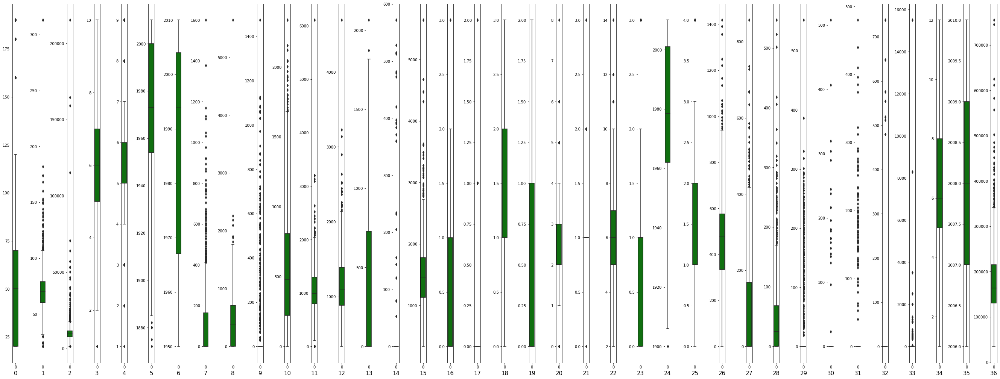

In [208]:
collist=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 
         'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 
         'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr','KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 
         'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 
         'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
ncol=37
nrows=8
plt.figure(figsize=(ncol,3*ncol))
for column in range(0,len(collist)):
    plt.subplot(nrows,ncol,column+1)
    sns.boxplot(data=housing[collist[column]],color='green',orient='v')
    plt.xlabel(column,fontsize = 15)
    plt.tight_layout()

### Observation:
* Outliers present in columns: 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond','YearBuilt', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'SalePrice'

* Outliers not present in columns: 'YearRemodAdd','FullBath', 'HalfBath', 'MoSold', 'YrSold',

# Removing Outliers
## 1.1 Zscore method using Scipy

In [209]:
#  Outliers will be removed only from column i.e;  'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond','YearBuilt', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'
# We will not remove outliers from Target column i.e; 'SalePrice'.

variable = housing[['BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomAbvGr', 
'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']]

z=np.abs(zscore(variable))

# Creating new dataframe
housing_price= housing[(z<3).all(axis=1)]
housing_price.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,120,3,70.049958,4928,1,0,3,4,0,13,2,2,4,2,6,5,1976,1976,1,1,9,10,2,0.0,3,4,1,2,3,3,0,120,5,0,958,1078,1,4,1,4,958,0,0,958,0,0,2,0,2,1,3,5,6,1,4,1,1977.0,1,2,440,4,4,2,0,205,0,0,0,0,2,0,2,2007,8,4,128000.0,train
2,60,3,92.000000,9920,1,0,3,1,0,15,2,2,0,5,7,5,1996,1997,1,1,8,8,2,0.0,2,4,2,2,3,0,2,862,5,0,255,1117,1,0,1,4,1127,886,0,2013,1,0,2,1,3,1,3,8,6,1,4,1,1997.0,2,2,455,4,4,2,180,130,0,0,0,0,2,0,6,2007,8,4,269790.0,train
3,20,3,105.000000,11751,1,0,3,4,0,14,2,2,0,2,6,6,1977,1977,3,1,9,10,1,480.0,3,4,1,2,3,3,1,705,5,0,1139,1844,1,0,1,4,1844,0,0,1844,0,0,2,0,3,1,3,7,6,1,4,1,1977.0,1,2,546,4,4,2,0,122,0,0,0,0,2,0,1,2010,0,4,190000.0,train
5,60,3,58.000000,14054,1,0,3,4,0,8,2,2,0,5,7,5,2006,2006,1,1,12,13,2,0.0,2,4,2,2,3,0,5,0,5,0,879,879,1,0,1,4,879,984,0,1863,0,0,2,1,4,1,2,9,6,1,2,3,2006.0,0,3,660,4,4,2,100,17,0,0,0,0,2,0,11,2006,6,5,219210.0,train
6,20,3,70.049958,11341,1,0,3,4,0,19,2,2,0,2,5,6,1957,1996,3,1,13,14,1,180.0,3,4,1,2,3,3,0,1302,5,0,90,1392,1,4,1,4,1392,0,0,1392,1,0,1,1,3,1,3,5,4,1,2,5,1957.0,2,2,528,4,4,2,0,0,0,0,95,0,2,0,5,2010,8,4,121500.0,train


In [210]:
z.head()

,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal
0,0.884641,0.046905,0.529496,0.795163,0.120242,1.061228,0.819964,0.241061,1.062465,0.211454,0.934130,0.600495,0.062793,0.311725,0.154306,0.752176,2.390635,0.359325,0.116339,0.270208,0.068692,0.087688
1,1.077072,2.644071,2.728319,0.795163,0.120242,1.335495,1.107810,0.241061,1.390023,0.211454,0.912210,0.600495,0.354625,0.311725,0.692550,0.105706,2.420831,0.359325,0.116339,3.748571,0.068692,0.087688
2,0.706881,0.135834,0.092188,1.235182,0.120242,0.947146,1.107810,0.241061,0.163779,0.211454,0.912210,0.600495,0.771015,0.311725,0.084125,0.684424,1.258275,0.359325,0.116339,0.270208,0.068692,0.087688
3,1.294407,1.793550,1.763136,0.795163,0.120242,0.625426,0.819964,0.241061,0.163779,0.211454,0.296763,0.600495,0.062793,0.311725,0.341643,0.752176,1.137490,0.359325,0.116339,0.270208,0.068692,0.087688
4,0.478227,1.241738,1.136932,0.795163,0.120242,0.164737,0.819964,3.948809,0.163779,0.211454,0.912210,0.600495,0.062793,0.311725,0.262104,1.163290,0.704483,0.359325,0.116339,0.270208,0.068692,0.087688


In [211]:
print("Old DataFrame data in Rows and Column:",housing.shape)
print("New DataFrame data in Rows and Column:",housing_price.shape)
print("Total Dropped rows:",housing.shape[0]-housing_price.shape[0])

Old DataFrame data in Rows and Column: (1460, 77)
New DataFrame data in Rows and Column: (1104, 77)
Total Dropped rows: 356


## Percentage Data Loss using Zscore

In [212]:
loss_percent=(1460-1104)/1460*100
print(loss_percent,"%")

24.383561643835616 %


## 2. IQR (Inter Quantile Range) method

In [213]:
#1st quantile
Q1=variable.quantile(0.25)

# 3rd quantile
Q3=variable.quantile(0.75)

#IQR
IQR=Q3 - Q1
housing_price_pred=housing[~((housing < (Q1 - 1.5 * IQR)) |(housing > (Q3 + 1.5 * IQR))).any(axis=1)]

In [214]:
print("Old DataFrame data in Rows and Column:",housing.shape)
print("\nNew DataFrame data in Rows and Column:",housing_price_pred.shape)
print("\nTotal Dropped rows:",housing.shape[0]-housing_price_pred.shape[0])

Old DataFrame data in Rows and Column: (1460, 77)

New DataFrame data in Rows and Column: (816, 77)

Total Dropped rows: 644


## Percentage Data Loss using IQR

In [215]:
loss_perc = (1460-816)/1460*100
loss_perc

44.109589041095894

### We can check by using IQR method there is large data loss in comparision to Zscore method. So, we will consider Zscore method.

In [216]:
housing_price.shape

(1104, 77)

# Checking Skewness

In [217]:
pd.set_option('display.max_rows',None)
housing_price.skew()

MSSubClass        1.440879
MSZoning         -1.684441
LotFrontage       1.866804
LotArea           7.791523
Street          -19.131048
LotShape         -0.643270
LandContour      -3.373814
LotConfig        -1.225288
LandSlope         5.053912
Neighborhood      0.106654
Condition1        3.329420
Condition2       21.238748
BldgType          2.283887
HouseStyle        0.318479
OverallQual       0.030738
OverallCond       0.707544
YearBuilt        -0.654379
YearRemodAdd     -0.597253
RoofStyle         1.642685
RoofMatl         13.020468
Exterior1st      -0.755625
Exterior2nd      -0.724403
MasVnrType       -0.034395
MasVnrArea        2.533248
ExterQual        -1.579094
ExterCond        -2.692044
Foundation       -0.150653
BsmtQual         -1.314776
BsmtCond         -3.651064
BsmtExposure     -1.220853
BsmtFinType1     -0.066566
BsmtFinSF1        0.668542
BsmtFinType2     -3.864488
BsmtFinSF2        4.956601
BsmtUnfSF         0.791558
TotalBsmtSF       0.208006
Heating          10.594559
H

### Observation:
* Skewness threshold is taken +/- 0.25.
* We can see Skewness is present in all columns except 4 columns.
* We will remove skewness from: MSSubClass, LotFrontage, LotArea, OverallQual, OverallCond, YearBuilt, YearRemodAdd, MasVnrArea, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtFullBath, HalfBath, TotRmsAbvGrd, Fireplaces, GarageYrBlt, GarageCars, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, MiscVal
* We will not remove skewness from columns: BsmtHalfBath, FullBath, BedroomAbvGr, KitchenAbvGr, GarageArea, PoolArea, MoSold, YrSold as these column is having values less than 0.25
* Also We will not remove skewness from Target Column: SalePrice and from all categorical Column.

## Checking skweness through Data Visualization also

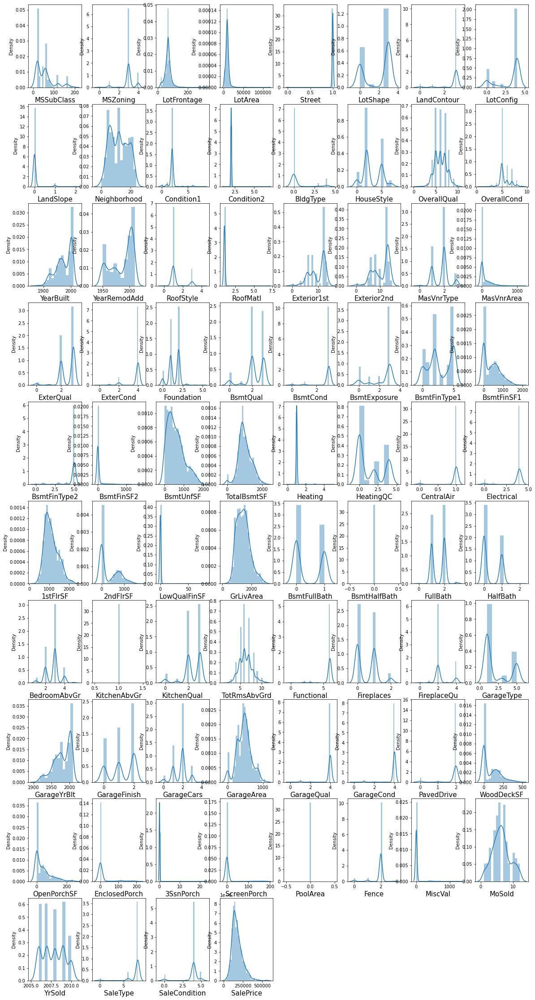

In [218]:
plt.figure(figsize=(20,40), facecolor='white')
plotnumber = 1

for column in housing_price:
    if plotnumber<=76:
        ax = plt.subplot(10,8,plotnumber)
        sns.distplot(housing_price[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

# Data visualization of skewed continuous column using distplot

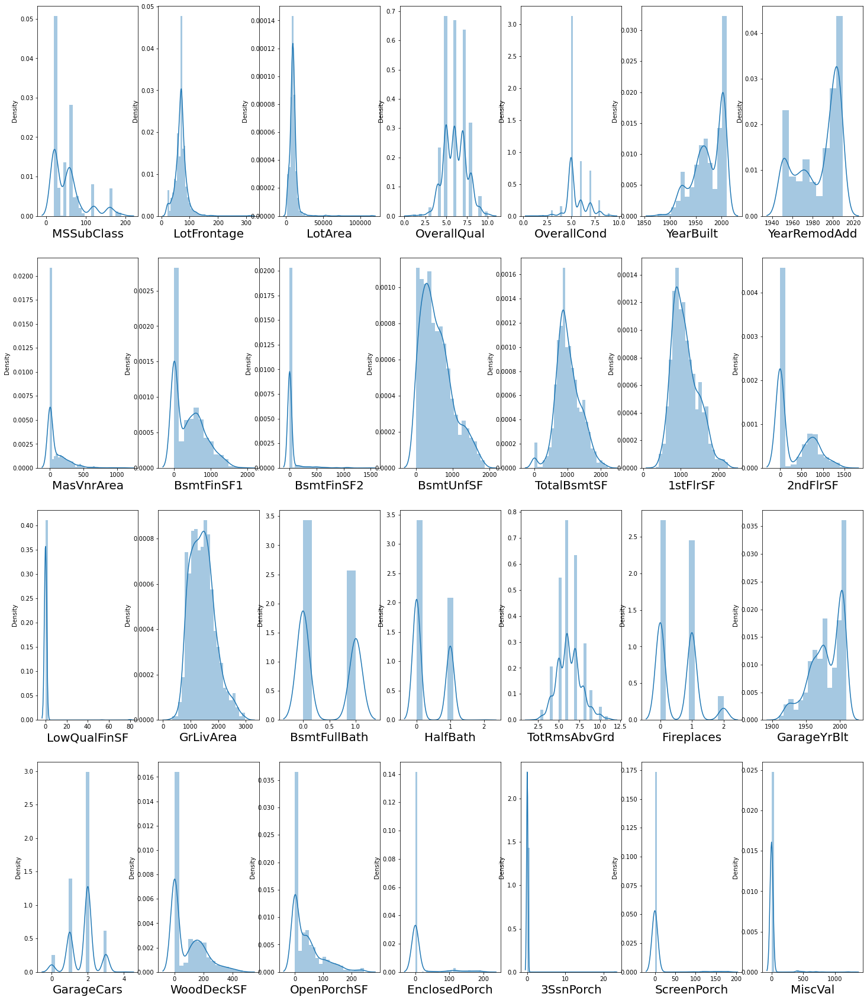

In [219]:
collist=[ 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 
         'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 
         'BsmtFullBath', 'HalfBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 
         'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal' ]
plt.figure(figsize=(25,30), facecolor='white')
plotnumber = 1

for column in housing_price[collist]:
    if plotnumber<=28:
        ax = plt.subplot(4,7,plotnumber)
        sns.distplot(housing_price[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

# Removing skewness using yeo-johnson method

In [220]:
from sklearn.preprocessing import PowerTransformer

In [221]:
collist=['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 
         'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 
         'BsmtFullBath', 'HalfBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 
         'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal']
housing_price[collist]=power_transform(housing_price[collist],method='yeo-johnson')
housing_price[collist]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,HalfBath,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal
0,1.408088,0.123016,-1.110893,-0.064347,-0.469229,-0.134534,-0.706783,-0.829290,-0.075035,-0.327600,0.937383,0.168921,-0.350817,-0.855469,-0.060302,-1.128103,-0.864196,-0.783561,-0.881826,0.874973,-0.336215,0.298403,-0.982440,1.488006,-0.371678,-0.030110,-0.215512,-0.158334
2,0.595115,1.101521,0.248881,0.675242,-0.469229,0.710775,0.408361,-0.829290,0.962234,-0.327600,-0.578777,0.271990,0.182795,1.202766,-0.060302,1.236574,1.157144,1.275252,1.174308,0.874973,0.667242,0.298403,1.041316,1.246306,-0.371678,-0.030110,-0.215512,-0.158334
3,-1.116500,1.632317,0.612800,-0.064347,0.495693,-0.097238,-0.665052,1.393440,0.834609,-0.327600,1.218880,2.119053,1.832857,-0.855469,-0.060302,0.934338,-0.864196,-0.783561,0.539363,0.874973,-0.336215,0.298403,-0.982440,1.213017,-0.371678,-0.030110,-0.215512,-0.158334
5,0.595115,-0.472329,1.013240,0.675242,-0.469229,1.221942,1.077895,-0.829290,-1.329447,-0.327600,0.806058,-0.365464,-0.631330,1.221316,-0.060302,0.969335,-0.864196,1.275252,1.770405,0.874973,1.237139,1.854446,0.834411,0.238222,-0.371678,-0.030110,-0.215512,-0.158334
6,-1.116500,0.123016,0.535305,-0.807736,0.495693,-0.758593,0.342144,1.217855,1.242348,-0.327600,-1.240434,0.985788,0.884419,-0.855469,-0.060302,0.007912,1.157144,1.275252,-0.881826,0.874973,-1.058663,0.298403,-0.982440,-1.089812,-0.371678,-0.030110,4.640109,-0.158334
7,-1.116500,0.931617,0.858248,-0.807736,-1.559547,-0.758593,0.616383,0.996529,0.071425,3.052800,-0.488886,0.316762,1.756415,-0.855469,-0.060302,0.857882,1.157144,-0.783561,1.174308,0.874973,-1.058663,0.298403,-0.982440,-1.089812,-0.371678,-0.030110,-0.215512,-0.158334
8,-1.116500,0.120645,0.084796,-0.807736,1.364833,-0.514456,-1.107150,-0.829290,0.828421,3.051947,-0.119118,0.526248,0.428814,-0.855469,-0.060302,-0.420226,1.157144,-0.783561,-0.142356,-0.990749,-0.797951,0.298403,-0.982440,-1.089812,2.691574,-0.030110,-0.215512,6.315765
9,0.349385,0.581220,-0.075519,-0.807736,-0.469229,-1.030012,-1.511127,-0.829290,0.559156,-0.327600,-0.194726,-0.493986,-0.809665,1.044555,-0.060302,-0.415160,-0.864196,-0.783561,-0.142356,-0.990749,-1.339430,-1.070872,0.995766,-1.089812,2.690975,-0.030110,-0.215512,-0.158334
10,0.349385,-0.898151,-0.046937,-0.064347,0.495693,-1.268072,-1.511127,-0.829290,-1.329447,-0.327600,0.632693,-0.637347,-1.018338,1.130090,-0.060302,-0.028823,-0.864196,-0.783561,0.539363,0.874973,-1.577054,-1.070872,-0.982440,-1.089812,-0.371678,-0.030110,-0.215512,-0.158334
11,0.595115,-1.237509,0.168731,0.675242,0.495693,1.061689,0.839218,1.259657,0.609333,-0.327600,-0.027185,-0.197350,-0.409298,1.203167,-0.060302,0.906516,1.157144,1.275252,0.539363,0.874973,1.037854,0.298403,1.063792,0.633888,-0.371678,-0.030110,-0.215512,-0.158334


## checking skewness after removal

In [222]:
housing_price.skew()

MSSubClass        0.108407
MSZoning         -1.684441
LotFrontage       0.214713
LotArea           0.161216
Street          -19.131048
LotShape         -0.643270
LandContour      -3.373814
LotConfig        -1.225288
LandSlope         5.053912
Neighborhood      0.106654
Condition1        3.329420
Condition2       21.238748
BldgType          2.283887
HouseStyle        0.318479
OverallQual       0.008719
OverallCond       0.043442
YearBuilt        -0.176807
YearRemodAdd     -0.295674
RoofStyle         1.642685
RoofMatl         13.020468
Exterior1st      -0.755625
Exterior2nd      -0.724403
MasVnrType       -0.034395
MasVnrArea        0.401460
ExterQual        -1.579094
ExterCond        -2.692044
Foundation       -0.150653
BsmtQual         -1.314776
BsmtCond         -3.651064
BsmtExposure     -1.220853
BsmtFinType1     -0.066566
BsmtFinSF1       -0.403103
BsmtFinType2     -3.864488
BsmtFinSF2        2.728609
BsmtUnfSF        -0.256166
TotalBsmtSF      -0.073352
Heating          10.594559
H

In [223]:
#checking only for those skewed continuous columns
collist=[ 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 
         'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 
         'BsmtFullBath', 'HalfBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 
         'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal' ]
housing_price[collist].skew()

MSSubClass        0.108407
LotFrontage       0.214713
LotArea           0.161216
OverallQual       0.008719
OverallCond       0.043442
YearBuilt        -0.176807
YearRemodAdd     -0.295674
MasVnrArea        0.401460
BsmtFinSF1       -0.403103
BsmtFinSF2        2.728609
BsmtUnfSF        -0.256166
TotalBsmtSF      -0.073352
1stFlrSF         -0.001675
2ndFlrSF          0.317344
LowQualFinSF     16.545310
GrLivArea        -0.005413
BsmtFullBath      0.293347
HalfBath          0.493602
TotRmsAbvGrd      0.005202
Fireplaces        0.110939
GarageYrBlt      -0.174613
GarageCars       -0.033428
WoodDeckSF        0.066043
OpenPorchSF      -0.051650
EnclosedPorch     2.321984
3SsnPorch        33.226495
ScreenPorch       4.430619
MiscVal           6.165812
dtype: float64

# checking skewness after removal through data visualization using distplot

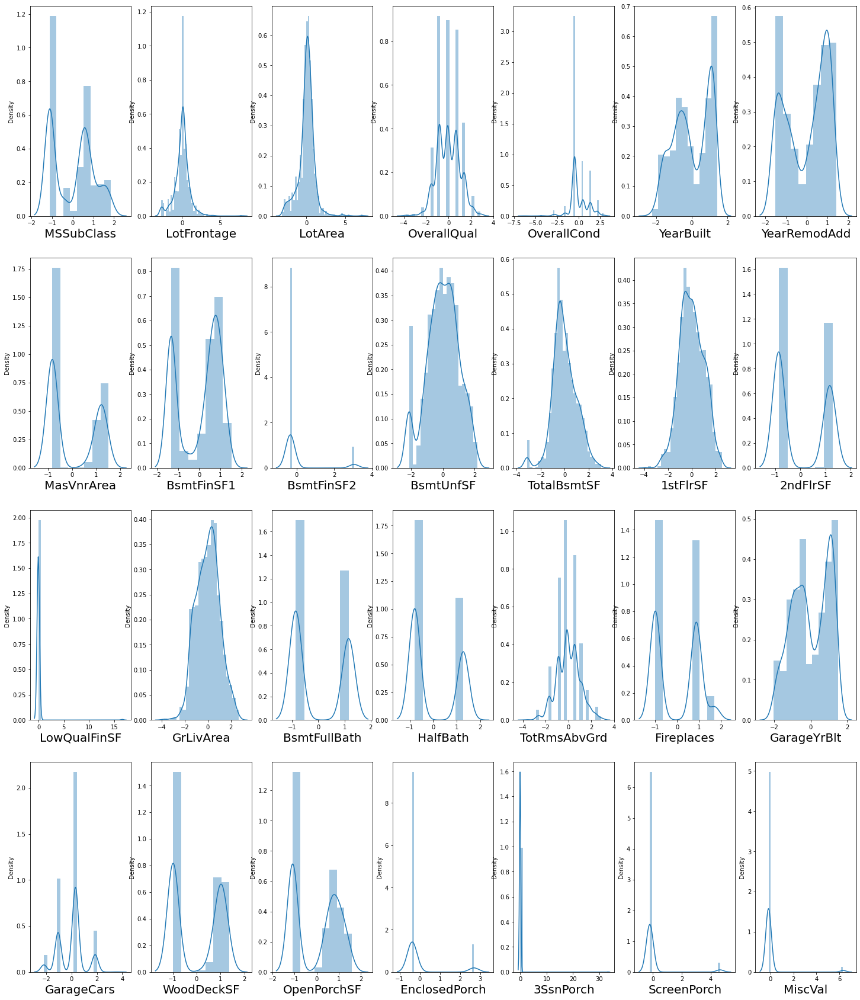

In [224]:
collist=[ 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 
         'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 
         'BsmtFullBath', 'HalfBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 
         'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal' ]
plt.figure(figsize=(25,30), facecolor='white')
plotnumber = 1

for column in housing_price[collist]:
    if plotnumber<=28:
        ax = plt.subplot(4,7,plotnumber)
        sns.distplot(housing_price[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

The data is not normal but the skewness has got removed compared to the old data.

In [225]:
housing_price.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,1.408088,3,0.123016,-1.110893,1,0,3,4,0,13,2,2,4,2,-0.064347,-0.469229,-0.134534,-0.706783,1,1,9,10,2,-0.829290,3,4,1,2,3,3,0,-0.075035,5,-0.3276,0.937383,0.168921,1,4,1,4,-0.350817,-0.855469,-0.060302,-1.128103,-0.864196,0,2,-0.783561,2,1,3,-0.881826,6,0.874973,4,1,-0.336215,1,0.298403,440,4,4,2,-0.982440,1.488006,-0.371678,-0.03011,-0.215512,0,2,-0.158334,2,2007,8,4,128000.0,train
2,0.595115,3,1.101521,0.248881,1,0,3,1,0,15,2,2,0,5,0.675242,-0.469229,0.710775,0.408361,1,1,8,8,2,-0.829290,2,4,2,2,3,0,2,0.962234,5,-0.3276,-0.578777,0.271990,1,0,1,4,0.182795,1.202766,-0.060302,1.236574,1.157144,0,2,1.275252,3,1,3,1.174308,6,0.874973,4,1,0.667242,2,0.298403,455,4,4,2,1.041316,1.246306,-0.371678,-0.03011,-0.215512,0,2,-0.158334,6,2007,8,4,269790.0,train
3,-1.116500,3,1.632317,0.612800,1,0,3,4,0,14,2,2,0,2,-0.064347,0.495693,-0.097238,-0.665052,3,1,9,10,1,1.393440,3,4,1,2,3,3,1,0.834609,5,-0.3276,1.218880,2.119053,1,0,1,4,1.832857,-0.855469,-0.060302,0.934338,-0.864196,0,2,-0.783561,3,1,3,0.539363,6,0.874973,4,1,-0.336215,1,0.298403,546,4,4,2,-0.982440,1.213017,-0.371678,-0.03011,-0.215512,0,2,-0.158334,1,2010,0,4,190000.0,train
5,0.595115,3,-0.472329,1.013240,1,0,3,4,0,8,2,2,0,5,0.675242,-0.469229,1.221942,1.077895,1,1,12,13,2,-0.829290,2,4,2,2,3,0,5,-1.329447,5,-0.3276,0.806058,-0.365464,1,0,1,4,-0.631330,1.221316,-0.060302,0.969335,-0.864196,0,2,1.275252,4,1,2,1.770405,6,0.874973,2,3,1.237139,0,1.854446,660,4,4,2,0.834411,0.238222,-0.371678,-0.03011,-0.215512,0,2,-0.158334,11,2006,6,5,219210.0,train
6,-1.116500,3,0.123016,0.535305,1,0,3,4,0,19,2,2,0,2,-0.807736,0.495693,-0.758593,0.342144,3,1,13,14,1,1.217855,3,4,1,2,3,3,0,1.242348,5,-0.3276,-1.240434,0.985788,1,4,1,4,0.884419,-0.855469,-0.060302,0.007912,1.157144,0,1,1.275252,3,1,3,-0.881826,4,0.874973,2,5,-1.058663,2,0.298403,528,4,4,2,-0.982440,-1.089812,-0.371678,-0.03011,4.640109,0,2,-0.158334,5,2010,8,4,121500.0,train


In [226]:
housing["dataset"].value_counts()

train    1168
test      292
Name: dataset, dtype: int64

In [227]:
housing_price["dataset"].value_counts()

train    876
test     228
Name: dataset, dtype: int64

# Data preprocessing

In [228]:
#Lets seprate the train and test from df_flight_final
housing_train_pred=housing_price.loc[housing_price["dataset"]=="train"]
housing_test1_pred=housing_price.loc[housing_price["dataset"]=="test"]

In [229]:
housing_train_pred.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,1.408088,3,0.123016,-1.110893,1,0,3,4,0,13,2,2,4,2,-0.064347,-0.469229,-0.134534,-0.706783,1,1,9,10,2,-0.829290,3,4,1,2,3,3,0,-0.075035,5,-0.3276,0.937383,0.168921,1,4,1,4,-0.350817,-0.855469,-0.060302,-1.128103,-0.864196,0,2,-0.783561,2,1,3,-0.881826,6,0.874973,4,1,-0.336215,1,0.298403,440,4,4,2,-0.982440,1.488006,-0.371678,-0.03011,-0.215512,0,2,-0.158334,2,2007,8,4,128000.0,train
2,0.595115,3,1.101521,0.248881,1,0,3,1,0,15,2,2,0,5,0.675242,-0.469229,0.710775,0.408361,1,1,8,8,2,-0.829290,2,4,2,2,3,0,2,0.962234,5,-0.3276,-0.578777,0.271990,1,0,1,4,0.182795,1.202766,-0.060302,1.236574,1.157144,0,2,1.275252,3,1,3,1.174308,6,0.874973,4,1,0.667242,2,0.298403,455,4,4,2,1.041316,1.246306,-0.371678,-0.03011,-0.215512,0,2,-0.158334,6,2007,8,4,269790.0,train
3,-1.116500,3,1.632317,0.612800,1,0,3,4,0,14,2,2,0,2,-0.064347,0.495693,-0.097238,-0.665052,3,1,9,10,1,1.393440,3,4,1,2,3,3,1,0.834609,5,-0.3276,1.218880,2.119053,1,0,1,4,1.832857,-0.855469,-0.060302,0.934338,-0.864196,0,2,-0.783561,3,1,3,0.539363,6,0.874973,4,1,-0.336215,1,0.298403,546,4,4,2,-0.982440,1.213017,-0.371678,-0.03011,-0.215512,0,2,-0.158334,1,2010,0,4,190000.0,train
5,0.595115,3,-0.472329,1.013240,1,0,3,4,0,8,2,2,0,5,0.675242,-0.469229,1.221942,1.077895,1,1,12,13,2,-0.829290,2,4,2,2,3,0,5,-1.329447,5,-0.3276,0.806058,-0.365464,1,0,1,4,-0.631330,1.221316,-0.060302,0.969335,-0.864196,0,2,1.275252,4,1,2,1.770405,6,0.874973,2,3,1.237139,0,1.854446,660,4,4,2,0.834411,0.238222,-0.371678,-0.03011,-0.215512,0,2,-0.158334,11,2006,6,5,219210.0,train
6,-1.116500,3,0.123016,0.535305,1,0,3,4,0,19,2,2,0,2,-0.807736,0.495693,-0.758593,0.342144,3,1,13,14,1,1.217855,3,4,1,2,3,3,0,1.242348,5,-0.3276,-1.240434,0.985788,1,4,1,4,0.884419,-0.855469,-0.060302,0.007912,1.157144,0,1,1.275252,3,1,3,-0.881826,4,0.874973,2,5,-1.058663,2,0.298403,528,4,4,2,-0.982440,-1.089812,-0.371678,-0.03011,4.640109,0,2,-0.158334,5,2010,8,4,121500.0,train


In [230]:
#re-indexing the test dataset
housing_test1_pred.reset_index(drop=True,inplace=True)

In [231]:
housing_test1_pred.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,-1.116500,3,0.845385,1.029936,1,0,1,0,0,22,2,2,0,2,2.144881,-0.469229,1.167843,1.077895,3,1,12,13,3,1.238671,2,4,2,0,3,1,2,1.212957,5,-0.3276,0.432204,2.310499,1,0,1,4,1.973976,-0.855469,-0.060302,1.076320,1.157144,0,2,-0.783561,3,1,2,1.174308,6,0.874973,2,1,1.169631,0,1.854446,676,4,4,2,1.037419,0.766761,-0.371678,-0.03011,-0.215512,0,2,-0.158334,7,2007,8,4,NaN,test
1,1.408088,3,0.123016,-0.809262,1,0,3,1,0,22,2,2,4,2,1.411524,-0.469229,0.177756,-0.344218,1,1,6,6,2,-0.829290,2,4,1,2,3,0,2,1.083992,5,-0.3276,-0.823715,0.541882,1,2,1,4,0.806706,-0.855469,-0.060302,-0.065882,1.157144,0,1,-0.783561,1,1,2,-1.695010,6,0.874973,0,1,-0.021661,1,0.298403,565,4,4,2,0.669233,-1.089812,-0.371678,-0.03011,-0.215512,0,2,-0.158334,8,2009,0,0,NaN,test
2,-1.116500,3,0.123016,0.628977,1,3,3,4,0,5,2,2,0,2,1.411524,-0.469229,0.958208,0.688966,3,1,12,13,2,-0.829290,2,4,2,2,3,0,5,-1.329447,5,-0.3276,2.033736,1.894288,1,0,1,4,1.728041,-0.855469,-0.060302,0.829582,-0.864196,0,2,-0.783561,3,1,0,0.539363,6,0.874973,4,1,0.910283,1,0.298403,522,4,4,2,1.081440,1.325196,-0.371678,-0.03011,-0.215512,0,2,-0.158334,6,2009,8,4,NaN,test
3,0.792022,3,0.354322,0.658857,1,3,0,4,0,6,2,2,0,5,0.675242,1.364833,-1.176587,-1.511127,1,1,8,8,2,-0.829290,3,4,1,3,3,3,4,0.306819,5,-0.3276,-0.096975,-0.849269,1,0,1,4,-0.702320,1.161120,-0.060302,0.384000,-0.864196,0,1,1.275252,3,1,1,0.539363,6,0.874973,2,1,-1.486746,2,-1.070872,234,4,4,2,-0.982440,-1.089812,-0.371678,-0.03011,-0.215512,0,2,-0.158334,7,2009,8,4,NaN,test
4,0.595115,3,0.845385,1.100383,1,0,3,1,0,21,1,2,0,5,-0.064347,-0.469229,1.276735,1.161163,1,1,12,13,3,1.021042,2,4,2,2,3,2,5,-1.329447,5,-0.3276,0.831441,-0.324646,1,0,1,4,-0.576296,1.230823,-0.060302,1.095992,-0.864196,0,2,1.275252,4,1,2,1.770405,6,0.874973,2,3,1.305749,0,1.854446,668,4,4,2,0.834411,0.264603,-0.371678,-0.03011,-0.215512,0,2,-0.158334,1,2008,8,4,NaN,test


In [232]:
#Droping "SalePrice" and "dataset" columns from the test dataset and also droping "dataset" columns from the train dataset
housing_test1_pred.drop(columns=["SalePrice","dataset"],inplace=True)
housing_train_pred.drop(columns=["dataset"],inplace=True)

In [233]:
housing_train_pred.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1.408088,3,0.123016,-1.110893,1,0,3,4,0,13,2,2,4,2,-0.064347,-0.469229,-0.134534,-0.706783,1,1,9,10,2,-0.829290,3,4,1,2,3,3,0,-0.075035,5,-0.3276,0.937383,0.168921,1,4,1,4,-0.350817,-0.855469,-0.060302,-1.128103,-0.864196,0,2,-0.783561,2,1,3,-0.881826,6,0.874973,4,1,-0.336215,1,0.298403,440,4,4,2,-0.982440,1.488006,-0.371678,-0.03011,-0.215512,0,2,-0.158334,2,2007,8,4,128000.0
2,0.595115,3,1.101521,0.248881,1,0,3,1,0,15,2,2,0,5,0.675242,-0.469229,0.710775,0.408361,1,1,8,8,2,-0.829290,2,4,2,2,3,0,2,0.962234,5,-0.3276,-0.578777,0.271990,1,0,1,4,0.182795,1.202766,-0.060302,1.236574,1.157144,0,2,1.275252,3,1,3,1.174308,6,0.874973,4,1,0.667242,2,0.298403,455,4,4,2,1.041316,1.246306,-0.371678,-0.03011,-0.215512,0,2,-0.158334,6,2007,8,4,269790.0
3,-1.116500,3,1.632317,0.612800,1,0,3,4,0,14,2,2,0,2,-0.064347,0.495693,-0.097238,-0.665052,3,1,9,10,1,1.393440,3,4,1,2,3,3,1,0.834609,5,-0.3276,1.218880,2.119053,1,0,1,4,1.832857,-0.855469,-0.060302,0.934338,-0.864196,0,2,-0.783561,3,1,3,0.539363,6,0.874973,4,1,-0.336215,1,0.298403,546,4,4,2,-0.982440,1.213017,-0.371678,-0.03011,-0.215512,0,2,-0.158334,1,2010,0,4,190000.0
5,0.595115,3,-0.472329,1.013240,1,0,3,4,0,8,2,2,0,5,0.675242,-0.469229,1.221942,1.077895,1,1,12,13,2,-0.829290,2,4,2,2,3,0,5,-1.329447,5,-0.3276,0.806058,-0.365464,1,0,1,4,-0.631330,1.221316,-0.060302,0.969335,-0.864196,0,2,1.275252,4,1,2,1.770405,6,0.874973,2,3,1.237139,0,1.854446,660,4,4,2,0.834411,0.238222,-0.371678,-0.03011,-0.215512,0,2,-0.158334,11,2006,6,5,219210.0
6,-1.116500,3,0.123016,0.535305,1,0,3,4,0,19,2,2,0,2,-0.807736,0.495693,-0.758593,0.342144,3,1,13,14,1,1.217855,3,4,1,2,3,3,0,1.242348,5,-0.3276,-1.240434,0.985788,1,4,1,4,0.884419,-0.855469,-0.060302,0.007912,1.157144,0,1,1.275252,3,1,3,-0.881826,4,0.874973,2,5,-1.058663,2,0.298403,528,4,4,2,-0.982440,-1.089812,-0.371678,-0.03011,4.640109,0,2,-0.158334,5,2010,8,4,121500.0


In [234]:
housing_test1_pred.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,-1.116500,3,0.845385,1.029936,1,0,1,0,0,22,2,2,0,2,2.144881,-0.469229,1.167843,1.077895,3,1,12,13,3,1.238671,2,4,2,0,3,1,2,1.212957,5,-0.3276,0.432204,2.310499,1,0,1,4,1.973976,-0.855469,-0.060302,1.076320,1.157144,0,2,-0.783561,3,1,2,1.174308,6,0.874973,2,1,1.169631,0,1.854446,676,4,4,2,1.037419,0.766761,-0.371678,-0.03011,-0.215512,0,2,-0.158334,7,2007,8,4
1,1.408088,3,0.123016,-0.809262,1,0,3,1,0,22,2,2,4,2,1.411524,-0.469229,0.177756,-0.344218,1,1,6,6,2,-0.829290,2,4,1,2,3,0,2,1.083992,5,-0.3276,-0.823715,0.541882,1,2,1,4,0.806706,-0.855469,-0.060302,-0.065882,1.157144,0,1,-0.783561,1,1,2,-1.695010,6,0.874973,0,1,-0.021661,1,0.298403,565,4,4,2,0.669233,-1.089812,-0.371678,-0.03011,-0.215512,0,2,-0.158334,8,2009,0,0
2,-1.116500,3,0.123016,0.628977,1,3,3,4,0,5,2,2,0,2,1.411524,-0.469229,0.958208,0.688966,3,1,12,13,2,-0.829290,2,4,2,2,3,0,5,-1.329447,5,-0.3276,2.033736,1.894288,1,0,1,4,1.728041,-0.855469,-0.060302,0.829582,-0.864196,0,2,-0.783561,3,1,0,0.539363,6,0.874973,4,1,0.910283,1,0.298403,522,4,4,2,1.081440,1.325196,-0.371678,-0.03011,-0.215512,0,2,-0.158334,6,2009,8,4
3,0.792022,3,0.354322,0.658857,1,3,0,4,0,6,2,2,0,5,0.675242,1.364833,-1.176587,-1.511127,1,1,8,8,2,-0.829290,3,4,1,3,3,3,4,0.306819,5,-0.3276,-0.096975,-0.849269,1,0,1,4,-0.702320,1.161120,-0.060302,0.384000,-0.864196,0,1,1.275252,3,1,1,0.539363,6,0.874973,2,1,-1.486746,2,-1.070872,234,4,4,2,-0.982440,-1.089812,-0.371678,-0.03011,-0.215512,0,2,-0.158334,7,2009,8,4
4,0.595115,3,0.845385,1.100383,1,0,3,1,0,21,1,2,0,5,-0.064347,-0.469229,1.276735,1.161163,1,1,12,13,3,1.021042,2,4,2,2,3,2,5,-1.329447,5,-0.3276,0.831441,-0.324646,1,0,1,4,-0.576296,1.230823,-0.060302,1.095992,-0.864196,0,2,1.275252,4,1,2,1.770405,6,0.874973,2,3,1.305749,0,1.854446,668,4,4,2,0.834411,0.264603,-0.371678,-0.03011,-0.215512,0,2,-0.158334,1,2008,8,4


# Spliting data into Target and Features:

In [235]:
x=housing_train_pred.drop("SalePrice",axis=1)
y=housing_train_pred["SalePrice"]

In [236]:
x.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPorchS

In [237]:
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1.408088,3,0.123016,-1.110893,1,0,3,4,0,13,2,2,4,2,-0.064347,-0.469229,-0.134534,-0.706783,1,1,9,10,2,-0.829290,3,4,1,2,3,3,0,-0.075035,5,-0.3276,0.937383,0.168921,1,4,1,4,-0.350817,-0.855469,-0.060302,-1.128103,-0.864196,0,2,-0.783561,2,1,3,-0.881826,6,0.874973,4,1,-0.336215,1,0.298403,440,4,4,2,-0.982440,1.488006,-0.371678,-0.03011,-0.215512,0,2,-0.158334,2,2007,8,4
2,0.595115,3,1.101521,0.248881,1,0,3,1,0,15,2,2,0,5,0.675242,-0.469229,0.710775,0.408361,1,1,8,8,2,-0.829290,2,4,2,2,3,0,2,0.962234,5,-0.3276,-0.578777,0.271990,1,0,1,4,0.182795,1.202766,-0.060302,1.236574,1.157144,0,2,1.275252,3,1,3,1.174308,6,0.874973,4,1,0.667242,2,0.298403,455,4,4,2,1.041316,1.246306,-0.371678,-0.03011,-0.215512,0,2,-0.158334,6,2007,8,4
3,-1.116500,3,1.632317,0.612800,1,0,3,4,0,14,2,2,0,2,-0.064347,0.495693,-0.097238,-0.665052,3,1,9,10,1,1.393440,3,4,1,2,3,3,1,0.834609,5,-0.3276,1.218880,2.119053,1,0,1,4,1.832857,-0.855469,-0.060302,0.934338,-0.864196,0,2,-0.783561,3,1,3,0.539363,6,0.874973,4,1,-0.336215,1,0.298403,546,4,4,2,-0.982440,1.213017,-0.371678,-0.03011,-0.215512,0,2,-0.158334,1,2010,0,4
5,0.595115,3,-0.472329,1.013240,1,0,3,4,0,8,2,2,0,5,0.675242,-0.469229,1.221942,1.077895,1,1,12,13,2,-0.829290,2,4,2,2,3,0,5,-1.329447,5,-0.3276,0.806058,-0.365464,1,0,1,4,-0.631330,1.221316,-0.060302,0.969335,-0.864196,0,2,1.275252,4,1,2,1.770405,6,0.874973,2,3,1.237139,0,1.854446,660,4,4,2,0.834411,0.238222,-0.371678,-0.03011,-0.215512,0,2,-0.158334,11,2006,6,5
6,-1.116500,3,0.123016,0.535305,1,0,3,4,0,19,2,2,0,2,-0.807736,0.495693,-0.758593,0.342144,3,1,13,14,1,1.217855,3,4,1,2,3,3,0,1.242348,5,-0.3276,-1.240434,0.985788,1,4,1,4,0.884419,-0.855469,-0.060302,0.007912,1.157144,0,1,1.275252,3,1,3,-0.881826,4,0.874973,2,5,-1.058663,2,0.298403,528,4,4,2,-0.982440,-1.089812,-0.371678,-0.03011,4.640109,0,2,-0.158334,5,2010,8,4


In [238]:
y.head()

0    128000.0
2    269790.0
3    190000.0
5    219210.0
6    121500.0
Name: SalePrice, dtype: float64

In [239]:
x.shape, y.shape

((876, 75), (876,))

# Scaling data using Standard Scaler

In [240]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [241]:
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1.417463,0.006988,0.087606,-1.129390,0.047836,-1.387786,0.295663,0.582831,-0.215146,0.174154,-0.04133,-0.012771,2.889951,-0.565752,-0.059217,-0.465872,-0.118627,-0.698952,-0.453774,-0.084183,-0.248379,-0.147065,0.379895,-0.824871,0.734960,0.353258,-0.642575,-0.349195,0.282297,0.617554,-1.537730,-0.072311,0.283485,-0.325669,0.930534,0.166990,-0.102404,1.463235,0.232705,0.286964,-0.366770,-0.856390,-0.067729,-1.155116,-0.865161,0.0,0.875998,-0.790661,-1.118651,0.0,0.847308,-0.907703,0.258871,0.881782,1.877285,-0.688299,-0.318116,-0.250654,0.286352,-0.145453,0.197586,0.175159,0.275324,-0.996084,1.489675,-0.369035,-0.033806,-0.224410,0.0,0.258689,-0.156721,-1.618208,-0.603884,0.331993,0.174391
1,0.602497,0.006988,1.061094,0.235031,0.047836,-1.387786,0.295663,-1.280526,-0.215146,0.499441,-0.04133,-0.012771,-0.378735,1.032954,0.681361,-0.465872,0.726560,0.409656,-0.453774,-0.084183,-0.570720,-0.727378,0.379895,-0.824871,-0.886765,0.353258,0.823300,-0.349195,0.282297,-1.983299,-0.449643,0.961362,0.283485,-0.325669,-0.566082,0.271680,-0.102404,-0.850472,0.232705,0.286964,0.169340,1.200316,-0.067729,1.230149,1.155855,0.0,0.875998,1.263553,0.275287,0.0,0.847308,1.161254,0.258871,0.881782,1.877285,-0.688299,0.681005,0.989872,0.286352,-0.070757,0.197586,0.175159,0.275324,1.023191,1.248906,-0.369035,-0.033806,-0.224410,0.0,0.258689,-0.156721,-0.107363,-0.603884,0.331993,0.174391
2,-1.113317,0.006988,1.589169,0.600194,0.047836,-1.387786,0.295663,0.582831,-0.215146,0.336797,-0.04133,-0.012771,-0.378735,-0.565752,-0.059217,0.473120,-0.081336,-0.657465,2.144306,-0.084183,-0.248379,-0.147065,-1.259454,1.401797,0.734960,0.353258,-0.642575,-0.349195,0.282297,0.617554,-0.993687,0.834179,0.283485,-0.325669,1.208402,2.147801,-0.102404,-0.850472,0.232705,0.286964,1.827125,-0.856390,-0.067729,0.925282,-0.865161,0.0,0.875998,-0.790661,0.275287,0.0,0.847308,0.522349,0.258871,0.881782,1.877285,-0.688299,-0.318116,-0.250654,0.286352,0.382400,0.197586,0.175159,0.275324,-0.996084,1.215746,-0.369035,-0.033806,-0.224410,0.0,0.258689,-0.156721,-1.995920,1.612607,-4.747938,0.174391
3,0.602497,0.006988,-0.504686,1.002003,0.047836,-1.387786,0.295663,0.582831,-0.215146,-0.639061,-0.04133,-0.012771,-0.378735,1.032954,0.681361,-0.465872,1.237654,1.075265,-0.453774,-0.084183,0.718644,0.723403,0.379895,-0.824871,-0.886765,0.353258,0.823300,-0.349195,0.282297,-1.983299,1.182487,-1.322374,0.283485,-0.325669,0.800901,-0.375802,-0.102404,-0.850472,0.232705,0.286964,-0.648596,1.218852,-0.067729,0.960583,-0.865161,0.0,0.875998,1.263553,1.669225,0.0,-0.445796,1.761068,0.258871,0.881782,-0.429169,0.453651,1.248440,-1.491180,1.837433,0.950090,0.197586,0.175159,0.275324,0.816744,0.244704,-0.369035,-0.033806,-0.224410,0.0,0.258689,-0.156721,1.781193,-1.342715,-0.937990,1.100246
4,-1.113317,0.006988,0.087606,0.522434,0.047836,-1.387786,0.295663,0.582831,-0.215146,1.150013,-0.04133,-0.012771,-0.378735,-0.565752,-0.803600,0.473120,-0.742596,0.343827,2.144306,-0.084183,1.040985,1.013559,-1.259454,1.225901,0.734960,0.353258,-0.642575,-0.349195,0.282297,0.617554,-1.537730,1.240505,0.283485,-0.325669,-1.219210,0.996708,-0.102404,1.463235,0.232705,0.286964,0.874248,-0.856390,-0.067729,-0.0092

# Checking for Multicolinearity
## VIF (Variance Inflation factor)

In [242]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,7.209135,MSSubClass
1,1.516502,MSZoning
2,2.163897,LotFrontage
3,2.930407,LotArea
4,1.151918,Street
5,1.337667,LotShape
6,1.346047,LandContour
7,1.178040,LotConfig
8,1.495065,LandSlope
9,1.359852,Neighborhood


* The VIF value is more than 10 in the columns YearBuilt, 1stFlrSF, 2ndFlrSF, GrLivArea,. But column 'GrLivArea' is having highest VIF value. So, we will drop column 'GrLivArea'.
* columns: BsmtHalfBath, KitchenAbvGr and PoolArea have no relation with target Column, so we will drop these columns.

In [243]:
#droping not important features
x = x.drop(['GrLivArea'],axis=1)

In [244]:
x = x.drop(['BsmtHalfBath', 'KitchenAbvGr', 'PoolArea'],axis=1)

In [245]:
#Checking again Multicolinearity using VIF
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,6.963193,MSSubClass
1,1.516140,MSZoning
2,2.162808,LotFrontage
3,2.916162,LotArea
4,1.151057,Street
5,1.337655,LotShape
6,1.344746,LandContour
7,1.174747,LotConfig
8,1.491999,LandSlope
9,1.359811,Neighborhood


* Here we can see that Multicolinearity is still present in the column 'YearBuilt'. So, we will again drop column 'YearBuilt' for removing Multicolinearity.

In [246]:
#droping not important features
x = x.drop(['YearBuilt'],axis=1)

In [247]:
#Checking again Multicolinearity using VIF
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,6.787422,MSSubClass
1,1.508984,MSZoning
2,2.159407,LotFrontage
3,2.913001,LotArea
4,1.143645,Street
5,1.335127,LotShape
6,1.344733,LandContour
7,1.170836,LotConfig
8,1.477206,LandSlope
9,1.354275,Neighborhood


### Now, we can check Multicolinearity is removed from the columns as VIF value of all columns are less than 10.

# Variance Threshold Method
It removes all features which variance doesn't meet some threshold. By default, it removes all zero-variance features.

In [248]:
var_threshold = VarianceThreshold(threshold=0)
var_threshold.fit(x)

VarianceThreshold(threshold=0)

In [249]:
var_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [250]:
x.columns[var_threshold.get_support()]

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'Fence', 

In [251]:
# taking  out  all the  constant  columns 
cons_columns = [column for column in x.columns
               if column not in x.columns[var_threshold.get_support()]]
print(len(cons_columns))

0


### So we can see that, with the help of variance threshold method, we got to know all the features here are important.

# Principle Component Analysis

In [252]:
from sklearn.decomposition import PCA

vraiance :0.7530267214128971


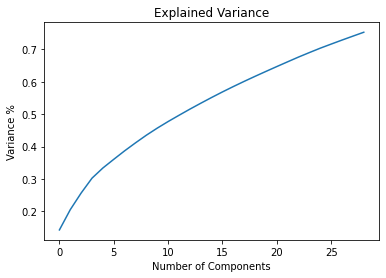

In [253]:
#Lets use PCA for dimensionality reduction
pca = PCA(n_components=29)
x_pca=pca.fit_transform(x)
print("vraiance :{}".format(np.sum(pca.explained_variance_ratio_)))
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance %')
plt.title('Explained Variance')
plt.show()

# Creating Model
## Finding the best random state among all the models
As target column contains continuous data , so we have to understand this by Regression Algorithm

In [254]:
maxAcc = 0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = i)
    modDTR =  DecisionTreeRegressor()
    modDTR.fit(x_train,y_train)
    pred = modDTR.predict(x_test)
    acc  = r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc=acc
        maxRS=i
print(f"Best Accuracy is: {maxAcc} on random_state: {maxRS}")

Best Accuracy is: 0.8040734597694532 on random_state: 34


### Creating train-test-split

In [255]:
# creating new train test split using the random state.
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = .20, random_state = 28)

## Linear Regression

In [256]:
# Checking r2score for Linear Regression
LR = LinearRegression()
LR.fit(x_train,y_train)

# prediction
predLR=LR.predict(x_test)
print('R2_score:',r2_score(y_test,predLR))
print('Mean abs error:',mean_absolute_error(y_test, predLR))
print('Mean squared error:',mean_squared_error(y_test, predLR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predLR)))

R2_score: 0.8902107705211676
Mean abs error: 17471.11287971289
Mean squared error: 499031138.7062404
Root Mean Squared Error:  22339.0048727834


## Checking the performance of the model by graph

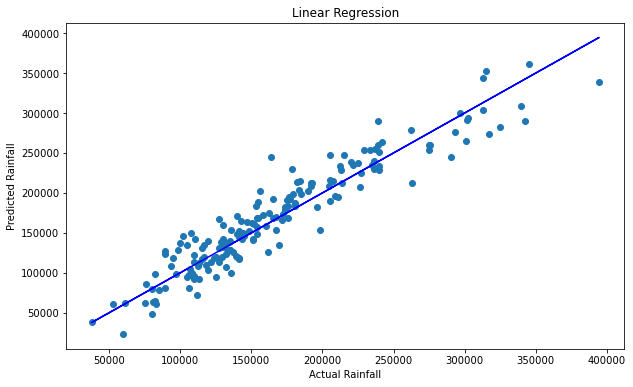

In [257]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predLR,cmap='set1')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Linear Regression")
plt.show()

## Random forest Regression Model

In [258]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor(n_estimators=600, random_state=28)
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
print('R2_Score:',r2_score(y_test,predRFR))
print('Mean abs error:',mean_absolute_error(y_test, predRFR))
print('Mean squared error:',mean_squared_error(y_test, predRFR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predRFR)))

R2_Score: 0.90138755786864
Mean abs error: 15961.309952651516
Mean squared error: 448228660.68937784
Root Mean Squared Error:  21171.411400503694


## Checking the performance of the model by graph

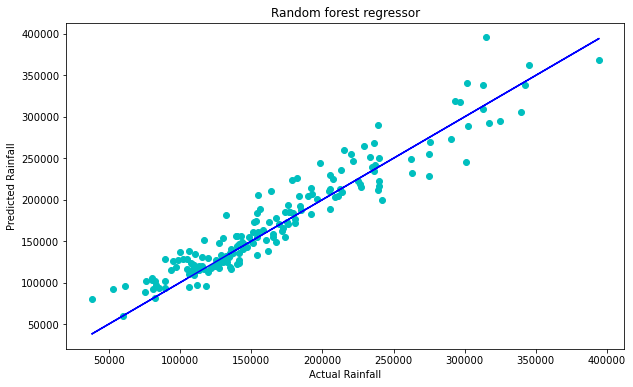

In [259]:
#Verifying the performance of the model by graph
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predRFR,color='c')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Random forest regressor")
plt.show()

# KNN Regressor

In [260]:
# Checking R2 score for KNN regressor
knn=KNeighborsRegressor(n_neighbors=9 )
knn.fit(x_train,y_train)

#prediction
predknn=knn.predict(x_test)
print('R2_Score:',r2_score(y_test,predknn))
print('Mean abs error:',mean_absolute_error(y_test, predknn))
print('Mean squared error:',mean_squared_error(y_test, predknn))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predknn)))

R2_Score: 0.8417360162194223
Mean abs error: 20780.01452020202
Mean squared error: 719366156.5630612
Root Mean Squared Error:  26821.002154339072


## Checking the performance of the model by graph

Text(0.5, 1.0, 'K-nearest neighbors  regressor')

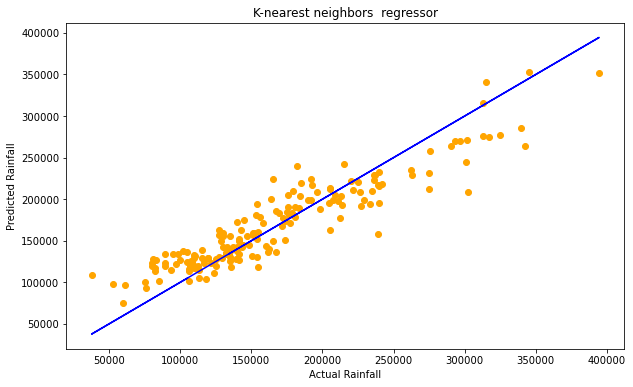

In [261]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predknn,color='orange')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("K-nearest neighbors  regressor")

## Support Vector Regression Model

In [262]:
# Checking R2 score for svr
sv= SVR(kernel='linear')
sv.fit(x_train,y_train)

#prediction
predsv=sv.predict(x_test)
print('R2_Score:',r2_score(y_test,predsv))
print('Mean abs error:',mean_absolute_error(y_test, predsv))
print('Mean squared error:',mean_squared_error(y_test, predsv))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predsv)))

R2_Score: 0.14091914701557784
Mean abs error: 48510.318098009535
Mean squared error: 3904828354.66297
Root Mean Squared Error:  62488.62580232478


## Checking the performance of the model by graph

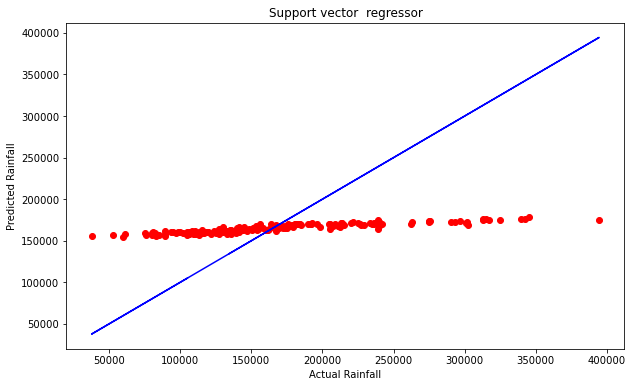

In [263]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predsv,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Support vector  regressor")
plt.show()

# Grdient boosting Regressor

In [264]:
# Checking R2 score for GBR
Gb= GradientBoostingRegressor(n_estimators=400,  random_state=29, learning_rate=0.1, max_depth=3)
Gb.fit(x_train,y_train)

#prediction
predGb=Gb.predict(x_test)
print('R2_Score:',r2_score(y_test,predGb))
print('Mean abs error:',mean_absolute_error(y_test, predGb))
print('Mean squared error:',mean_squared_error(y_test, predGb))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predGb)))

R2_Score: 0.9122354161264967
Mean abs error: 13928.84888571393
Mean squared error: 398921282.500829
Root Mean Squared Error:  19973.013856221824


# Checking the performance of the model by graph

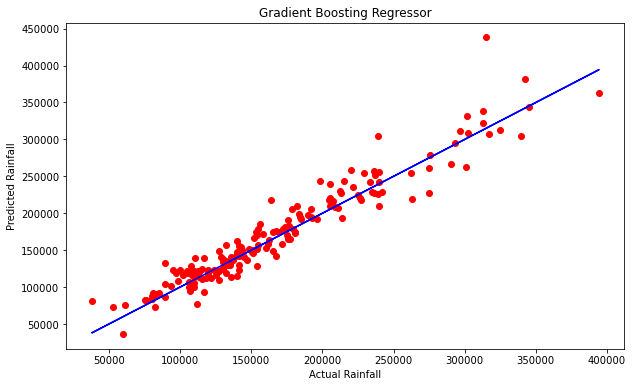

In [265]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predGb,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Gradient Boosting Regressor")
plt.show()

# Decision Tree Regressor

In [266]:
# Checking R2 score for GBR
DTR= DecisionTreeRegressor()
DTR.fit(x_train,y_train)

#prediction
predDTR=DTR.predict(x_test)
print('R2_Score:',r2_score(y_test,predDTR))
print('Mean abs error:',mean_absolute_error(y_test, predDTR))
print('Mean squared error:',mean_squared_error(y_test, predDTR))
print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y_test,predDTR)))

R2_Score: 0.6274725970313502
Mean abs error: 25651.767045454544
Mean squared error: 1693269685.7897727
Root Mean Squared Error:  41149.3582670468


## Checking the performance of the model by graph

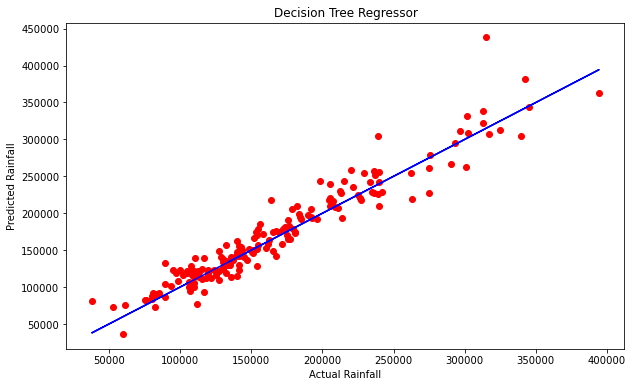

In [267]:
plt.figure(figsize=(10,6))
plt.scatter(x=y_test,y=predGb,color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual Rainfall")
plt.ylabel("Predicted Rainfall")
plt.title("Decision Tree Regressor")
plt.show()

# Cross Validation Score for all the model

In [268]:
#CV Score for Linear Regression
print('CV score for Linear Regression: ',cross_val_score(LR,x,y,cv=5).mean())

#CV Score for Random Forest Regression
print('CV score for Random forest Regression: ',cross_val_score(RFR,x,y,cv=5).mean())

#CV Score for KNN Regression
print('CV score for KNN Regression: ',cross_val_score(knn,x,y,cv=5).mean())

#CV Score for Support Vector Regression
print('CV score for Support Vector  Regression: ',cross_val_score(sv,x,y,cv=5).mean())

#CV Score for Gradient Boosting Regression
print('CV score for Gradient Boosting Regression: ',cross_val_score(Gb,x,y,cv=5).mean())

#CV Score for Decision Tree Regression
print('CV score for Decision Tree Regression: ',cross_val_score(DTR,x,y,cv=5).mean())

CV score for Linear Regression:  0.8591273605000366
CV score for Random forest Regression:  0.8501230863363538
CV score for KNN Regression:  0.7903143606802473
CV score for Support Vector  Regression:  0.08900628853391453
CV score for Gradient Boosting Regression:  0.8833735741416137
CV score for Decision Tree Regression:  0.636120512740127


### So accroding to the R2 score and Cross validation score of all the model we can see that the best model is gradient boosting regressor
# Hyper Parameter Tuning
## The Gradient boosting regressor with GridsearchCV

In [269]:
parameter = {'n_estimators':[100,200,300,400],
             'learning_rate':[0.1,0.01,0.001,1],
             'subsample': [0.1,0.2,0.3,0.5,1],
             'max_depth':[1,2,3,4],
             'alpha':[0.1,0.01,0.001,1]}

In [270]:
CV_GBR = GridSearchCV(GradientBoostingRegressor(),parameter,cv=6,n_jobs = 3,verbose = 2)

In [271]:
CV_GBR.fit(x_train,y_train)

Fitting 6 folds for each of 1280 candidates, totalling 7680 fits


GridSearchCV(cv=6, estimator=GradientBoostingRegressor(), n_jobs=3,
             param_grid={'alpha': [0.1, 0.01, 0.001, 1],
                         'learning_rate': [0.1, 0.01, 0.001, 1],
                         'max_depth': [1, 2, 3, 4],
                         'n_estimators': [100, 200, 300, 400],
                         'subsample': [0.1, 0.2, 0.3, 0.5, 1]},
             verbose=2)

In [272]:
CV_GBR.best_params_

{'alpha': 0.01,
 'learning_rate': 0.1,
 'max_depth': 3,
 'n_estimators': 400,
 'subsample': 0.5}

## Creating Regressor Model with Gradient Boosting Regressor

In [273]:
GBR = GradientBoostingRegressor(n_estimators=300,alpha=0.001,learning_rate= 0.1, max_depth= 2, subsample = 1)
GBR.fit(x_train, y_train)

GradientBoostingRegressor(alpha=0.001, max_depth=2, n_estimators=300,
                          subsample=1)

In [274]:
#prediction
GBRpred = GBR.predict(x_test)
#R2 score
acc = r2_score(y_test,GBRpred)
print(acc*100)

92.39683026334163


## So after the Hypertuning now we have got a descent accuracy score of 92% on Gradient boosting

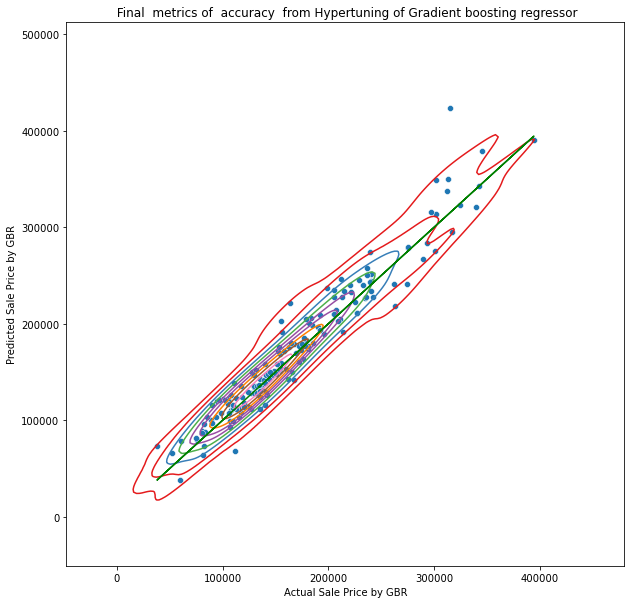

In [275]:
#Verifying the final  performance of the model by graph
plt.figure(figsize=(10,10))
sns.scatterplot(x=y_test,y=GBRpred,palette='Set2')
sns.kdeplot(x=y_test,y=GBRpred, cmap='Set1')
plt.plot(y_test,y_test,color='g')
#Verifying the performance of the model by graph
plt.xlabel("Actual Sale Price by GBR")
plt.ylabel("Predicted Sale Price by GBR")
plt.title(" Final  metrics of  accuracy  from Hypertuning of Gradient boosting regressor")
plt.show()

# Saving The Predictive Model

In [276]:
#saving the model at local file system
filename='Housing_Price_Prediction.pickle'
pickle.dump(CV_GBR,open(filename,'wb'))
#prediction using the saved model
loaded_model = pickle.load(open(filename, 'rb'))
loaded_model.predict(x_test)

array([125471.62637373,  39178.33304068,  88558.5955488 ,  99590.34539764,
       186635.99966717, 320284.15628349, 140143.21844797, 163447.70951464,
       273255.88306027,  73218.92827537, 167813.61807988, 105681.62515989,
       256337.52750862, 111042.84275795, 244484.07357473, 314023.36259615,
       168914.75354019, 166401.48163844, 342949.34533118, 255723.4972627 ,
       151763.02466349, 126763.53078446, 132247.90754379, 319816.47679881,
       145740.66789799, 122651.02966778, 113629.98307552, 132357.38267492,
       226434.97869498, 168998.02818788, 359188.78311301,  91666.4646464 ,
       247409.94071412, 245481.38644081, 124269.71973923, 128684.37737028,
        99898.02670155, 228685.23181325, 164702.53085054, 267926.00365081,
       136727.05249966, 137059.90015068,  99049.54191884, 137556.63284484,
       118330.9035662 , 258921.60770153, 233802.75966824, 198328.24463308,
       144065.84749186,  63539.67811845, 126628.25197706, 250206.95262703,
       187995.54227174, 2

# Checking predicted and original values

In [277]:
import numpy as np
a = np.array(y_test)
predict = np.array(loaded_model.predict(x_test))
Housing_Price_Prediction = pd.DataFrame({"Original":a,"Predicted":predict},index= range(len(a)))
Housing_Price_Prediction

,Original,Predicted
0,105000.0,125471.626374
1,60000.0,39178.333041
2,107000.0,88558.595549
3,89000.0,99590.345398
4,176000.0,186635.999667
5,313000.0,320284.156283
6,135000.0,140143.218448
7,140000.0,163447.709515
8,275000.0,273255.883060
9,82000.0,73218.928275


## Let's plot and visualize

Text(0.5, 1.0, 'Original vs predicted  graph')

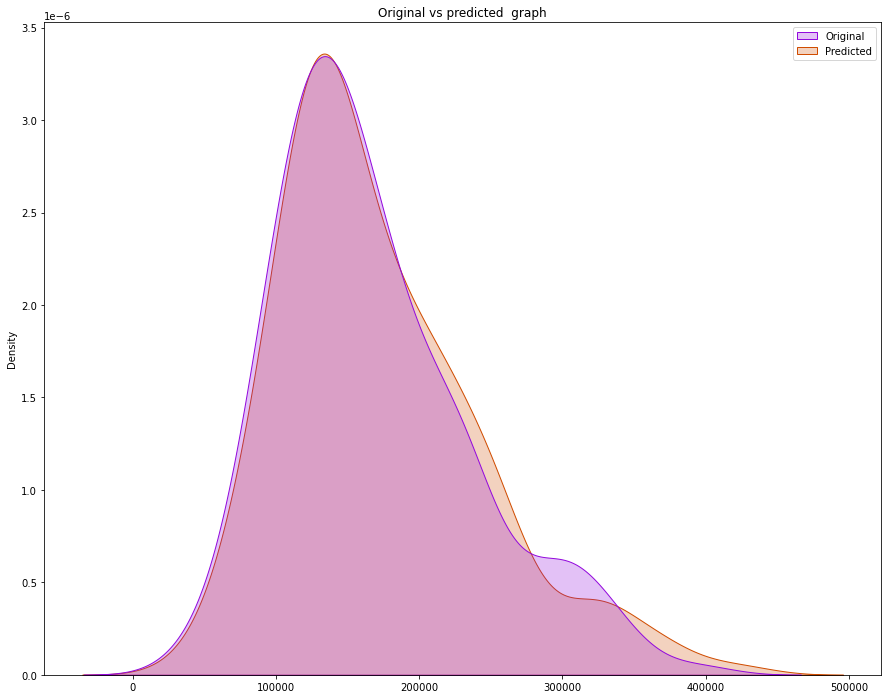

In [278]:
plt.figure(figsize=(15,12))
sns.kdeplot(data=Housing_Price_Prediction, palette='gnuplot',gridsize=900, shade=True)
plt.title('Original vs predicted  graph')

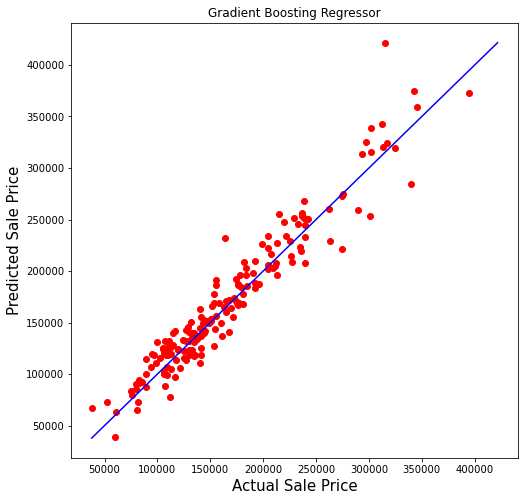

In [279]:
plt.figure(figsize=(8,8))
plt.scatter(y_test,predict,c='r')
plt1 = max(max(predict),max(y_test))
plt2 = min(min(predict),min(y_test))
plt.plot([plt1,plt2],[plt1,plt2],'b-')
plt.xlabel('Actual Sale Price',fontsize=15)
plt.ylabel('Predicted Sale Price',fontsize=15)
plt.title("Gradient Boosting Regressor")
plt.show()

## Saving the model in CSV format

In [280]:
model =Housing_Price_Prediction.to_csv('Housing_Price_Prediction.csv')
model